In [8]:
#!pip install torchmetrics
#!pip install umap-learn
#!pip install umap-learn[plot]
#!pip install -U scikit-learn

In [428]:
import os
import re
import math
import itertools as i
from itertools import cycle

import numpy as np 
import pandas as pd

from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.image as mpimg # For seeing an image 
import seaborn as sns
from seaborn import load_dataset, pairplot, scatterplot
from mpl_toolkits import mplot3d
import graphviz

import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

import scipy
from scipy.optimize import minimize, root, fsolve
from scipy.signal import argrelextrema
from scipy.integrate import odeint
from scipy.stats import pearsonr

import sklearn
from sklearn import datasets, linear_model, svm
from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import r2_score, accuracy_score, mean_absolute_error, mean_squared_error, classification_report, confusion_matrix, roc_curve, auc, RocCurveDisplay
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, KFold, LeaveOneOut, GridSearchCV
from sklearn.cross_decomposition import PLSRegression
from sklearn.compose import make_column_transformer
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder, label_binarize, OneHotEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn import svm
from sklearn.svm import SVC
from sklearn.svm import SVR
from sklearn import tree
from sklearn.multiclass import OneVsRestClassifier
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier
from sklearn.cluster import SpectralClustering
from sklearn.datasets import load_digits, fetch_olivetti_faces
from sklearn.decomposition import NMF

from umap import UMAP
import umap.plot

import torch
import torch.optim as optim # To choose the optimizer
from torch.autograd import Variable # To define the hidden state in the RNN to be a variable
import torch.nn as nn # To build the neural network layers
import torch.nn.functional as F # To use non-linear function (Eg: Relu)
from torch.utils.data import DataLoader, TensorDataset
from torchmetrics import Accuracy
#from torchvision import datasets # To load CIFAR datasets
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor # To transform the image to a tensor
from torch.utils.data import DataLoader # To wrap an iterative over the image folder
import torchvision.datasets as dsets

import cv2
sns.set(context="notebook", palette="Spectral", style="darkgrid", font_scale=1.5, color_codes=True)

In [10]:
os.chdir('/content/sample_data/Data')

### 1. Many identification numbers have a certain structure to them. For example, the IIT Madras Roll numbers are of the form: “Alphabet-Alphabet-Num-Num-Alphabet-Num-Num-Num”. Now write a python program that takes in a string as input and reports if the string is in concurrence with the structure. Do this for:
### a. The IITM ID (Structure above)
### b. The PAN ID (Structure: AAAAANNNNM, where A is alphabet and N is a number)

In [11]:
def ValidPANNumber(panCardNo):
    regex = r"[A-Z]{5}[0-9]{4}[A-Z]{1}"
    p = re.compile(regex)
    if(panCardNo == None):
        return 'No PAN Number has been supplied'
    if(re.search(p, panCardNo) and len(panCardNo) == 10):
        return 'Valid PAN number'
    else:
        return 'Invalid PAN number'

    
def ValidIITMRollNo(RollNo):
    regex = r"[A-Z]{2}[0-9]{2}[A-Z]{1}[0-9]{3}"
    p = re.compile(regex)
    if(RollNo == None):
        return 'No Roll Number has been supplied'
    if(re.search(p, RollNo) and len(RollNo) == 8):
        return 'Valid Roll number'
    else:
        return 'Invalid Roll number'
print('========== a. The IITM ID (Structure above)===========')

validRollNo = "CH22M503"
invalidRollNo = "CHM22503"
print(ValidIITMRollNo(validRollNo.upper()))
print(ValidIITMRollNo(invalidRollNo.upper()))

print('========== b. The PAN ID (Structure: AAAAANNNNM, where A is alphabet and N is a number) ===========')

validpanCardNo = "AQGPB1799R"
invalidpanCardNo = "AQGP81799R5"
print(ValidPANNumber(validpanCardNo.upper()))
print(ValidPANNumber(invalidpanCardNo.upper()))


========== a. The IITM ID (Structure above)===========
Valid Roll number
Invalid Roll number
========== b. The PAN ID (Structure: AAAAANNNNM, where A is alphabet and N is a number) ===========
Valid PAN number
Invalid PAN number


### 2. Following a proper diet is necessary for maintaining health. The dietician suggests that every meal the following nutritional requirements need to be met:
###  a. Carbohydrates - Not more than 300 units
### b. Fats - Not more than 150 units
### c. Proteins - More than 80 units but not more than 500 units
### d. Vitamins - More than 10 units but not more than 100 units
### e. Minerals - More than 10 units but not more than 50 units
### Provided below is the menu at a mess that you’ll be eating one meal a day the rest of this semester (This mess does not necessarily reflect reality). Given that you can choose only one item, find all the combinations of the food items that satisfy the dietician’s criteria.

#### Name Carbs Fats Proteins Vitamins Minerals 
#### Rice 195   12    12         5      7

#### Veg
#### Curry 50   36    42         23     3

#### Cheese
#### burger 203 95   150         63     27

#### Potato 
#### Chips  78  78   25          14     12

#### Roti   76  20   34          14     6

#### Soft
#### Drink  98   7    8          9      21

In [12]:
nutrition_data = pd.read_excel('NutritionData.xlsx')

number_of_food_item_to_be_taken = 2


combination_food = list(i.combinations(nutrition_data['Name'],number_of_food_item_to_be_taken))

def CalculateNutrition(comb_data, nutrition_data):
    total_carbs = 0
    total_fats = 0
    total_proteins = 0
    total_vitamins = 0
    total_minerals = 0
    
    for i in range(len(comb_data)):
        data = nutrition_data[nutrition_data['Name'] == comb_data[i]]
        total_carbs += float(data.Carbs)
        total_fats += float(data.Fats)
        total_proteins += float(data.Proteins)
        total_vitamins += float(data.Vitamins)  
        total_minerals += float(data.Minerals)  
    
    if(total_carbs<=300 and total_fats<=150 and (total_proteins>80 and total_proteins<=500) and (total_vitamins>10 and total_vitamins<=100) and (total_minerals>10 and total_minerals<=50)):
        print(f'{comb_data} is a valid combination of food can be consumed for maintaining good health')
    else:
        print(f'{comb_data} is not a valid combination of food can be consumed for maintaining good health')

for each_comb in combination_food:
    CalculateNutrition(each_comb, nutrition_data)

('Rice', 'Veg Curry') is not a valid combination of food can be consumed for maintaining good health
('Rice', 'Cheeseburger') is not a valid combination of food can be consumed for maintaining good health
('Rice', 'Potato Chips') is not a valid combination of food can be consumed for maintaining good health
('Rice', 'Roti') is not a valid combination of food can be consumed for maintaining good health
('Rice', 'Soft Drink') is not a valid combination of food can be consumed for maintaining good health
('Veg Curry', 'Cheeseburger') is a valid combination of food can be consumed for maintaining good health
('Veg Curry', 'Potato Chips') is not a valid combination of food can be consumed for maintaining good health
('Veg Curry', 'Roti') is not a valid combination of food can be consumed for maintaining good health
('Veg Curry', 'Soft Drink') is not a valid combination of food can be consumed for maintaining good health
('Cheeseburger', 'Potato Chips') is not a valid combination of food can

# Python Basics:

## Control statements:

In [13]:
#Control Statements: if and else
a = 9
if a>10:
    print(f"{a} is greater than 10")
else:
    print(f"{a} is lesser than 10")

9 is lesser than 10


In [14]:
#Control Statements: if, elif and else
a = 0
if a>10:
    print(f"{a} is greater than 10")
elif a==0:
    print("The number is zero")
else:
    print(f"{a} is lesser than 10")

The number is zero


In [15]:
#Looping: for
for i in range(10):
    print(i)

0
1
2
3
4
5
6
7
8
9


In [16]:
#Looping: for
for i in ["a","b","c"]:
    print(i)

a
b
c


In [17]:
#Looping: while
i = 10
while i>9:
    print(i)
    break

10


In [18]:
#Control Statement: break
while i>9:
    print(i)
    break

10


In [19]:
for i in range(2):    
    print(i)

0
1


In [20]:
#Control Statement: continue
for i in range(10):
    if i>5:
        continue
    print(i)

0
1
2
3
4
5


In [21]:
#Control Statement: pass
for i in range(10):
    if i>5:
        pass
    print(i)

0
1
2
3
4
5
6
7
8
9


## Functions:

In [22]:
#Function definition
def add(a,b):
    return a + b
add(1,2)

3

In [23]:
#Built in functions: range, len, abs, max, min ... and many more
test = [-1,-2,3,4,8,90]
len(test)

6

## Object Oriented Programming:

In [24]:
#Class and attributes
class Car:
    model = "maruthi"
    number = 2033

In [25]:
car = Car()

In [26]:
car.model = 'toyota'
car.model

'toyota'

In [27]:
#Method
class Car:
    def __init__(self, model, number):
        self.model = model
        self.number = number
    def mod_num(self):
        print(f"The car model is {self.model} and number is {self.number}")

In [28]:
#Method examples
car = Car("toyota",1234)
car.model

'toyota'

In [29]:
car.mod_num()

The car model is toyota and number is 1234


In [30]:
#Inheritance
class Car:
    def __init__(self, model, number):
        self.model = model
        self.number = number
    def mod_num(self,model):
        return model

class Engine(Car):
    def __init__(self, model, engine):
        self.engine = engine
        self.model = model
    def mod_engine(self):
        print(f"The car model is {self.mod_num(self.model)} and number is {self.engine}")

In [31]:
Engine('toyota','v6').mod_engine()

The car model is toyota and number is v6


#### The single underscore in Python "_" is used to either make a variable different from a Python keyword such as in float_=8, or to indicate that it should be used in a private context such as in _var=8

#### The double underscore in Python "__" (called “dunder“) is used to make an instance attribute or method private that cannot be accessed from outside the class) when used as a leading dunder prefix. When used as enclosing dunder such as in "__init__", it indicates that it is a special method in Python called “magic method”.

In [32]:
#Encapsulation
class Car:
    def __init__(self):
        self.__model = 'toyota'
    def sell(self):
        print(f"I am selling my {self.__model} car")
        
car = Car()
car.__model = 1000
car.sell()

I am selling my toyota car


In [33]:
#Polymorphism
class Car:
    def __init__(self):
        self.model = 'toyota'
    def sell(self):
        print(f"I am selling my {self.model} car")
class Maruthi(Car):
    def __init__(self):
        self.model = 'maruthi'
    def sell(self):
        print(f"I am selling my {self.model} car")
        
Maruthi().sell()

I am selling my maruthi car


# NumPy:

In [34]:
test = [i for i in range(10000)]
%timeit test1 = [i + 10 for i in test]

692 µs ± 193 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [35]:
test = np.asarray(test)
%timeit test1 = test+10

5.52 µs ± 191 ns per loop (mean ± std. dev. of 7 runs, 100000 loops each)


In [36]:
#Array creation
ar1 = np.arange(20)
ar1

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

In [37]:
np.linspace(20, 145, 5)

array([ 20.  ,  51.25,  82.5 , 113.75, 145.  ])

In [38]:
ar1.shape

(20,)

In [39]:
ar1.size

20

In [40]:
ar1.ndim

1

In [41]:
ar1.reshape(5,4)

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11],
       [12, 13, 14, 15],
       [16, 17, 18, 19]])

In [42]:
ar1**2

array([  0,   1,   4,   9,  16,  25,  36,  49,  64,  81, 100, 121, 144,
       169, 196, 225, 256, 289, 324, 361])

In [43]:
ar1 + 2

array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21])

In [44]:
#Elementwise operations
ar1 - ar1

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [45]:
ar1 - np.random.rand(20)

array([-0.81709544,  0.18378656,  1.52717727,  2.06299657,  3.41543973,
        4.87570268,  5.21846839,  6.51247832,  7.31040841,  8.29865881,
        9.59426593, 10.92782725, 11.45091815, 12.64789137, 13.16603868,
       14.47525966, 15.53313969, 16.64990867, 17.8770171 , 18.73384777])

In [46]:
#Indexing and slicing
ar1[0]

0

In [47]:
ar1[:3]

array([0, 1, 2])

In [48]:
ar1[[1,4,5]]

array([1, 4, 5])

In [49]:
#Boolean arrays
ar1>5

array([False, False, False, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True])

In [50]:
#Matrix multiplication
ar1*ar1

array([  0,   1,   4,   9,  16,  25,  36,  49,  64,  81, 100, 121, 144,
       169, 196, 225, 256, 289, 324, 361])

In [51]:
ar1@ar1

2470

In [52]:
np.dot(ar1,ar1)

2470

In [53]:
#Linear algebra functions: inv, norm, dot, vdot, svd, eig, eigh and many more
np.linalg.pinv(np.arange(16).reshape((4,4)))

array([[-2.62500000e-01, -1.37500000e-01, -1.25000000e-02,
         1.12500000e-01],
       [-1.00000000e-01, -5.00000000e-02,  1.67384258e-17,
         5.00000000e-02],
       [ 6.25000000e-02,  3.75000000e-02,  1.25000000e-02,
        -1.25000000e-02],
       [ 2.25000000e-01,  1.25000000e-01,  2.50000000e-02,
        -7.50000000e-02]])

# pandas

In [54]:
#Load data functions: read_csv, read_excel
iris = sns.load_dataset('iris')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [55]:
iris.tail()

,sepal_length,sepal_width,petal_length,petal_width,species
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica
149,5.9,3.0,5.1,1.8,virginica


In [56]:
#Indexing
iris['sepal_length']

0      5.1
1      4.9
2      4.7
3      4.6
4      5.0
      ... 
145    6.7
146    6.3
147    6.5
148    6.2
149    5.9
Name: sepal_length, Length: 150, dtype: float64

In [57]:
iris['sepal_length'][0]

5.1

In [58]:
iris.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width',
       'species'],
      dtype='object')

In [59]:
iris.index

RangeIndex(start=0, stop=150, step=1)

In [60]:
iris.iloc[1,1]

3.0

In [61]:
#Statistics: mean, std, median, mode
iris['sepal_length'].mean()

5.843333333333334

In [62]:
#Summary
iris.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [63]:
#Dropping
iris.dropna()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [64]:
iris.dropna(inplace=True)

In [65]:
iris.drop_duplicates()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [66]:
#Grouping
iris.groupby("species").mean()

,sepal_length,sepal_width,petal_length,petal_width
species,,,,
setosa,5.006,3.428,1.462,0.246
versicolor,5.936,2.770,4.260,1.326
virginica,6.588,2.974,5.552,2.026


In [67]:
iris['species'].value_counts()

setosa        50
versicolor    50
virginica     50
Name: species, dtype: int64

In [68]:
iris['new'] = iris['sepal_length'] + 2

In [69]:
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species,new
0,5.1,3.5,1.4,0.2,setosa,7.1
1,4.9,3.0,1.4,0.2,setosa,6.9
2,4.7,3.2,1.3,0.2,setosa,6.7
3,4.6,3.1,1.5,0.2,setosa,6.6
4,5.0,3.6,1.4,0.2,setosa,7.0


In [70]:
iris.drop('new',axis=1)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [71]:
iris.sort_values(by=['sepal_length'],ascending=True)

,sepal_length,sepal_width,petal_length,petal_width,species,new
13,4.3,3.0,1.1,0.1,setosa,6.3
42,4.4,3.2,1.3,0.2,setosa,6.4
38,4.4,3.0,1.3,0.2,setosa,6.4
8,4.4,2.9,1.4,0.2,setosa,6.4
41,4.5,2.3,1.3,0.3,setosa,6.5
...,...,...,...,...,...,...
122,7.7,2.8,6.7,2.0,virginica,9.7
118,7.7,2.6,6.9,2.3,virginica,9.7
117,7.7,3.8,6.7,2.2,virginica,9.7
135,7.7,3.0,6.1,2.3,virginica,9.7


# [Optimization:](https://docs.scipy.org/doc/scipy/reference/optimize.html?highlight=optimize#module-scipy.optimize) 
1. **Objective Function:**$$4x^3-3x^2+2x+1$$

In [72]:
#Define objective function
def objective(x):
    return 4*x**3 - 3*x**2 + 2*x+ 1

## [Finding roots:](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.root.html)

In [73]:
root(objective,1)

 message: The solution converged.
 success: True
  status: 1
     fun: [ 0.000e+00]
       x: [-3.045e-01]
    nfev: 14
    fjac: [[-1.000e+00]]
       r: [-4.939e+00]
     qtf: [-4.147e-12]

In [74]:
#Inputs and outputs
inputs = np.arange(-20,20,0.1)
f_x = objective(inputs)

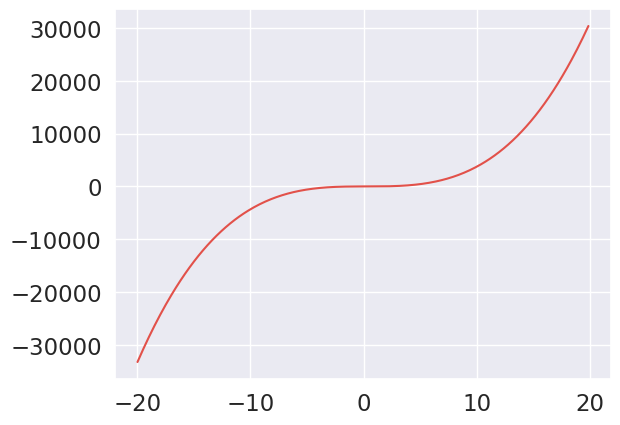

In [75]:
#Plot
plt.plot(inputs,f_x)
plt.show()

## [Local minima and maxima:](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.argrelextrema.html)

In [76]:
#Local Maxima
argrelextrema(f_x,np.greater)

(array([], dtype=int64),)

In [77]:
#Local Minima
argrelextrema(f_x,np.less)

(array([], dtype=int64),)

##  [Minimize Function:](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html)
$$sin(x)+cos(x)$$

In [78]:
def objective(x):
    return np.sin(x) + np.cos(x)

In [79]:
inputs = np.arange(-20,20,0.01)
f_x = objective(inputs)

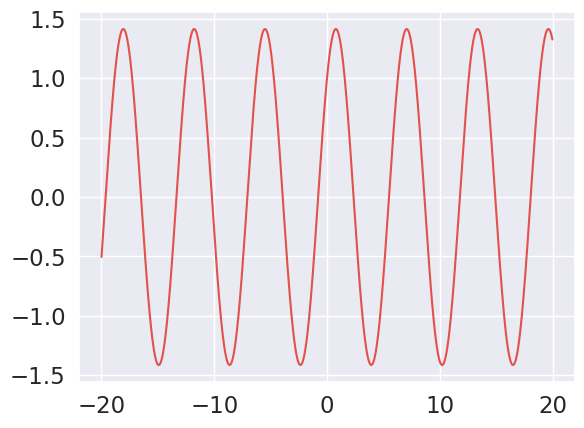

In [80]:
plt.plot(inputs,f_x)

In [81]:
#Minimize with initial conditions
minimize(objective,1)

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: -1.4142135623712089
        x: [ 3.927e+00]
      nit: 3
      jac: [ 2.325e-06]
 hess_inv: [[ 7.075e-01]]
     nfev: 18
     njev: 9

In [82]:
inputs[argrelextrema(f_x,np.greater)[0]]

array([-18.06, -11.78,  -5.5 ,   0.79,   7.07,  13.35,  19.63])

In [83]:
inputs[argrelextrema(f_x,np.less)[0]]

array([-14.92,  -8.64,  -2.36,   3.93,  10.21,  16.49])

## Multiple Variable Case:
$$x^2+y^2$$

In [84]:
def objective(X):
    x = X[0]
    y = X[1]
    return x**2 + y**2

In [85]:
minimize(objective,(0,0))

  message: Optimization terminated successfully.
  success: True
   status: 0
      fun: 0.0
        x: [ 0.000e+00  0.000e+00]
      nit: 0
      jac: [ 1.490e-08  1.490e-08]
 hess_inv: [[1 0]
            [0 1]]
     nfev: 3
     njev: 1

In [86]:
xaxis = np.arange(-10,10)
yaxis = np.arange(-10,10)
x, y = np.meshgrid(xaxis, yaxis)

In [87]:
f_x_y = objective([x,y])

## [3D surface plots:](https://matplotlib.org/stable/gallery/mplot3d/surface3d.html)

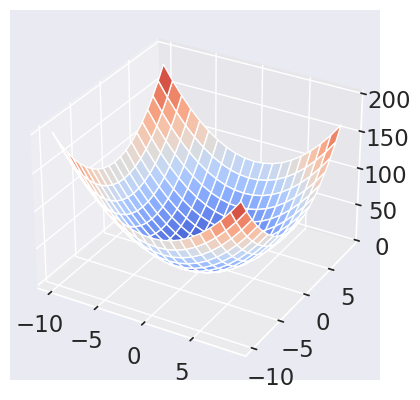

In [88]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
ax.plot_surface(x,y,f_x_y,cmap=cm.coolwarm)

## [Contour plots:](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.contour.html)

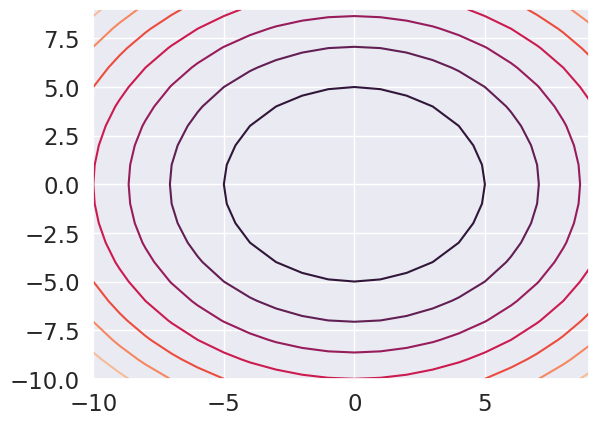

In [89]:
plt.contour(x,y,f_x_y)

# [Integration:](https://docs.scipy.org/doc/scipy/tutorial/integrate.html)
$$\frac{dy}{dt} = -ky$$

In [90]:
#Define system of differential equations
def model(y,t,k):
    dydt = -k*y
    return dydt

## [odeint:](https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.odeint.html) Integration

In [91]:
#Initial value
y0 = 5

# time points
t = np.linspace(0,20)
k = 0.5

# solve ODE
y = odeint(model,y0,t,args = (k,))

Text(0.5, 1.0, 'Numerical Integration')

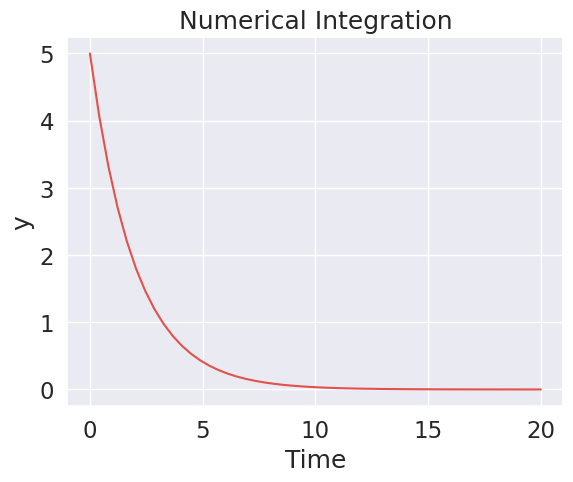

In [92]:
#Plotting
plt.plot(t,y)
plt.xlabel('Time')
plt.ylabel('y')
plt.title('Numerical Integration')

## System of differential equations:

$$\dot{x_1} = x_1(1-x_1-x_2)$$
$$\dot{x_2} = x_2(0.75-x_2-0.5x_1)$$

In [93]:
#Define system of differential equations
def model(X,t):
    x1 = X[0]
    x2 = X[1]
    dx1dt = x1*(1-x1-x2)
    dx2dt = x2*(0.75-x2-0.5*x1)
    return [dx1dt,dx2dt]

In [94]:
#Initial value
y0 = (5,5)

# time points
t = np.linspace(0,20)

# solve ODE
y = odeint(model,y0,t)

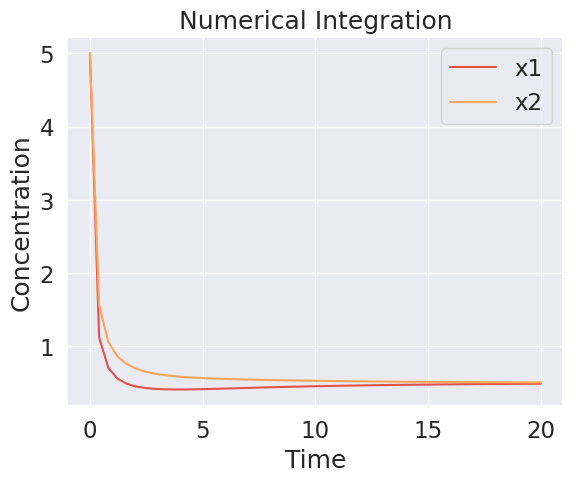

In [95]:
#Plotting
plt.plot(t,y,label=['x1','x2'])
plt.xlabel('Time')
plt.ylabel('Concentration')
plt.title('Numerical Integration')
plt.legend()

## [Steady State values:](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.fsolve.html)

In [96]:
#Define system of differential equations
def model(X):
    x1 = X[0]
    x2 = X[1]
    dx1dt = x1*(1-x1-x2)
    dx2dt = x2*(0.75-x2-0.5*x1)
    return [dx1dt,dx2dt]

In [97]:
fsolve(model,y0)

array([0.5, 0.5])

# [Seaborn:](https://seaborn.pydata.org/)

In [98]:
sns.set_theme()

In [99]:
titanic = sns.load_dataset("titanic")

In [100]:
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [101]:
titanic.dropna(inplace=True)

In [102]:
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
6,0,1,male,54.0,0,0,51.8625,S,First,man,True,E,Southampton,no,True
10,1,3,female,4.0,1,1,16.7000,S,Third,child,False,G,Southampton,yes,False
11,1,1,female,58.0,0,0,26.5500,S,First,woman,False,C,Southampton,yes,True


## [scatterplot:](https://seaborn.pydata.org/generated/seaborn.scatterplot.html)

<Axes: xlabel='fare', ylabel='age'>

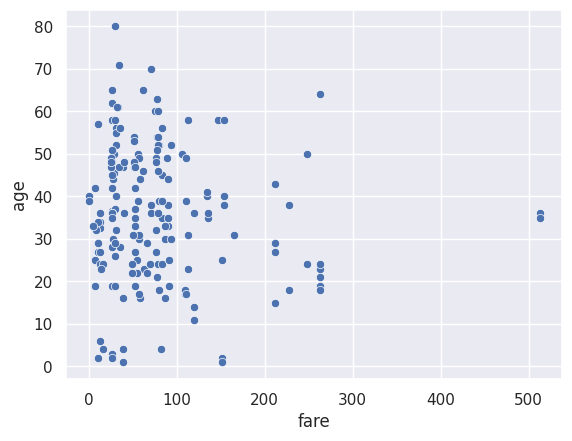

In [103]:
sns.scatterplot(data=titanic, x="fare", y="age")

<Axes: xlabel='fare', ylabel='age'>

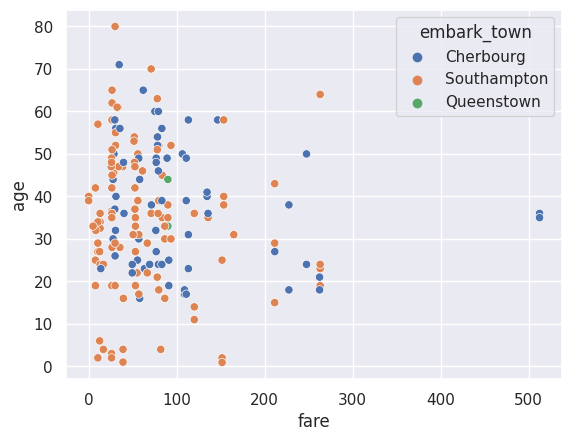

In [104]:
sns.scatterplot(data=titanic, x="fare", y="age",hue="embark_town")

## [lmplot:](https://seaborn.pydata.org/generated/seaborn.lmplot.html#seaborn.lmplot) Linear Regression Plot

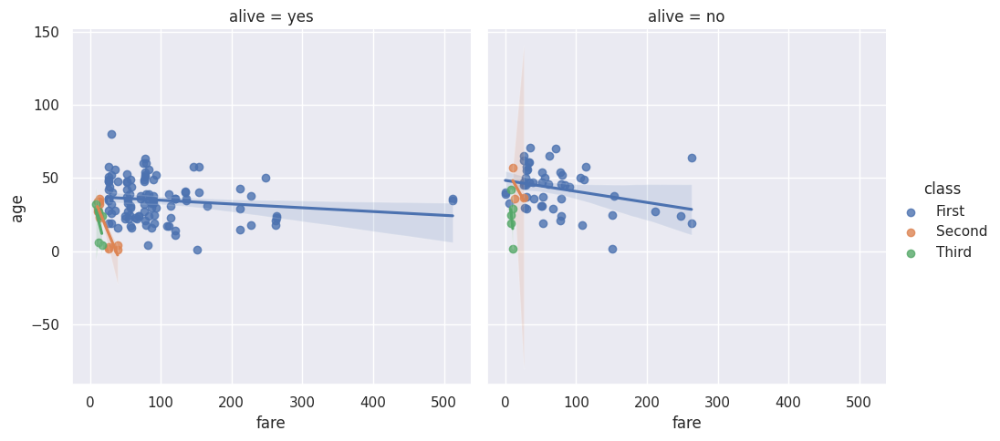

In [105]:
sns.lmplot(data=titanic, x="fare", y="age", col="alive", hue="class")

## [histplot:](https://seaborn.pydata.org/generated/seaborn.histplot.html)

<Axes: xlabel='fare', ylabel='Count'>

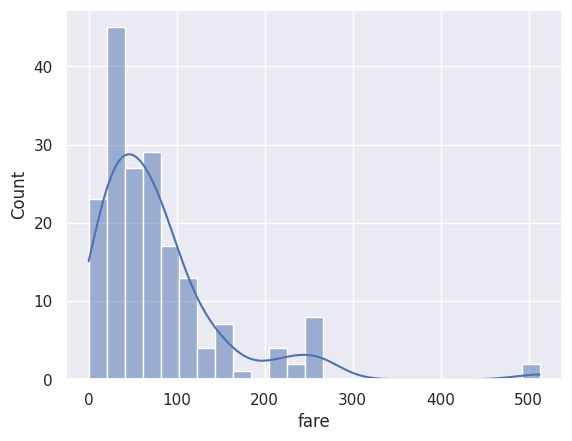

In [106]:
sns.histplot(data=titanic, x="fare",kde=True)

## [boxplot:](https://seaborn.pydata.org/generated/seaborn.boxplot.html)

<Axes: xlabel='fare', ylabel='who'>

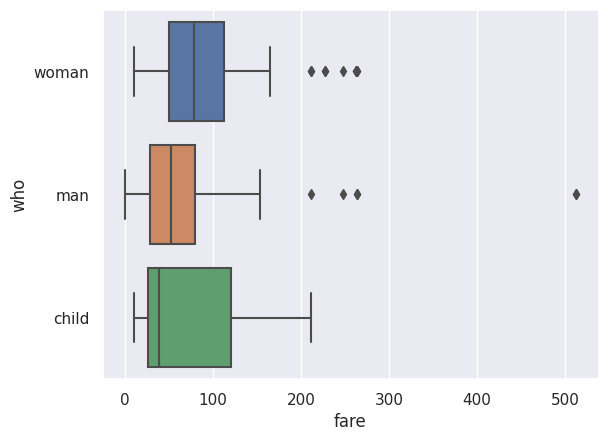

In [107]:
sns.boxplot(data=titanic, x="fare", y="who")

## [catplot:](https://seaborn.pydata.org/generated/seaborn.catplot.html)

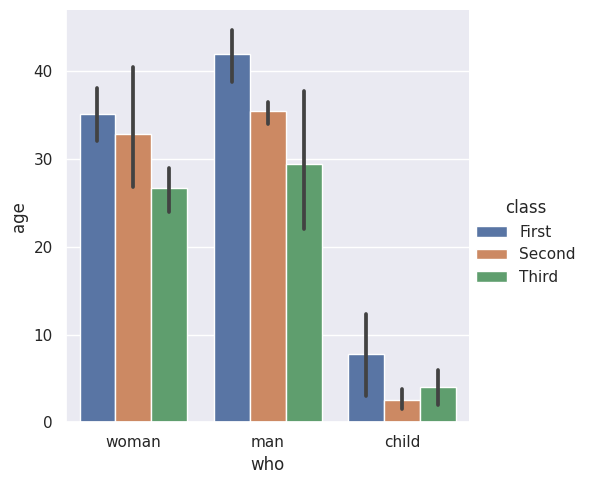

In [108]:
sns.catplot(data=titanic, kind="bar", x="who", y="age", hue="class")

# [Pytorch:](https://pytorch.org/docs/stable/index.html)

## Tensor:

In [109]:
#Tensor from list
ar = [0,1]
ten = torch.tensor(ar)

In [110]:
#Tensor attributes: shape, dtype, device
ten.shape

torch.Size([2])

In [111]:
#Tensor from numpy array
torch.tensor(np.asarray(ar))

tensor([0, 1])

In [112]:
#Back to numpy
torch.tensor(np.asarray(ar)).numpy()

array([0, 1])

In [113]:
torch.ones_like(ten)

tensor([1, 1])

In [114]:
torch.rand_like(ten, dtype=torch.float)

tensor([0.3950, 0.1718])

In [115]:
#ones, zeros, rand
shape = (5,5)
torch.ones(shape)

tensor([[1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.]])

In [116]:
#Concatenate
torch.cat((ten,ten)).shape

torch.Size([4])

In [117]:
ones = torch.ones(shape)

In [118]:
#Matrix multiplication
ones@ones

tensor([[5., 5., 5., 5., 5.],
        [5., 5., 5., 5., 5.],
        [5., 5., 5., 5., 5.],
        [5., 5., 5., 5., 5.],
        [5., 5., 5., 5., 5.]])

In [119]:
#Elementwise multiplication
ones*ones

tensor([[1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1.]])

In [120]:
#sum, mean
ten.sum()

tensor(1)

# Data Processing and Visualization

In [124]:
# Load the diabetes dataset
diabetes_X, diabetes_y = datasets.load_diabetes(return_X_y=True,as_frame=True)
diabetes_X.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641


In [125]:
diabetes_y

0      151.0
1       75.0
2      141.0
3      206.0
4      135.0
       ...  
437    178.0
438    104.0
439    132.0
440    220.0
441     57.0
Name: target, Length: 442, dtype: float64

In [126]:
# Assign variables
X = diabetes_X['bmi']
y = diabetes_y

Text(0, 0.5, 'Disease Progression')

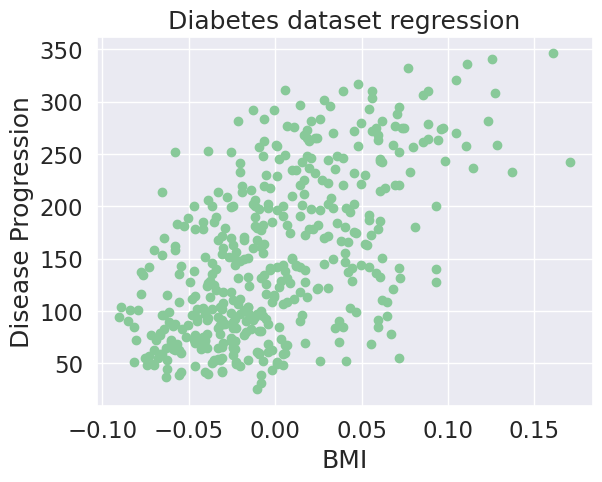

In [127]:
#Plot the dataset to visualize how to solve the problem
plt.scatter(X,y,color = '#88c999') #Scatter plot
plt.title('Diabetes dataset regression') #Set title
plt.xlabel('BMI') #Set x axis label
plt.ylabel('Disease Progression') #Set y axis label

# OLS (Ordinary Least Squares) Solution

In [128]:
X_mean = X.mean() # Mean of X
y_mean = y.mean() # Mean of Y
Sxx = np.sum((X - X_mean)**2) #Sum of Squares of X
Sxy = np.sum((X - X_mean)*(y-y_mean)) # Sum of Squares of Products of X and Y
Syy = np.sum((y-y_mean)**2) #Sum of Squares of Y

# The solution in the OLS case is: $$\hat{\alpha} = \frac{S_{xy}}{S_{xx}}$$  $$\hat{\beta} = \bar{y} - \hat{\alpha}\bar{x}$$


In [129]:
alpha = Sxy/Sxx #alpha calculation
alpha

949.4352603840387

In [130]:
beta = y_mean - alpha*X_mean #beta calculation
beta

152.13348416289617

In [131]:
#Function for prediction
def predict(alpha,beta,X):
    return alpha*X + beta

#Utility function for printing predictions
def print_predictions(prog,prog_pred):
    df_pred = pd.DataFrame({'Progression_measured':prog,'Progression_predicted':prog_pred,'Error':prog-prog_pred})
    return df_pred

#Utility function for plotting
def plot_predictions(prog,prog_pred):
    plt.scatter(prog,prog_pred)
    plt.title('Progression predicted vs measured') #Set title
    plt.ylabel('Progression predicted') #Set y axis label
    plt.xlabel('Progression measured') #Set x axis label
    plt.axline((0, 0), slope=1, c = 'red',label='Perfect fit line') #Plot perfect fit line
    plt.legend() #Legends

In [132]:
y_pred_ols = [predict(alpha,beta,X_i) for X_i in X] #Predicted progression based on alpha and beta
df_ols = print_predictions(y,y_pred_ols)
df_ols.head()

,Progression_measured,Progression_predicted,Error
0,151.0,210.710038,-59.710038
1,75.0,103.262195,-28.262195
2,141.0,194.337033,-53.337033
3,206.0,141.124769,64.875231
4,135.0,117.588574,17.411426


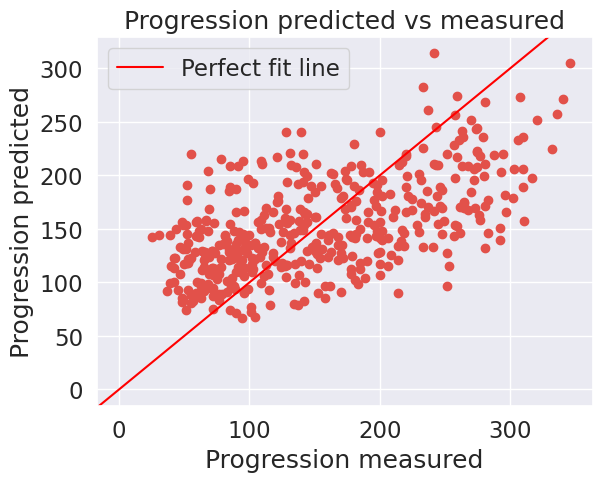

In [133]:
plot_predictions(y,y_pred_ols)

# Metrics for comparison:

# Coefficient of determination: $$R^2 = 1 - \frac{RSS}{TSS}$$

# Mean Average Error: $$MAE = \frac{1}{N}\sum_{i=1}^{N}(y_i - \hat{y_i})$$

# Mean Squared Error: $$MSE = \frac{1}{N}\sum_{i=1}^{N}(y_i - \hat{y_i})^2$$

# Root Mean Squared Error: $$RMSE = \sqrt{\frac{1}{N}\sum_{i=1}^{N}(y_i - \hat{y_i})^2}$$

In [134]:
#Utility function to calculate metrics
def print_metrics(y,y_pred):
    rss = np.sum((y-y_pred)**2) # Sum of Squares of Residuals 
    tss = np.sum((y-y.mean())**2) # Total Sum of Squares 
    r2 = 1 - (rss/tss) #Coefficient of Determination
    mae = np.sum((y-y_pred))/len(y) #Mean Average Error
    mse = np.sum((y-y_pred)**2)/len(y) # Mean Squared Error
    rmse = math.sqrt(mse) # Root Mean Squared Error
    print('The Coefficient of Determination is %s' % r2)
    print('The Mean Average Error is %s' % mae)
    print('The  Mean Squared Error is %s' % mse)
    print('The Root Mean Squared Error is %s' % rmse)
    return r2,mae,mse,rmse

In [135]:
r2_ols,mae_ols,mse_ols,rmse_ols = print_metrics(y,y_pred_ols)

The Coefficient of Determination is 0.3439237602253802
The Mean Average Error is -2.6492634129697854e-14
The  Mean Squared Error is 3890.456585461273
The Root Mean Squared Error is 62.37352471570989


In [136]:
r2_ols,mae_ols,mse_ols,rmse_ols

(0.3439237602253802,
 -2.6492634129697854e-14,
 3890.456585461273,
 62.37352471570989)

# Multiple Regression

$$Y = \beta_0X_0+ \beta_1X_1+ \beta_2X_2+ \beta_2X_3...$$
$$Y = X\beta$$

$$\beta = (X^{'}X)^{-1}X^{'}Y$$

In [137]:
X = diabetes_X.to_numpy()
y = diabetes_y.to_numpy()
X = np.concatenate([np.ones((X.shape[0],1)),X],axis=1)
beta = np.linalg.inv(X.T@X)@X.T@y #Multiple Regression Coefficients

In [138]:
y_pred_ols = X@beta #Predicted progression based on alpha and beta
df_ols = print_predictions(y,y_pred_ols)
df_ols.head()

,Progression_measured,Progression_predicted,Error
0,151.0,206.116677,-55.116677
1,75.0,68.071033,6.928967
2,141.0,176.882790,-35.882790
3,206.0,166.914458,39.085542
4,135.0,128.462258,6.537742


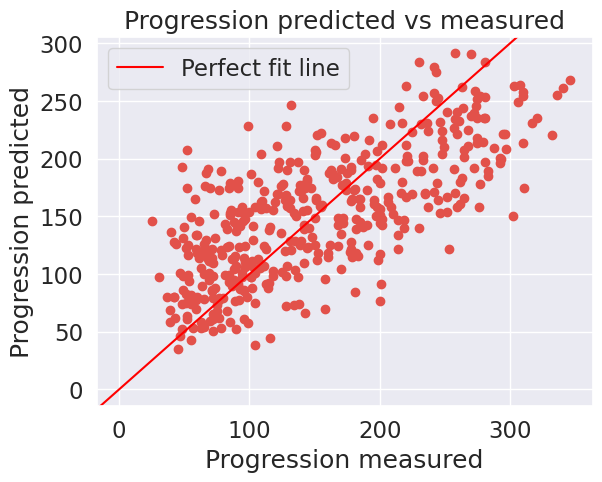

In [139]:
plot_predictions(y,y_pred_ols)

In [140]:
r2_ols,mae_ols,mse_ols,rmse_ols = print_metrics(y,y_pred_ols)

The Coefficient of Determination is 0.5177484222203498
The Mean Average Error is 5.24708481792074e-14
The  Mean Squared Error is 2859.6963475867506
The Root Mean Squared Error is 53.476128764026576


In [141]:
r2_ols,mae_ols,mse_ols,rmse_ols

(0.5177484222203498,
 5.24708481792074e-14,
 2859.6963475867506,
 53.476128764026576)

# Linear Regression with scikit-learn:

In [142]:
#Define Features and Labels
X = diabetes_X.to_numpy()
y = diabetes_y.to_numpy()
model =LinearRegression(fit_intercept=True)

In [143]:
#Fit the model
model.fit(X,y)

LinearRegression()

In [144]:
#Get coefficient of determination
model.score(X,y)

0.5177484222203499

In [147]:
#Model coefficients
model.coef_

array([ -10.0098663 , -239.81564367,  519.84592005,  324.3846455 ,
       -792.17563855,  476.73902101,  101.04326794,  177.06323767,
        751.27369956,   67.62669218])

In [148]:
#Model Intercept
model.intercept_

152.13348416289597

In [149]:
#Get predictions given features
model.predict(X)

array([206.11667725,  68.07103297, 176.88279035, 166.91445843,
       128.46225834, 106.35191443,  73.89134662, 118.85423042,
       158.80889721, 213.58462442,  97.07481511,  95.10108423,
       115.06915952, 164.67656842, 103.07814257, 177.17487964,
       211.7570922 , 182.84134823, 148.00326937, 124.01754066,
       120.33362197,  85.80068961, 113.1134589 , 252.45225837,
       165.48779206, 147.71997564,  97.12871541, 179.09358468,
       129.05345958, 184.7811403 , 158.71516713,  69.47575778,
       261.50385365, 112.82234716,  78.37318279,  87.66360785,
       207.92114668, 157.87641942, 240.84708073, 136.93257456,
       153.48044608,  74.15426666, 145.62742227,  77.82978811,
       221.07832768, 125.21957584, 142.6029986 , 109.49562511,
        73.14181818, 189.87117754, 157.9350104 , 169.55699526,
       134.1851441 , 157.72539008, 139.11104979,  72.73116856,
       207.82676612,  80.11171342, 104.08335958, 134.57871054,
       114.23552012, 180.67628279,  61.12935368,  98.72

# scikit-learn metrics

In [150]:
r2_score(y,y_pred_ols)

0.5177484222203498

In [151]:
mean_absolute_error(y,y_pred_ols)

43.27745202531506

In [152]:
mean_squared_error(y,y_pred_ols,squared=False)

53.476128764026576

# Dataset splitting

In [153]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state = 123) #stratify = y To handle the imbalance dataset

In [154]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [156]:
model.score(X_test,y_test)

0.5078253552814807

In [157]:
model.score(X_train,y_train)

0.5174981091172834

In [158]:
model.coef_

array([  10.45319644, -261.16273528,  538.85049356,  280.72085805,
       -855.24407564,  472.1969838 ,  166.53481397,  309.88981052,
        684.06085168,  102.3789942 ])

In [159]:
model = LinearRegression()
scores = cross_val_score(model,X_train,y_train,cv=10)

In [160]:
scores

array([0.35468991, 0.54297326, 0.46332605, 0.47402725, 0.39454652,
       0.66136919, 0.63776782, 0.34669144, 0.30565147, 0.37444287])

In [161]:
scores.mean(),scores.std()

(0.45554857813014316, 0.11764432771634929)

In [162]:
scoring = ['r2','neg_mean_absolute_error']
scores = cross_validate(model,X_train,y_train,cv=10,scoring=scoring,return_train_score=True)

In [163]:
scores

{'fit_time': array([0.00373888, 0.00347686, 0.00140095, 0.00132298, 0.00126386,
        0.00124192, 0.00120115, 0.0012095 , 0.00118446, 0.00119829]),
 'score_time': array([0.00200486, 0.00144053, 0.00068212, 0.00063467, 0.00062227,
        0.00060797, 0.00060654, 0.00067663, 0.00060201, 0.00062823]),
 'test_r2': array([0.35468991, 0.54297326, 0.46332605, 0.47402725, 0.39454652,
        0.66136919, 0.63776782, 0.34669144, 0.30565147, 0.37444287]),
 'train_r2': array([0.53149221, 0.50717085, 0.52281891, 0.51898657, 0.52709628,
        0.49945342, 0.49352071, 0.52922205, 0.5356859 , 0.5260995 ]),
 'test_neg_mean_absolute_error': array([-46.08218051, -37.52361453, -49.96815769, -44.96003703,
        -47.05166615, -35.67055202, -46.38082717, -43.85269421,
        -48.98629127, -46.01451736]),
 'train_neg_mean_absolute_error': array([-42.68476855, -43.79369158, -42.40783359, -42.96435868,
        -42.69804572, -43.992924  , -42.93003702, -43.02976311,
        -42.31322561, -42.92404536])}

In [164]:
kf = KFold(n_splits = 5)

In [165]:
loocv = LeaveOneOut()

In [166]:
for train_idx,test_idx in kf.split(X):
    X_train = X[train_idx]
    X_test = X[test_idx]
    y_train = y[train_idx]
    y_test = y[test_idx]

In [167]:
test_idx

array([354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366,
       367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379,
       380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392,
       393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405,
       406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418,
       419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431,
       432, 433, 434, 435, 436, 437, 438, 439, 440, 441])

In [168]:
sns.set(context="notebook", palette="Spectral", style="darkgrid", font_scale=1.5, color_codes=True)

# Linear Regression Diagnostics

In [169]:
X, y = datasets.load_diabetes(return_X_y=True, as_frame=True)  # Load diabetes dataset


In [170]:
X.drop(["sex"], axis=1, inplace=True)  # Drop sex attribute


In [171]:
df = pd.concat([X, y], axis=1)  # Concatenate X and y
df.head()


,age,bmi,bp,s1,s2,s3,s4,s5,s6,target
0,0.038076,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646,151.0
1,-0.001882,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204,75.0
2,0.085299,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930,141.0
3,-0.089063,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362,206.0
4,0.005383,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641,135.0


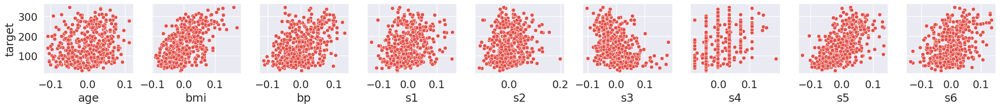

In [172]:
p = sns.pairplot(df, x_vars=X.columns.tolist(), y_vars=["target"])


Testing the assumptions of linear regression
1. Relationship between X & Y is approximately linear
2. Errors are normally distributed
3. Error term has zero mean and constant variance
4. Errors are uncorrelated (with features and autocorrelation)

In [173]:
model_fit = sm.OLS(y, sm.add_constant(X)).fit()  # Fit model
y_pred = model_fit.fittedvalues  # Get Predictions
residuals = model_fit.resid  # Get Residuals
std_residuals = model_fit.get_influence().resid_studentized_internal #Standardized residuals


In [174]:
print("R squared: {}".format(r2_score(y_true=y, y_pred=y_pred)))


R squared: 0.5005799559125177


In [175]:
# Checking normality of error
mean_residuals = np.mean(std_residuals)
mean_residuals


0.0003287287077625877

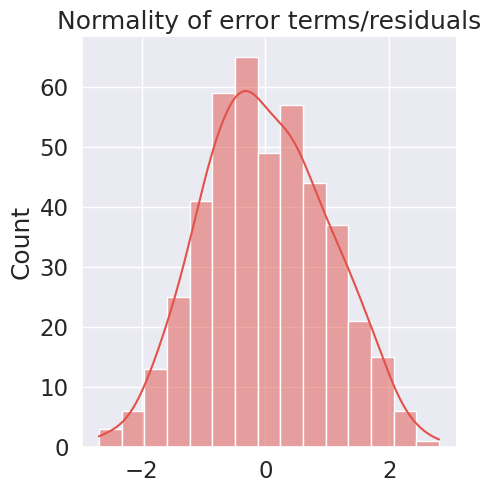

In [176]:
p = sns.displot(std_residuals, kde=True)
p = plt.title("Normality of error terms/residuals")

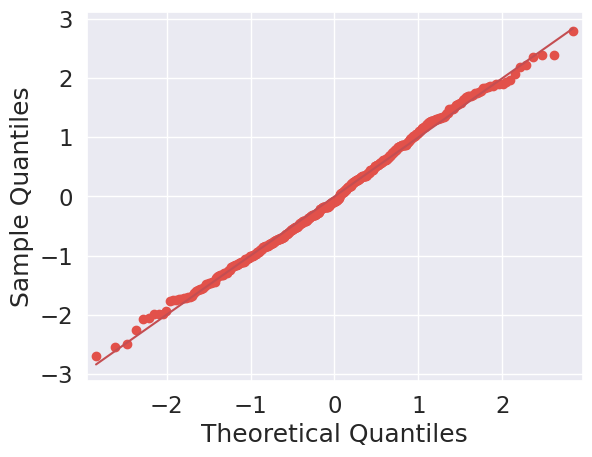

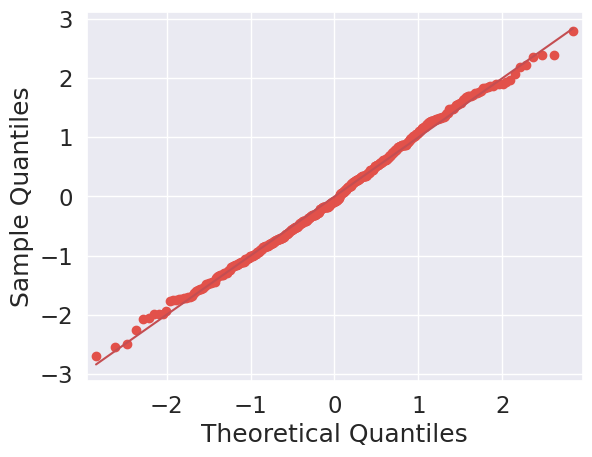

In [177]:
# QQ plot
## Plot sample quantile against theoritical quantile 
sm.qqplot(std_residuals, line="s")

Text(0, 0.5, 'Residuals')

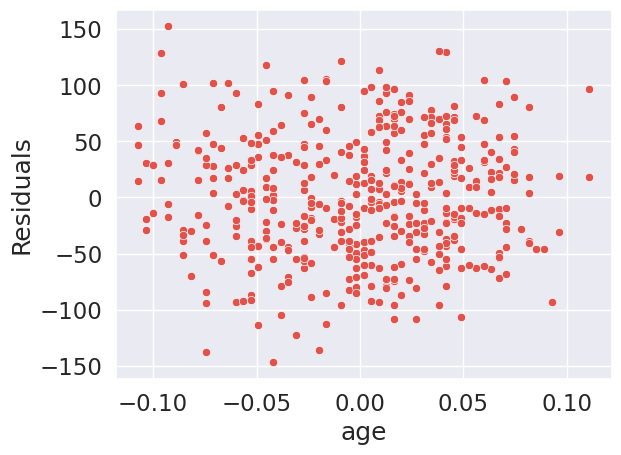

In [178]:
# Residual Plots (Randomly distribution)
p = sns.scatterplot(x=X["age"], y=residuals)
plt.ylabel("Residuals")

Text(0, 0.5, 'Standardized Residuals')

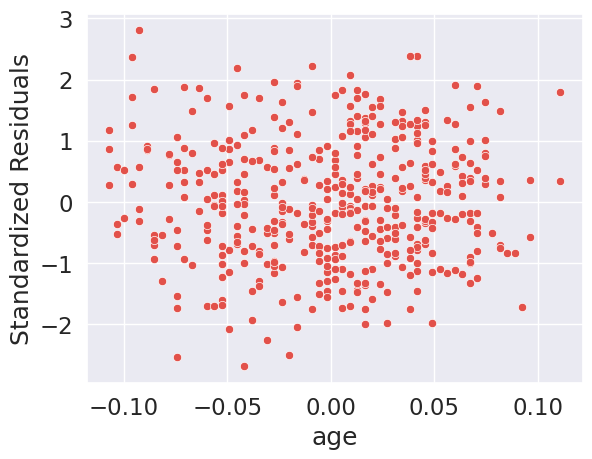

In [179]:
# Homoscedasticity (Constant variance of errors)
#In case of Heteroscadaskicity the graph will be like a funner shape, mean more points are present as we progress along the x axis
p = sns.scatterplot(x=X["age"], y=std_residuals)
plt.xlabel("age")
plt.ylabel("Standardized Residuals")

In [180]:
# Null hypothesis errors are homoscedastic
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(std_residuals, X)
lzip(name, test)

[('F statistic', 0.9422226923559628), ('p-value', 0.6673920793110781)]

In [181]:
# Checking for correlation of resiuals with features
for column in X.columns:
    corr_test = pearsonr(X[column], std_residuals)
    print(column, corr_test[0])

age 7.50570356285201e-05
bmi 0.00017507369680246472
bp 8.918803189440013e-05
s1 -0.0005154234391119672
s2 -6.60930055439678e-05
s3 0.00015350256210671016
s4 -0.0004128331327916219
s5 -0.0007803884275580493
s6 -0.00013795700541787296


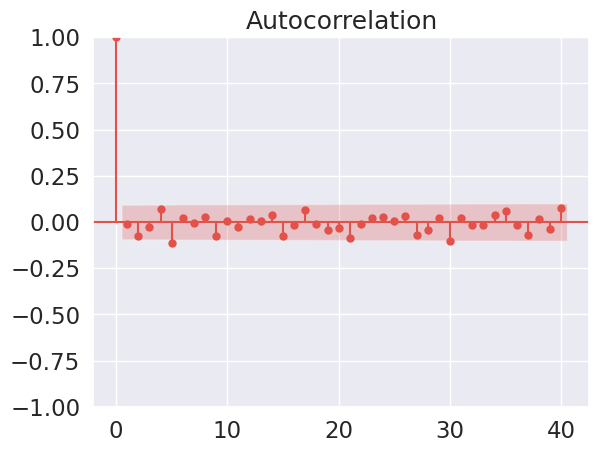

In [182]:
# Autocorrelation
sm.graphics.tsa.plot_acf(std_residuals, lags=40)
plt.show()

# PCR and PLS

Goal is to illustrate how PLS can outperform PCR when the target is strongly correlated with some directions in the data that have a low variance.

### PCR 
PCR is a regressor composed of two steps: first, PCA is applied to the training data, possibly performing dimensionality reduction; then, a regressor (e.g. a linear regressor) is trained on the transformed samples. In PCA, the transformation is purely unsupervised, meaning that no information about the targets is used. As a result, PCR may perform poorly in some datasets where the target is strongly correlated with directions that have low variance. Indeed, the dimensionality reduction of PCA projects the data into a lower dimensional space where the variance of the projected data is greedily maximized along each axis. Despite them having the most predictive power on the target, the directions with a lower variance will be dropped, and the final regressor will not be able to leverage them.

### PLS
PLS is both a transformer and a regressor, and it is quite similar to PCR: it also applies a dimensionality reduction to the samples before applying a linear regressor to the transformed data. The main difference with PCR is that the PLS transformation is supervised. Therefore, as we will see in this example, it does not suffer from the issue we just mentioned.

In [183]:
X, y = datasets.load_diabetes(return_X_y=True, as_frame=True)  # Load diabetes dataset

In [184]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=123)

In [185]:
pcr = make_pipeline(StandardScaler(), PCA(n_components=1), LinearRegression())
pcr.fit(X_train, y_train)
pca = pcr.named_steps["pca"]  # Keep pca step for transforming X_test

In [186]:
pls = PLSRegression(n_components=1)
pls.fit(X_train, y_train)

PLSRegression(n_components=1)

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


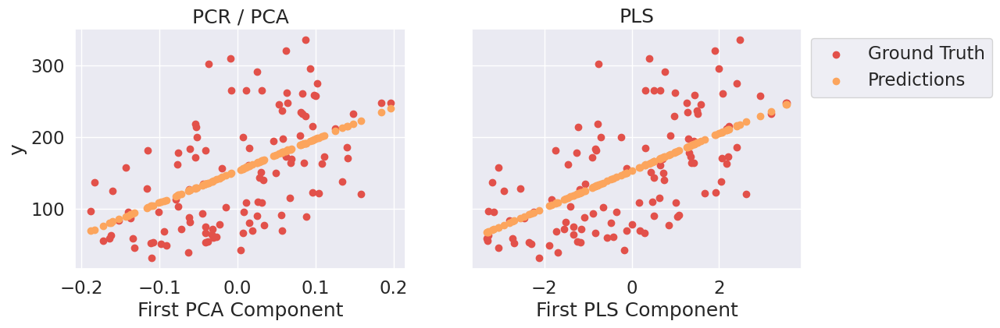

In [187]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
axes[0].scatter(pca.transform(X_test), y_test, label="Ground Truth")
axes[0].scatter(pca.transform(X_test), pcr.predict(X_test), label="Predictions")
axes[0].set(xlabel="First PCA Component", ylabel="y", title="PCR / PCA")
axes[0].legend()
axes[1].scatter(pls.transform(X_test), y_test, label="Ground Truth")
axes[1].scatter(pls.transform(X_test), pls.predict(X_test), label="Predictions")
axes[1].set(xlabel="First PLS Component", title="PLS")
axes[1].legend(bbox_to_anchor=(1, 1))
axes[0].get_legend().remove()
plt.show()

In [188]:
# Print metrics
print(f"PCR r-squared {pcr.score(X_test, y_test)}")
print(f"PLS r-squared {pls.score(X_test, y_test)}")

PCR r-squared 0.2762029502451355
PLS r-squared 0.3743011876685156


In [191]:
sns.set_theme(context='notebook', style='whitegrid',  rc={'figure.figsize':(14,10)})

In [192]:
df_train = pd.read_csv('Final_Train.csv')
df_test = pd.read_csv('Final_Test.csv')
df_test.head()

,X,y
0,0.002309,0.848631
1,0.040254,0.740667
2,0.062063,1.392814
3,0.129030,1.560407
4,0.152327,1.650425


In [193]:
X, y = df_train.X.values, df_train.y.values # Train data

Xtest, ytest = df_test.X.values, df_test.y.values # Test data

Text(0.02, 0.5, 'y')

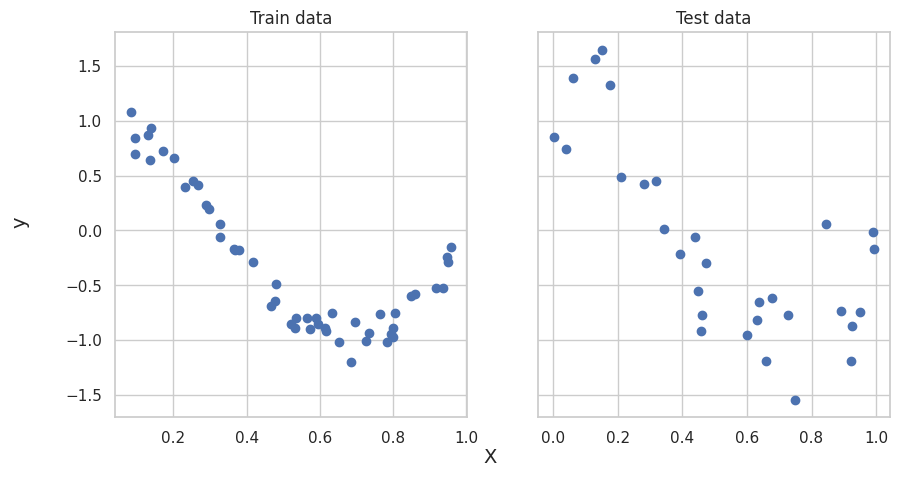

In [194]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharey=True)

#Plot in first axis
ax[0].scatter(X, y, label='Train')
ax[0].set_title('Train data')

#Plot in second axis
ax[1].scatter(Xtest,ytest, label='Test')
ax[1].set_title('Test data')

#Annotate the entire figure
fig.supxlabel('X', size=14)
fig.supylabel('y', size=14)

# Bias - Variance Tradeoff

In [195]:
# Implementing non-linear terms in linear model

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline

polynomial_features = PolynomialFeatures(degree=2, include_bias=True)

print('Original X:')
print(X[:10])

print('\nTransformed X:')
polynomial_features.fit_transform(X.reshape(-1,1))[:10]

Original X:
[0.08449322 0.0950492  0.09509575 0.13210284 0.13740793 0.13976841
 0.1712913  0.20240459 0.23256994 0.25338335]

Transformed X:


array([[1.        , 0.08449322, 0.0071391 ],
       [1.        , 0.0950492 , 0.00903435],
       [1.        , 0.09509575, 0.0090432 ],
       [1.        , 0.13210284, 0.01745116],
       [1.        , 0.13740793, 0.01888094],
       [1.        , 0.13976841, 0.01953521],
       [1.        , 0.1712913 , 0.02934071],
       [1.        , 0.20240459, 0.04096762],
       [1.        , 0.23256994, 0.05408878],
       [1.        , 0.25338335, 0.06420312]])

In [196]:
def pipeline(degree:int = 2):
    
    polynomial_features = PolynomialFeatures(degree=degree, include_bias=True)
    reg = LinearRegression(fit_intercept=False)
    
    return Pipeline(steps=
        [
            ("polynomial_features", polynomial_features),
            ("linear_regression", reg),
        ]
    )

pipe = pipeline(degree=2)
pipe.fit(X.reshape(-1,1),y)

Pipeline(steps=[('polynomial_features', PolynomialFeatures()),
                ('linear_regression', LinearRegression(fit_intercept=False))])

In [197]:
pipe.predict(Xtest.reshape(-1,1))

array([ 1.8197984 ,  1.52889275,  1.36925016,  0.91354269,  0.76720743,
        0.61771062,  0.42134292,  0.07286911, -0.0967297 , -0.19270652,
       -0.37580108, -0.51520796, -0.547398  , -0.57024113, -0.57756338,
       -0.60673263, -0.8215261 , -0.84653023, -0.85015967, -0.8580895 ,
       -0.86084808, -0.8496867 , -0.83452219, -0.70516318, -0.60426568,
       -0.52760293, -0.5222115 , -0.44453803, -0.30466859, -0.29904721])

In [198]:
degrees = np.arange(0,15)
train_error = []
test_error = []

for degree in degrees:
    pol = pipeline(degree=degree)
    pol.fit(X.reshape(-1,1),y)
    
    train_error.append(mean_squared_error(y, pol.predict(X.reshape(-1,1))))
    test_error.append(mean_squared_error(ytest, pol.predict(Xtest.reshape(-1,1))))

Text(0.5, 0.98, 'The Bias-Variance Tradeoff')

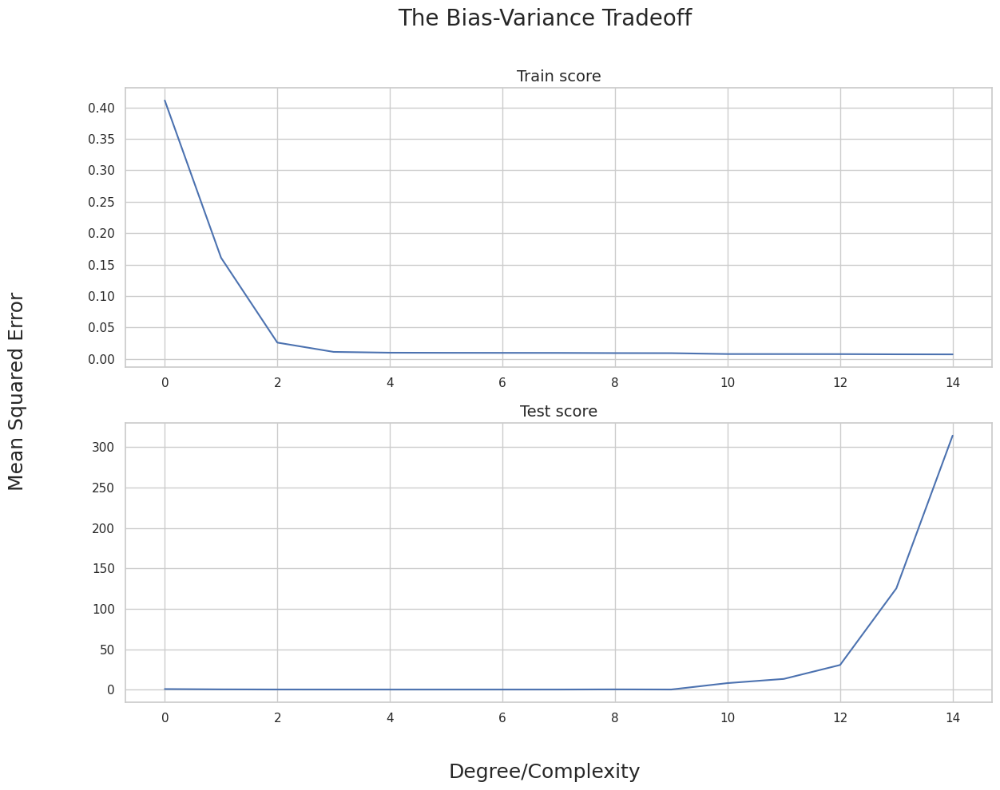

In [199]:
fig, ax = plt.subplots(2,1)
ax[0].plot(degrees, train_error, label='Train score',)
ax[0].set_title('Train score', size=14)
ax[1].plot(degrees, test_error, label='Test score')
ax[1].set_title('Test score', size=14)
fig.supxlabel('Degree/Complexity', size=18)
fig.supylabel('Mean Squared Error', size=18)
fig.suptitle('The Bias-Variance Tradeoff', size=20)

# Ridge Regression

In [200]:
from sklearn.linear_model import Ridge

In [201]:
polynomial_features = PolynomialFeatures(degree=14, include_bias=False)

standardize = lambda x: StandardScaler().fit_transform(polynomial_features.fit_transform(x.reshape(-1,1)))

X_std = standardize(X)
X_std[:5]

array([[-1.69015399, -1.22119898, -0.96331499, -0.80886026, -0.706456  ,
        -0.63337213, -0.57856651, -0.53602659, -0.50216404, -0.47468544,
        -0.45204611, -0.43316147, -0.41724394, -0.4037056 ],
       [-1.64999262, -1.21442166, -0.96235102, -0.8087361 , -0.70644098,
        -0.63337039, -0.57856631, -0.53602656, -0.50216404, -0.47468544,
        -0.45204611, -0.43316147, -0.41724394, -0.4037056 ],
       [-1.64981552, -1.21439001, -0.96234626, -0.80873546, -0.7064409 ,
        -0.63337038, -0.57856631, -0.53602656, -0.50216404, -0.47468544,
        -0.45204611, -0.43316147, -0.41724394, -0.4037056 ],
       [-1.50901805, -1.18432351, -0.95689306, -0.80783319, -0.70629964,
        -0.63334903, -0.57856316, -0.53602611, -0.50216397, -0.47468543,
        -0.4520461 , -0.43316147, -0.41724394, -0.4037056 ],
       [-1.48883425, -1.17921068, -0.95580255, -0.80762279, -0.70626154,
        -0.63334243, -0.57856205, -0.53602592, -0.50216394, -0.47468543,
        -0.4520461 , -0.43

MSE: 169.1192194654508
R-squared -228.25366102644975


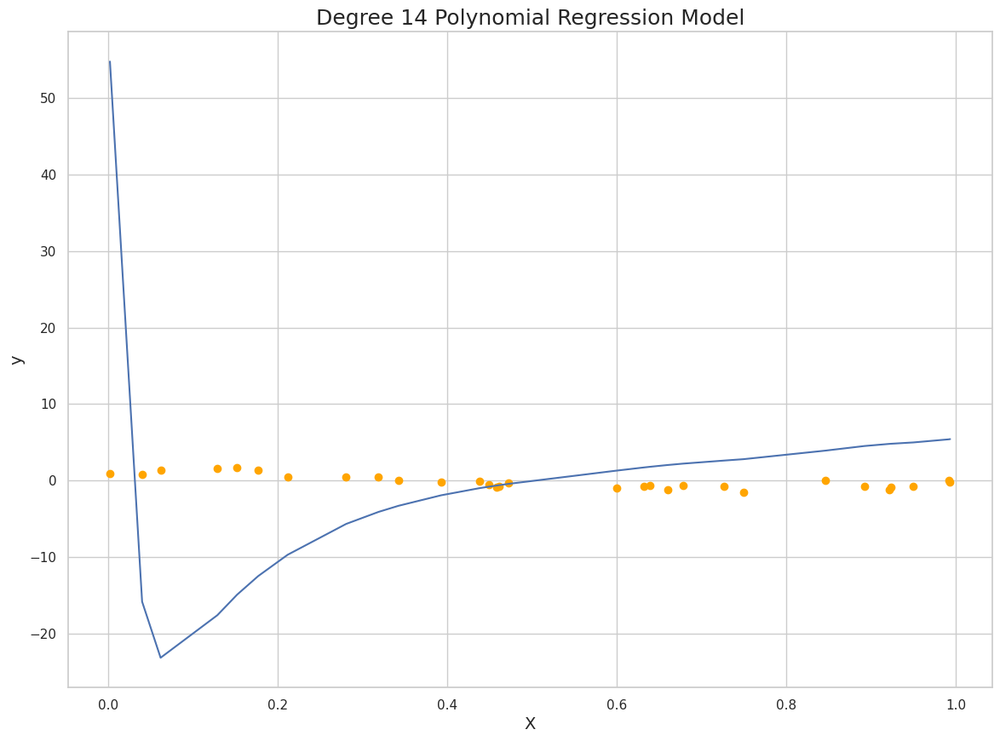

In [202]:
# Running a Linear Regression Model

reg = LinearRegression()
reg.fit(X_std, y)

# Plot the figure
fig, ax = plt.subplots()
ax.plot(Xtest, reg.predict(standardize(Xtest)))
ax.scatter(Xtest, ytest, c='orange')
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)
ax.set_title('Degree 14 Polynomial Regression Model', size=18)

print('MSE:', mean_squared_error(ytest, reg.predict(standardize(Xtest))))
print('R-squared', r2_score(ytest, reg.predict(standardize(Xtest))))

Text(0, 0.5, 'y')

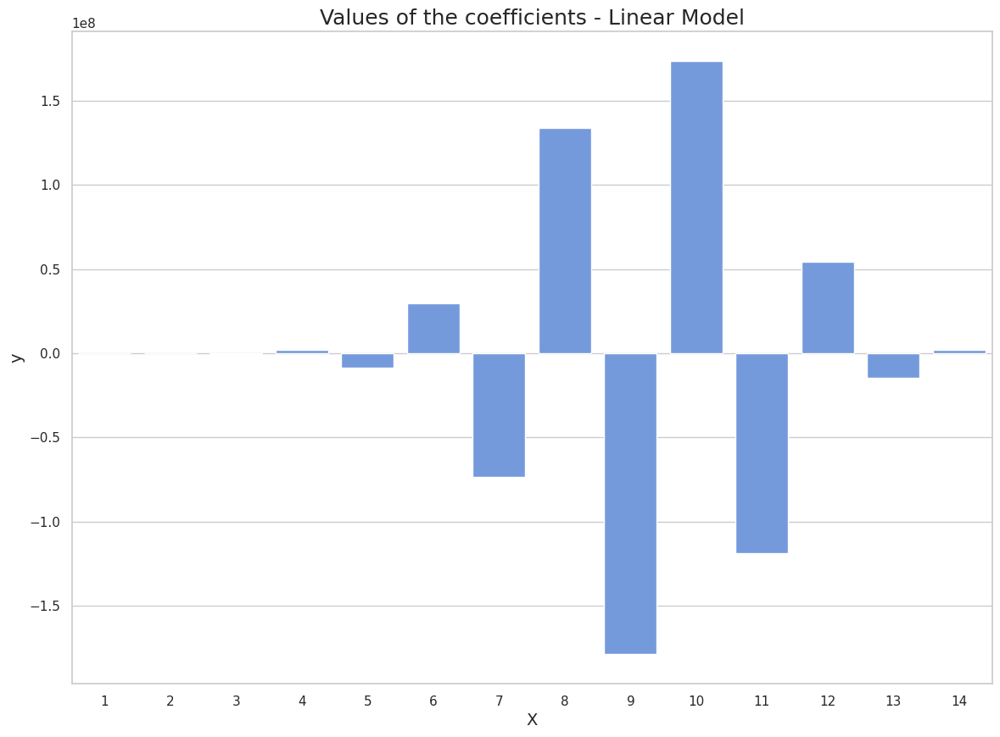

In [203]:
# plot of coefficients

fig, ax = plt.subplots()
sns.barplot(x=degrees[1:], y =reg.coef_, color='cornflowerblue')
ax.set_title('Values of the coefficients - Linear Model', size=18)
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)

MSE: 0.2250009109471818
R-squared 0.6949945563137765


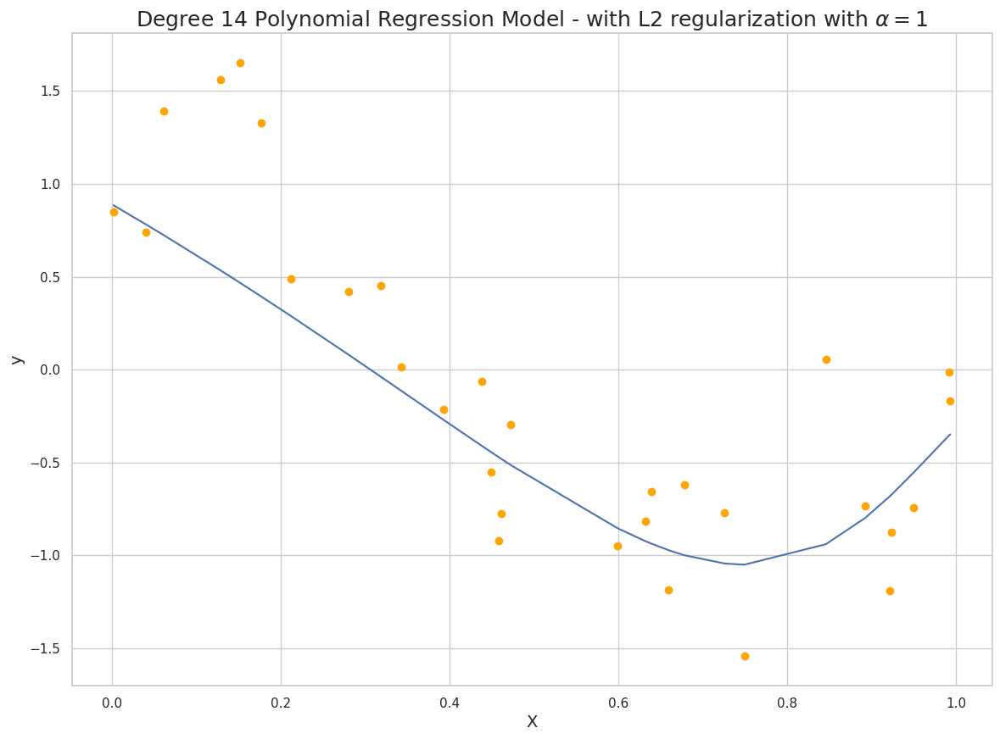

In [204]:
# Running a Ridge Regression model

alpha = 1
ridge = Ridge(alpha=alpha)
ridge.fit(X_std, y)

# Plot the figure
fig, ax = plt.subplots()
ax.plot(Xtest, ridge.predict(standardize(Xtest)))
ax.scatter(Xtest, ytest, c='orange')
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)
ax.set_title(r'Degree 14 Polynomial Regression Model - with L2 regularization with $\alpha=${}'.format(alpha), size=18)

print('MSE:', mean_squared_error(ytest, ridge.predict(standardize(Xtest))))
print('R-squared', r2_score(ytest, ridge.predict(standardize(Xtest))))

Text(0, 0.5, 'y')

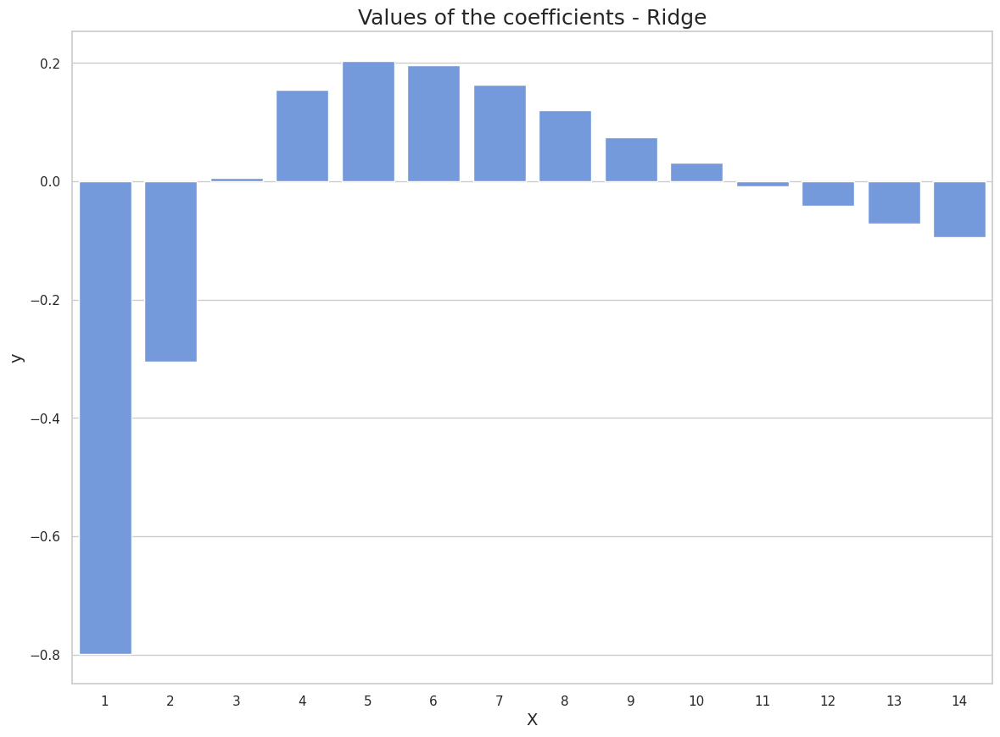

In [205]:
# plot of coefficients

fig, ax = plt.subplots()
sns.barplot(x=degrees[1:], y =ridge.coef_, color='cornflowerblue')
ax.set_title('Values of the coefficients - Ridge', size=18)
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)

# LASSO

In [226]:
from sklearn.linear_model import Lasso

ValueError: ignored

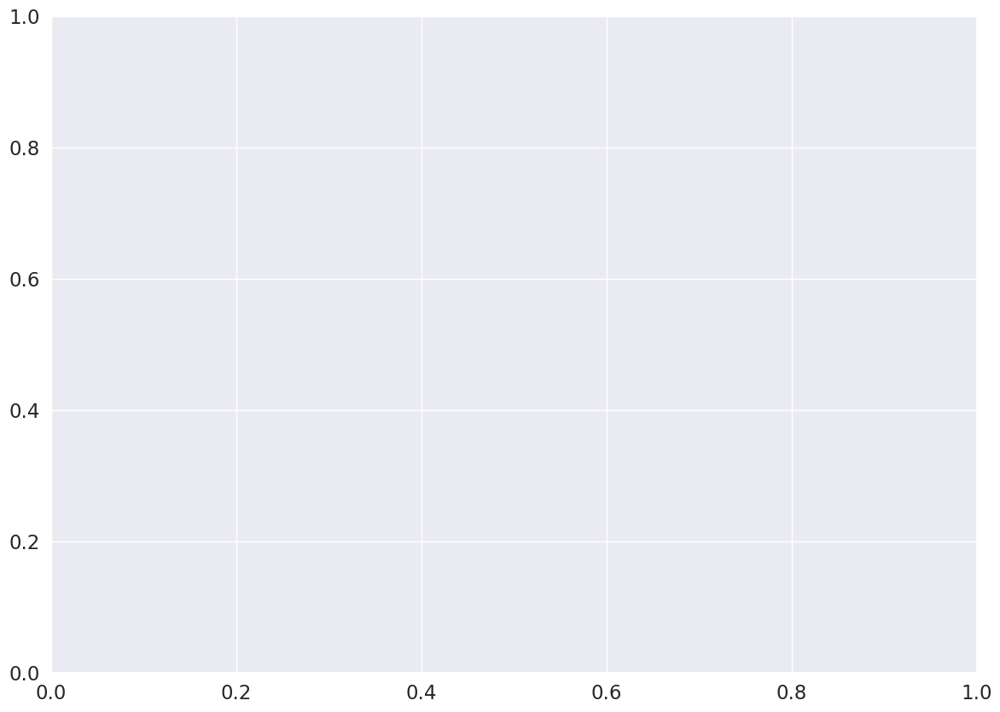

In [227]:
alpha = 0.05
lasso = Lasso(alpha=alpha)

lasso.fit(X_std, y)

# Plot the figure
fig, ax = plt.subplots()
ax.plot(Xtest, lasso.predict(standardize(Xtest)))
ax.scatter(Xtest, ytest, c='orange')
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)
ax.set_title(r'Degree 14 Polynomial Regression Model - with L1 regularization with $\alpha=${}'.format(alpha), size=18)

print('MSE:', mean_squared_error(ytest, lasso.predict(standardize(Xtest))))
print('R-squared', r2_score(ytest, lasso.predict(standardize(Xtest))))

Text(0, 0.5, 'y')

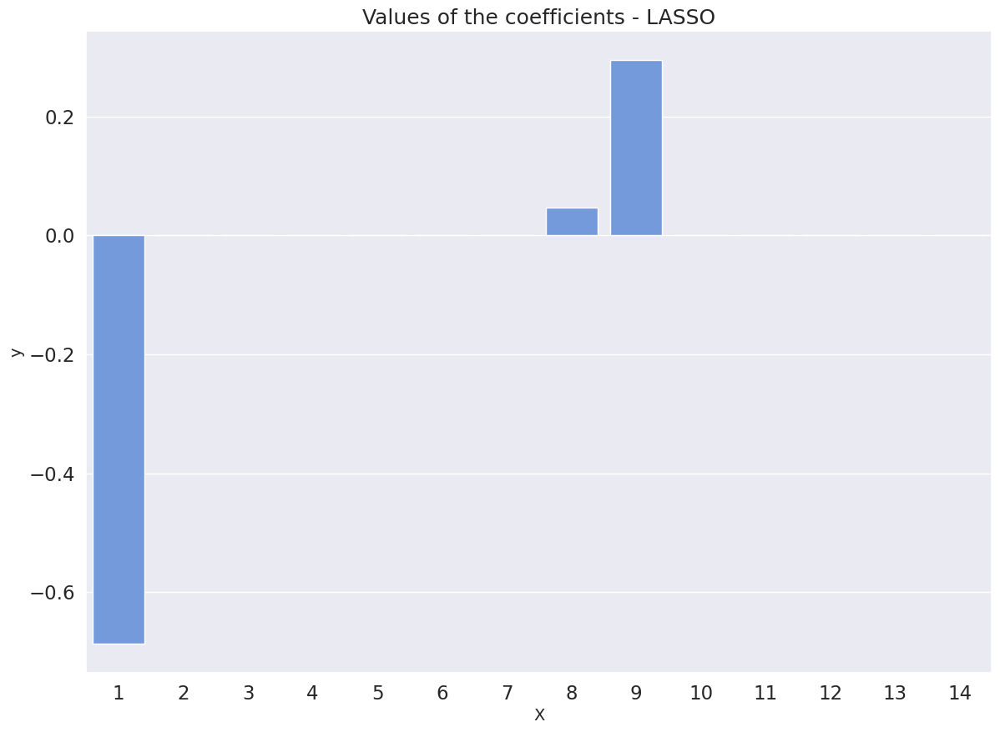

In [228]:
# plot of coefficients

fig, ax = plt.subplots()
sns.barplot(x=degrees[1:], y =lasso.coef_, color='cornflowerblue')
ax.set_title('Values of the coefficients - LASSO', size=18)
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)

In [230]:
sns.set_theme(context='notebook', style='whitegrid',  rc={'figure.figsize':(14,10)})

In [231]:
df_train = pd.read_csv('Final_Train.csv')
df_test = pd.read_csv('Final_Test.csv')
df_test.head()

,X,y
0,0.002309,0.848631
1,0.040254,0.740667
2,0.062063,1.392814
3,0.129030,1.560407
4,0.152327,1.650425


In [232]:
X, y = df_train.X.values, df_train.y.values # Train data

Xtest, ytest = df_test.X.values, df_test.y.values # Test data

Text(0.02, 0.5, 'y')

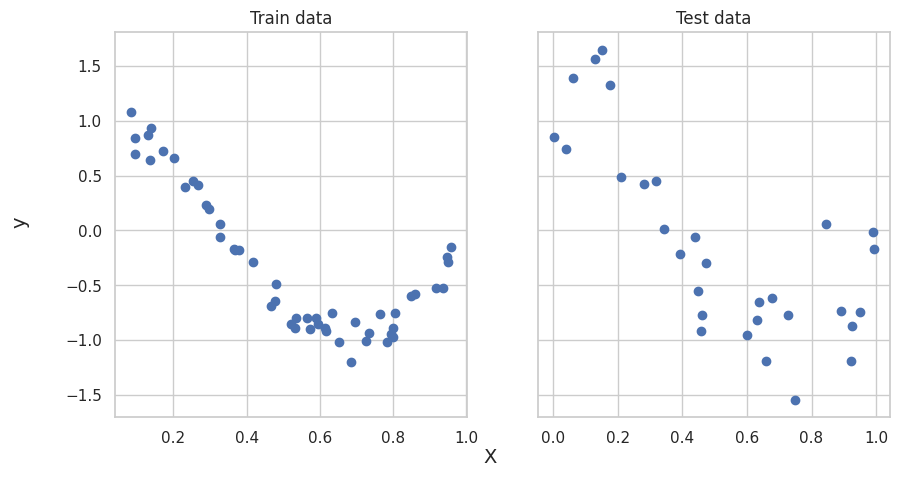

In [233]:
fig, ax = plt.subplots(1,2, figsize=(10,5), sharey=True)

#Plot in first axis
ax[0].scatter(X, y, label='Train')
ax[0].set_title('Train data')

#Plot in second axis
ax[1].scatter(Xtest,ytest, label='Test')
ax[1].set_title('Test data')

#Annotate the entire figure
fig.supxlabel('X', size=14)
fig.supylabel('y', size=14)

# Bias - Variance Tradeoff

In [234]:
# Implementing non-linear terms in linear model

from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline

polynomial_features = PolynomialFeatures(degree=2, include_bias=True)

print('Original X:')
print(X[:10])

print('\nTransformed X:')
polynomial_features.fit_transform(X.reshape(-1,1))[:10]

Original X:
[0.08449322 0.0950492  0.09509575 0.13210284 0.13740793 0.13976841
 0.1712913  0.20240459 0.23256994 0.25338335]

Transformed X:


array([[1.        , 0.08449322, 0.0071391 ],
       [1.        , 0.0950492 , 0.00903435],
       [1.        , 0.09509575, 0.0090432 ],
       [1.        , 0.13210284, 0.01745116],
       [1.        , 0.13740793, 0.01888094],
       [1.        , 0.13976841, 0.01953521],
       [1.        , 0.1712913 , 0.02934071],
       [1.        , 0.20240459, 0.04096762],
       [1.        , 0.23256994, 0.05408878],
       [1.        , 0.25338335, 0.06420312]])

In [235]:
def pipeline(degree:int = 2):
    
    polynomial_features = PolynomialFeatures(degree=degree, include_bias=True)
    reg = LinearRegression(fit_intercept=False)
    
    return Pipeline(steps=
        [
            ("polynomial_features", polynomial_features),
            ("linear_regression", reg),
        ]
    )

pipe = pipeline(degree=2)
pipe.fit(X.reshape(-1,1),y)

Pipeline(steps=[('polynomial_features', PolynomialFeatures()),
                ('linear_regression', LinearRegression(fit_intercept=False))])

In [236]:
pipe.predict(Xtest.reshape(-1,1))

array([ 1.8197984 ,  1.52889275,  1.36925016,  0.91354269,  0.76720743,
        0.61771062,  0.42134292,  0.07286911, -0.0967297 , -0.19270652,
       -0.37580108, -0.51520796, -0.547398  , -0.57024113, -0.57756338,
       -0.60673263, -0.8215261 , -0.84653023, -0.85015967, -0.8580895 ,
       -0.86084808, -0.8496867 , -0.83452219, -0.70516318, -0.60426568,
       -0.52760293, -0.5222115 , -0.44453803, -0.30466859, -0.29904721])

In [237]:
degrees = np.arange(0,15)
train_error = []
test_error = []

for degree in degrees:
    pol = pipeline(degree=degree)
    pol.fit(X.reshape(-1,1),y)
    
    train_error.append(mean_squared_error(y, pol.predict(X.reshape(-1,1))))
    test_error.append(mean_squared_error(ytest, pol.predict(Xtest.reshape(-1,1))))

Text(0.5, 0.98, 'The Bias-Variance Tradeoff')

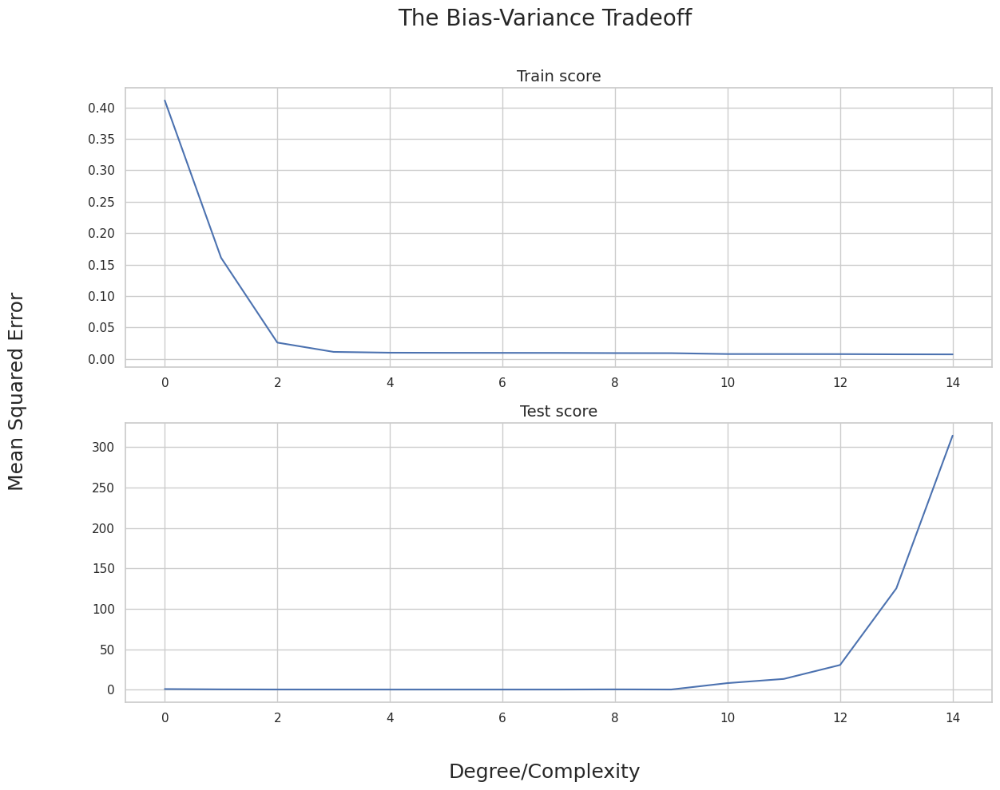

In [238]:
fig, ax = plt.subplots(2,1)
ax[0].plot(degrees, train_error, label='Train score',)
ax[0].set_title('Train score', size=14)
ax[1].plot(degrees, test_error, label='Test score')
ax[1].set_title('Test score', size=14)
fig.supxlabel('Degree/Complexity', size=18)
fig.supylabel('Mean Squared Error', size=18)
fig.suptitle('The Bias-Variance Tradeoff', size=20)

# Ridge Regression

In [239]:
from sklearn.linear_model import Ridge

In [240]:
polynomial_features = PolynomialFeatures(degree=14, include_bias=False)

standardize = lambda x: StandardScaler().fit_transform(polynomial_features.fit_transform(x.reshape(-1,1)))

X_std = standardize(X)
X_std[:5]

array([[-1.69015399, -1.22119898, -0.96331499, -0.80886026, -0.706456  ,
        -0.63337213, -0.57856651, -0.53602659, -0.50216404, -0.47468544,
        -0.45204611, -0.43316147, -0.41724394, -0.4037056 ],
       [-1.64999262, -1.21442166, -0.96235102, -0.8087361 , -0.70644098,
        -0.63337039, -0.57856631, -0.53602656, -0.50216404, -0.47468544,
        -0.45204611, -0.43316147, -0.41724394, -0.4037056 ],
       [-1.64981552, -1.21439001, -0.96234626, -0.80873546, -0.7064409 ,
        -0.63337038, -0.57856631, -0.53602656, -0.50216404, -0.47468544,
        -0.45204611, -0.43316147, -0.41724394, -0.4037056 ],
       [-1.50901805, -1.18432351, -0.95689306, -0.80783319, -0.70629964,
        -0.63334903, -0.57856316, -0.53602611, -0.50216397, -0.47468543,
        -0.4520461 , -0.43316147, -0.41724394, -0.4037056 ],
       [-1.48883425, -1.17921068, -0.95580255, -0.80762279, -0.70626154,
        -0.63334243, -0.57856205, -0.53602592, -0.50216394, -0.47468543,
        -0.4520461 , -0.43

MSE: 169.1192194654508
R-squared -228.25366102644975


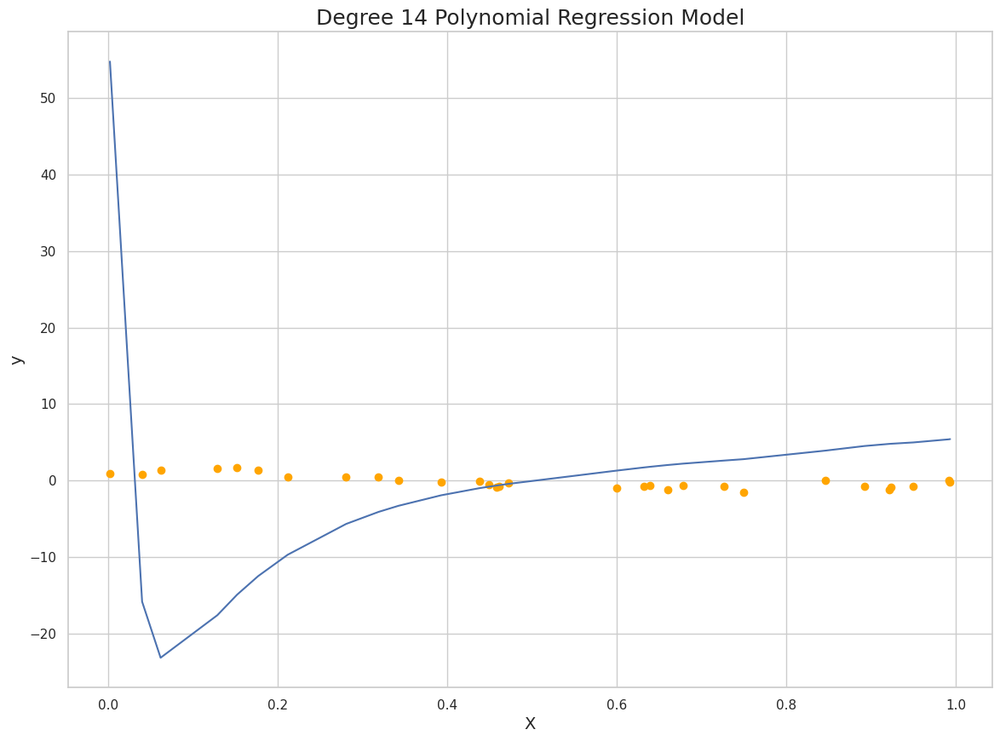

In [241]:
# Running a Linear Regression Model

reg = LinearRegression()
reg.fit(X_std, y)

# Plot the figure
fig, ax = plt.subplots()
ax.plot(Xtest, reg.predict(standardize(Xtest)))
ax.scatter(Xtest, ytest, c='orange')
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)
ax.set_title('Degree 14 Polynomial Regression Model', size=18)

print('MSE:', mean_squared_error(ytest, reg.predict(standardize(Xtest))))
print('R-squared', r2_score(ytest, reg.predict(standardize(Xtest))))

Text(0, 0.5, 'y')

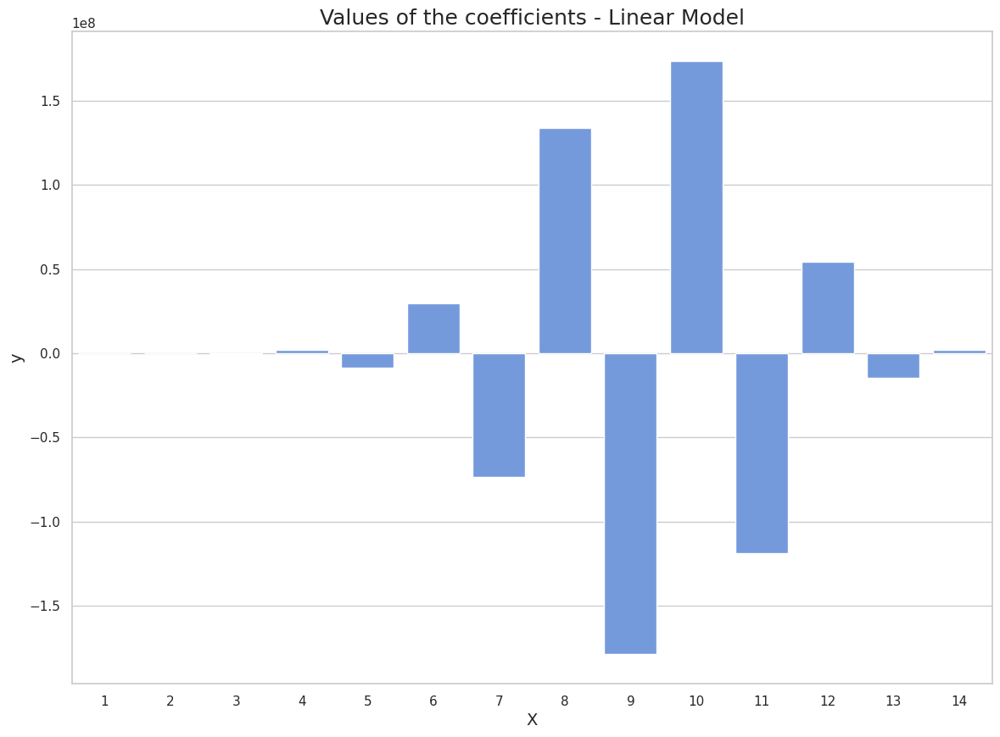

In [242]:
# plot of coefficients

fig, ax = plt.subplots()
sns.barplot(x=degrees[1:], y =reg.coef_, color='cornflowerblue')
ax.set_title('Values of the coefficients - Linear Model', size=18)
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)

MSE: 0.2250009109471818
R-squared 0.6949945563137765


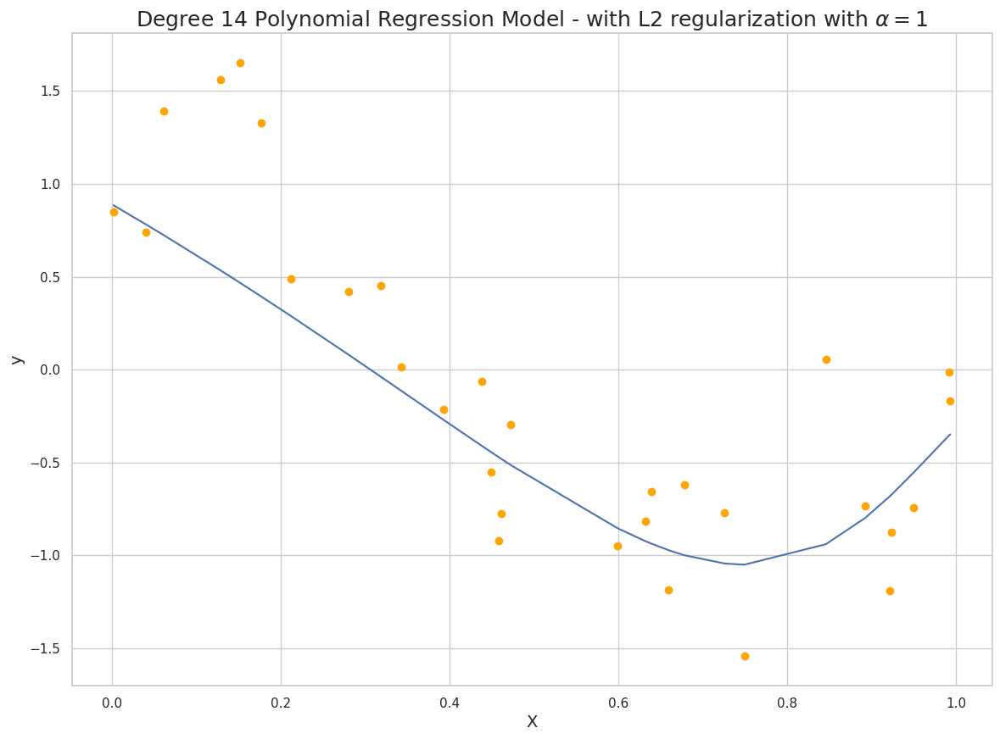

In [243]:
# Running a Ridge Regression model

alpha = 1
ridge = Ridge(alpha=alpha)
ridge.fit(X_std, y)

# Plot the figure
fig, ax = plt.subplots()
ax.plot(Xtest, ridge.predict(standardize(Xtest)))
ax.scatter(Xtest, ytest, c='orange')
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)
ax.set_title(r'Degree 14 Polynomial Regression Model - with L2 regularization with $\alpha=${}'.format(alpha), size=18)

print('MSE:', mean_squared_error(ytest, ridge.predict(standardize(Xtest))))
print('R-squared', r2_score(ytest, ridge.predict(standardize(Xtest))))

Text(0, 0.5, 'y')

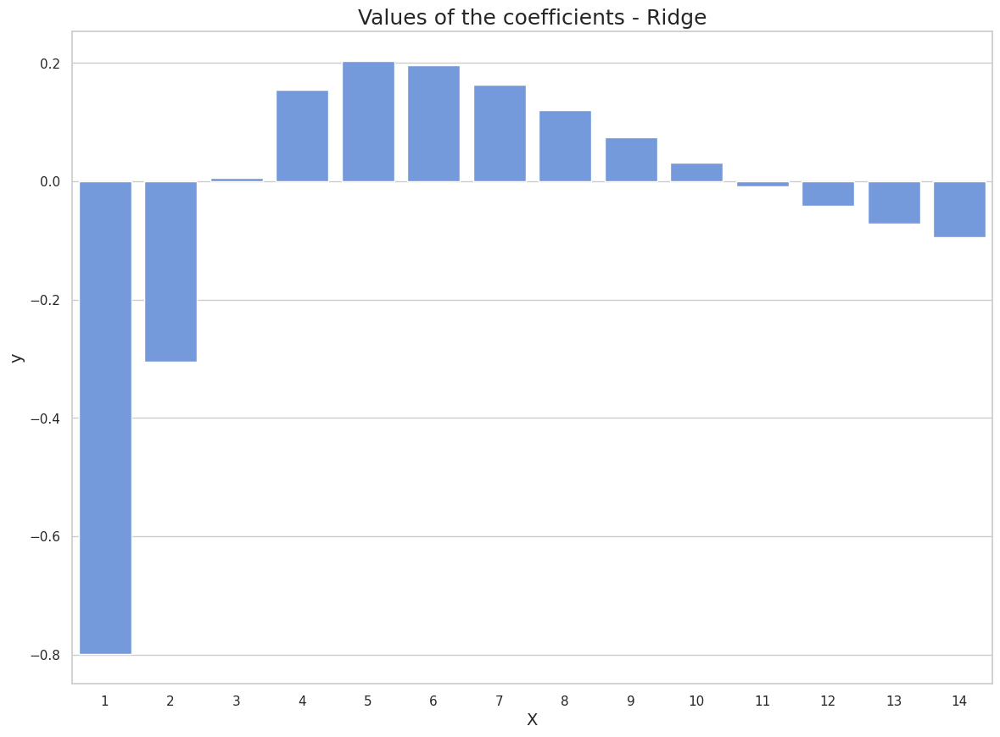

In [244]:
# plot of coefficients

fig, ax = plt.subplots()
sns.barplot(x=degrees[1:], y =ridge.coef_, color='cornflowerblue')
ax.set_title('Values of the coefficients - Ridge', size=18)
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)

# LASSO

In [245]:
from sklearn.linear_model import Lasso

MSE: 0.2745287474778872
R-squared 0.6278558958866963


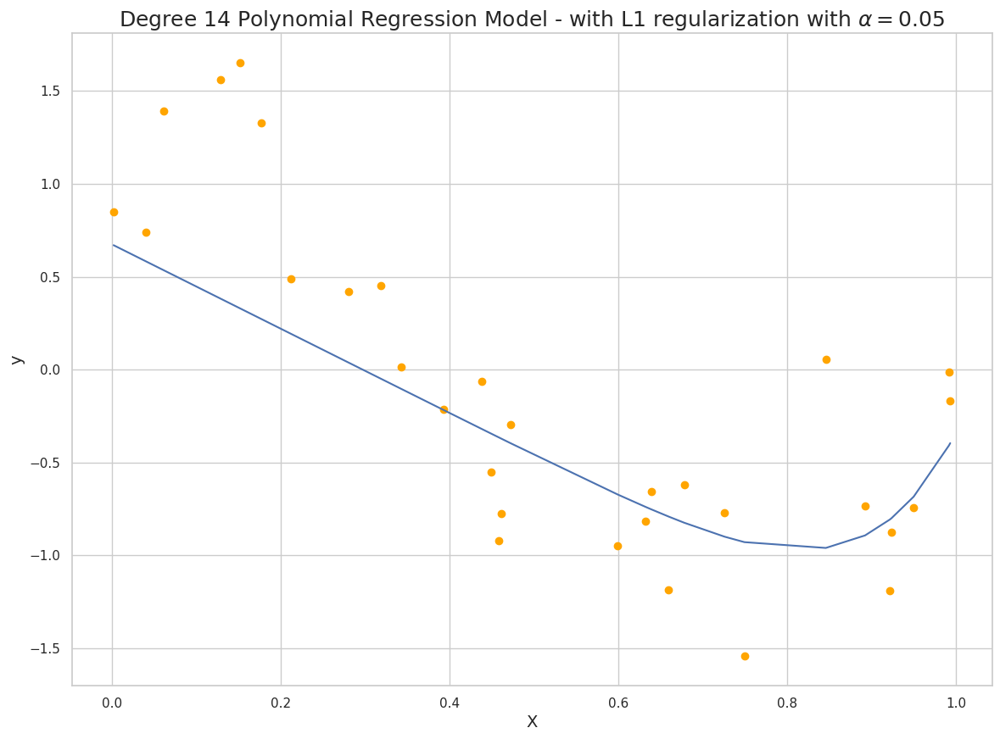

In [246]:
alpha = 0.05
lasso = Lasso(alpha=alpha)

lasso.fit(X_std, y)

# Plot the figure
fig, ax = plt.subplots()
ax.plot(Xtest, lasso.predict(standardize(Xtest)))
ax.scatter(Xtest, ytest, c='orange')
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)
ax.set_title(r'Degree 14 Polynomial Regression Model - with L1 regularization with $\alpha=${}'.format(alpha), size=18)

print('MSE:', mean_squared_error(ytest, lasso.predict(standardize(Xtest))))
print('R-squared', r2_score(ytest, lasso.predict(standardize(Xtest))))

Text(0, 0.5, 'y')

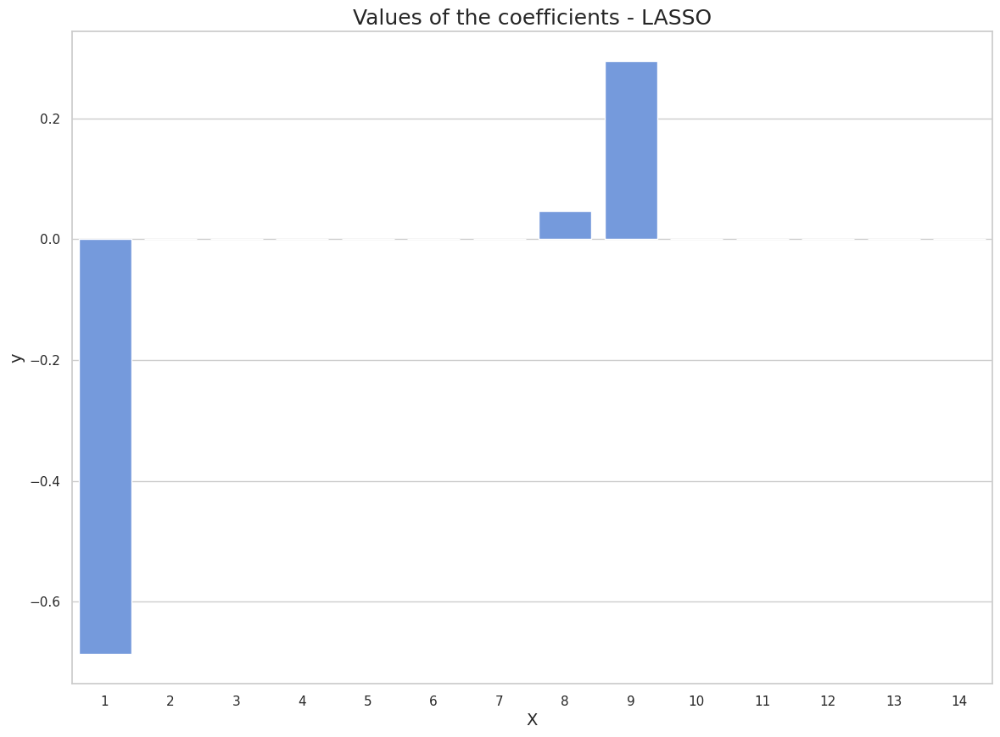

In [247]:
# plot of coefficients

fig, ax = plt.subplots()
sns.barplot(x=degrees[1:], y =lasso.coef_, color='cornflowerblue')
ax.set_title('Values of the coefficients - LASSO', size=18)
ax.set_xlabel('X', size=14)
ax.set_ylabel('y', size=14)

# Welcome!

In this session, we will learn how to implement some commonly used dimensionality reduction techniques. <br>
The following topics will be covered:
<ul>
    <li> PCA </li>
    <li> NMF </li>
    <li> tSNE </li>
    <li> UMAP </li>
</ul>
   

In [248]:
# Importing packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

# PCA - Prinicpal Component Analysis

PCA is statistical technique for reducing the dimensionality of the input data. It achieves this by creating new orthogonal variables that are linear combinations of existing ones while maximizing the variance explained by these variables.

In [249]:
penguins = pd.read_csv(
    "https://raw.githubusercontent.com/allisonhorst/palmerpenguins/c19a904462482430170bfe2c718775ddb7dbb885/inst/extdata/penguins.csv")

penguins

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex,year
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,male,2007
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,female,2007
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,female,2007
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN,2007
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,female,2007
...,...,...,...,...,...,...,...,...
339,Chinstrap,Dream,55.8,19.8,207.0,4000.0,male,2009
340,Chinstrap,Dream,43.5,18.1,202.0,3400.0,female,2009
341,Chinstrap,Dream,49.6,18.2,193.0,3775.0,male,2009
342,Chinstrap,Dream,50.8,19.0,210.0,4100.0,male,2009


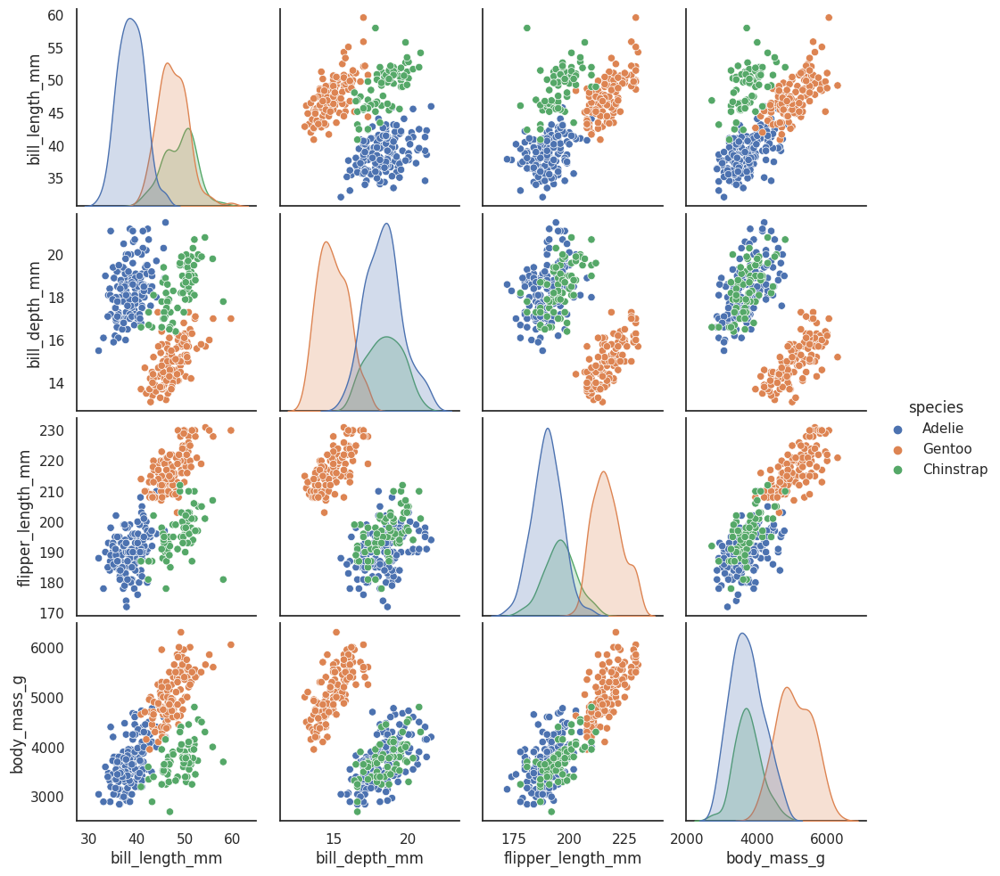

In [250]:
# Creating a pairwise scatterplots of the variables
sns.pairplot(data=penguins.drop('year', axis=1), hue='species')

In [251]:
penguins = penguins.dropna() # Removing NaN values
penguins.species.value_counts()

Adelie       146
Gentoo       119
Chinstrap     68
Name: species, dtype: int64

In [252]:
data = penguins[ # Choosing only numerical features
    [
        "bill_length_mm",
        "bill_depth_mm",
        "flipper_length_mm",
        "body_mass_g",
    ]
]
scaled_penguin_data = StandardScaler().fit_transform(data)
scaled_penguin_data

array([[-0.89604189,  0.7807321 , -1.42675157, -0.56847478],
       [-0.82278787,  0.11958397, -1.06947358, -0.50628618],
       [-0.67627982,  0.42472926, -0.42637319, -1.1903608 ],
       ...,
       [ 1.02687621,  0.52644436, -0.56928439, -0.53738048],
       [ 1.24663828,  0.93330475,  0.64546078, -0.13315457],
       [ 1.13675725,  0.7807321 , -0.2120064 , -0.53738048]])

In [253]:
pca = PCA() #Initializing the class
pca.fit(scaled_penguin_data) 

PCA()

In [254]:
pca.components_

array([[ 0.45375317, -0.39904723,  0.576825  ,  0.54967471],
       [ 0.6001949 ,  0.79616951,  0.00578817,  0.07646366],
       [ 0.64249509, -0.42580043, -0.23609516, -0.59173738],
       [ 0.14516955, -0.1599044 , -0.78198369,  0.58468615]])

In [255]:
pca.components_@pca.components_.T

array([[ 1.00000000e+00,  3.13743861e-17, -2.62658924e-18,
         1.29450126e-16],
       [ 3.13743861e-17,  1.00000000e+00,  9.52424084e-17,
        -6.35528970e-17],
       [-2.62658924e-18,  9.52424084e-17,  1.00000000e+00,
        -8.46896186e-17],
       [ 1.29450126e-16, -6.35528970e-17, -8.46896186e-17,
         1.00000000e+00]])

In [256]:
pca.singular_values_

array([30.2357976 , 16.09698786, 11.07961908,  5.99379399])

Text(0, 0.5, 'Proportion of Explained Variance')

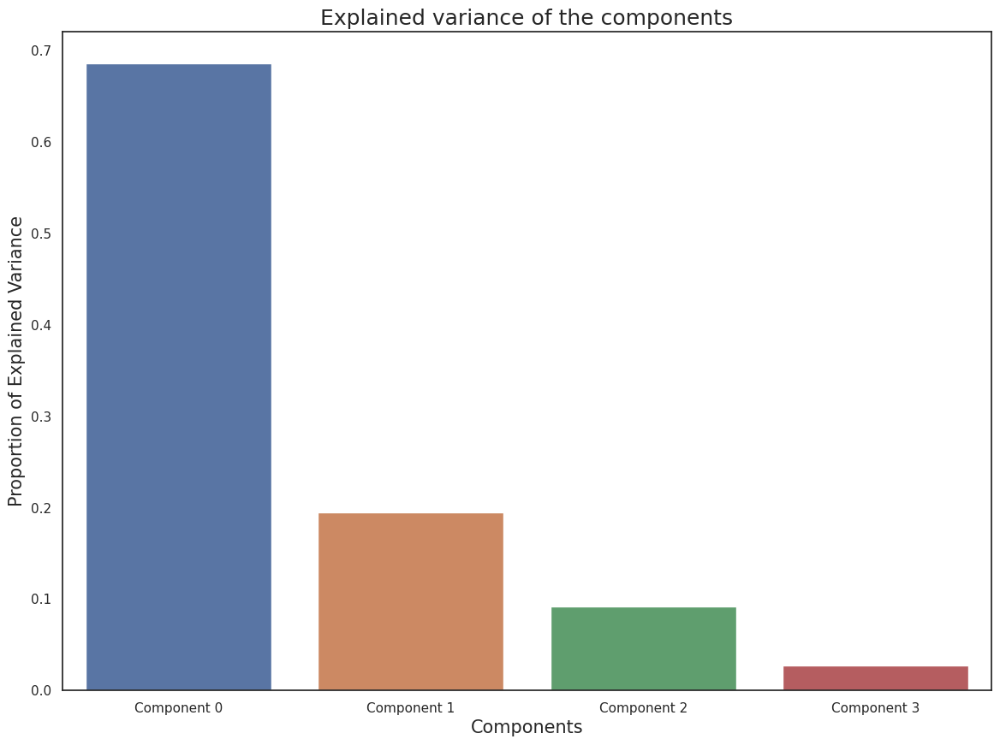

In [257]:
sns.barplot(
    y = pca.explained_variance_ratio_,
            x = [f'Component {i}' for i in range(data.shape[1])]
)
plt.title('Explained variance of the components', size=18)
plt.xlabel('Components', size=15)
plt.ylabel('Proportion of Explained Variance', size=15)

In [258]:
#Transforming data to lower dimensions
transformed_penguins_data = pca.transform(scaled_penguin_data)
transformed_penguins_data[:5]

array([[-1.85359302,  0.03206938, -0.23490166,  0.52839663],
       [-1.31625406, -0.44352677, -0.02747008,  0.40172663],
       [-1.37660509, -0.16123048,  0.18968926, -0.5286619 ],
       [-1.88528838, -0.01235124, -0.62887269, -0.4728932 ],
       [-1.91998074,  0.81759813, -0.70105139, -0.19641646]])

In [259]:
# It is the same as multiplying with the components
scaled_penguin_data[:5]@pca.components_.T

array([[-1.85359302,  0.03206938, -0.23490166,  0.52839663],
       [-1.31625406, -0.44352677, -0.02747008,  0.40172663],
       [-1.37660509, -0.16123048,  0.18968926, -0.5286619 ],
       [-1.88528838, -0.01235124, -0.62887269, -0.4728932 ],
       [-1.91998074,  0.81759813, -0.70105139, -0.19641646]])

In [260]:
# Creating a dataframe for plotting
transformed_penguins_df = pd.DataFrame(data = scaled_penguin_data, columns=[f'Component_{i}' for i in range(data.shape[1])])
transformed_penguins_df['species'] = penguins.species
transformed_penguins_df.sample(5)

,Component_0,Component_1,Component_2,Component_3,species
45,-0.712907,0.882447,-0.926562,0.115600,Adelie
44,-0.804474,0.272157,-1.069474,-0.879418,Adelie
296,1.869297,1.848741,0.002360,0.115600,Chinstrap
184,0.862055,-0.744994,0.502550,1.421560,Gentoo
183,0.001320,-1.813003,0.502550,0.177788,Gentoo


<Axes: xlabel='Component_0', ylabel='Component_1'>

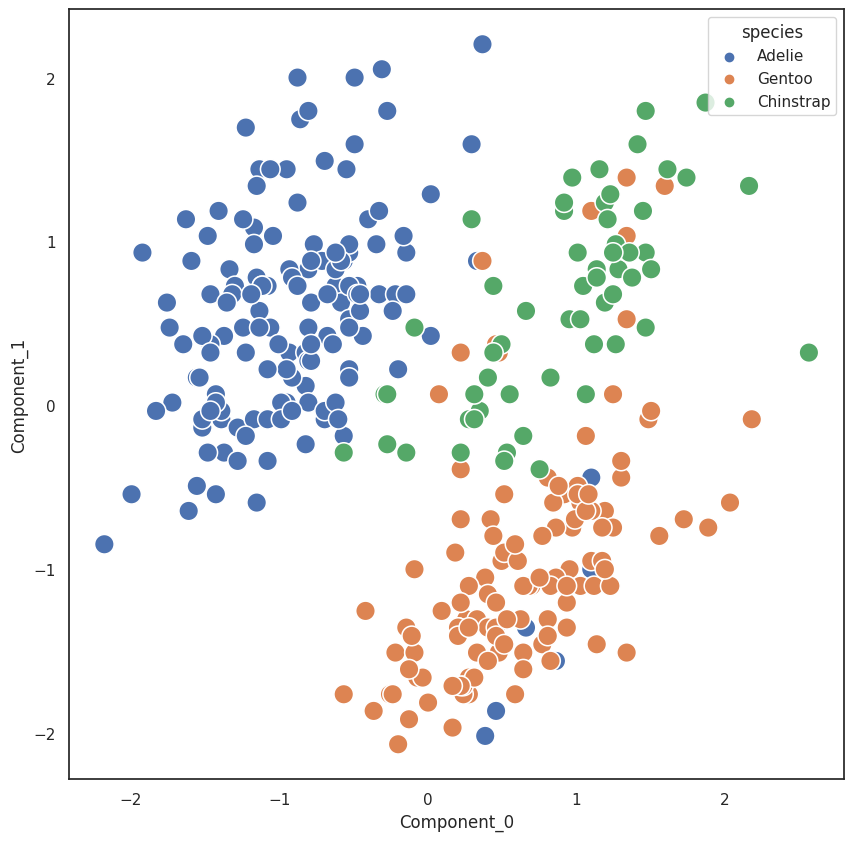

In [261]:
# Plotting in reduced dimensions

fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(
    data = transformed_penguins_df,
    x='Component_0',
    y='Component_1',
    hue = 'species',
    s=200
)

# NMF - Non-negative Matrix Factorization

Non-negative Matrix factorization, as the name suggests, involves factorizing a non-negative matrix $X$ made up of $m$ features and $n$ samples into two non-negative matrices $W$ and $H$ with sizes $m \times k$ and $ k \times m$ respectively. Here, $W$ represents the grouped subfeatures in the data and $H$ represents the information on the combination of these subfeatures in the particular samples

![image.png](attachment:image.png)
Source: <a href='https://www.researchgate.net/figure/An-illustration-of-the-non-negative-matrix-factorization-of-two-low-rank-matrices-W-and-H_fig1_342762752'>ResearchGate</a>

In [262]:
from sklearn.decomposition import NMF

In [263]:
print(fetch_olivetti_faces().DESCR)

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data
.. _olivetti_faces_dataset:

The Olivetti faces dataset
--------------------------

`This dataset contains a set of face images`_ taken between April 1992 and 
April 1994 at AT&T Laboratories Cambridge. The
:func:`sklearn.datasets.fetch_olivetti_faces` function is the data
fetching / caching function that downloads the data
archive from AT&T.

.. _This dataset contains a set of face images: https://cam-orl.co.uk/facedatabase.html

As described on the original website:

    There are ten different images of each of 40 distinct subjects. For some
    subjects, the images were taken at different times, varying the lighting,
    facial expressions (open / closed eyes, smiling / not smiling) and facial
    details (glasses / no glasses). All the images were taken against a dark
    homogeneous background with the subjects in an upright, frontal position 
    (with tolerance for some sid

In [264]:
faces, name = fetch_olivetti_faces(return_X_y=True, shuffle=True, random_state=0)
n_samples, n_features = faces.shape

(-0.5, 63.5, 63.5, -0.5)

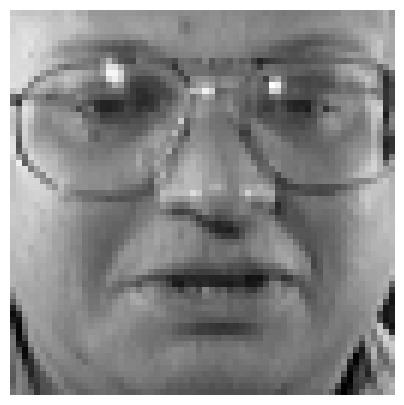

In [265]:
# Visualizing the data
plt.figure(figsize=(5,5))
plt.imshow(faces[1].reshape(64,64), cmap=plt.cm.gray, interpolation='nearest')
plt.axis('off')

In [266]:
nmf = NMF(n_components=25, max_iter=1500, tol=5e-5, random_state=2)
nmf.fit(faces)

NMF(max_iter=1500, n_components=25, random_state=2, tol=5e-05)

In [267]:
nmf.components_.shape

(25, 4096)

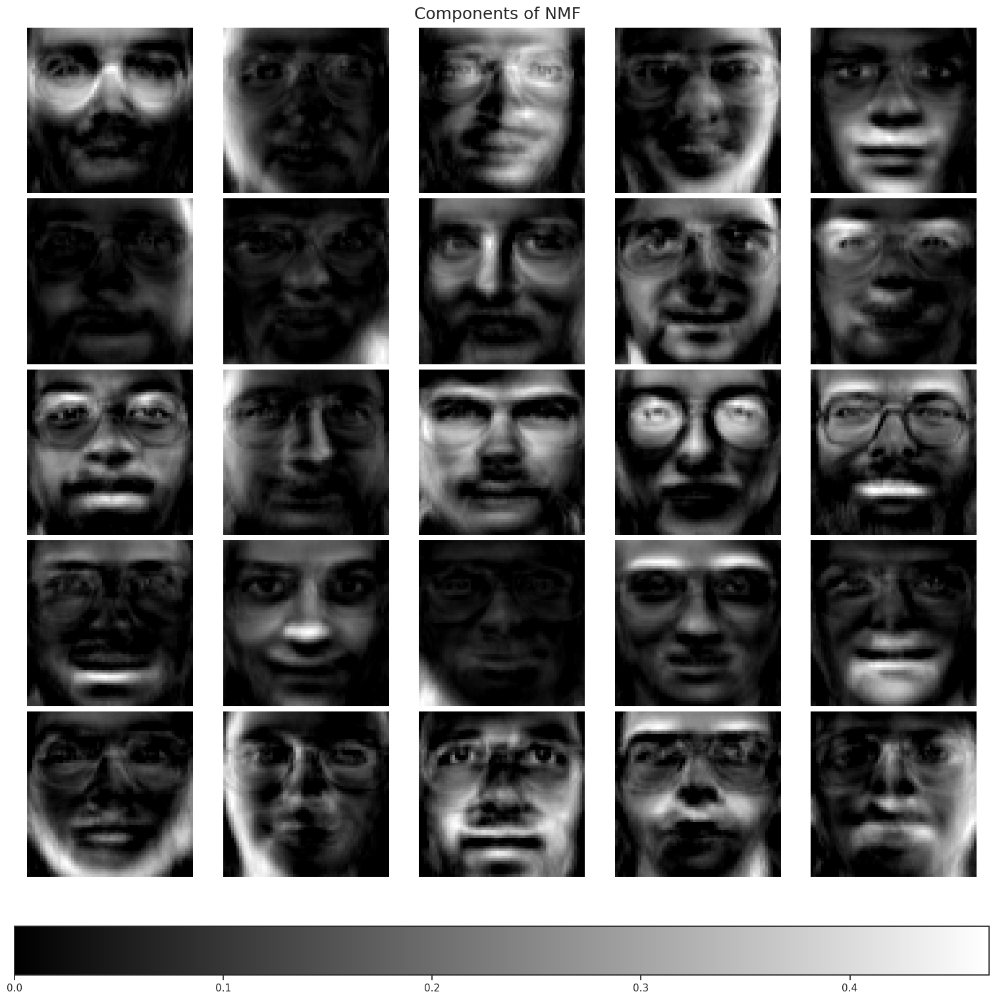

In [268]:
# Visualizing the components
fig, axes = plt.subplots(5,5, figsize=(15,15), facecolor='white', constrained_layout=True)

fig.suptitle('Components of NMF', size=18)

for ax, image in zip(axes.flatten(), nmf.components_):
    im = ax.imshow(
        image.reshape(64,64),
        cmap=plt.cm.gray,
        interpolation = 'nearest',
    )
    ax.axis('off')
fig.colorbar(im, ax=axes, orientation="horizontal")

Weight vector:


array([[0.04745921, 0.        , 0.05207892, 0.00469927, 0.03682869,
        0.03129827, 0.01880298, 0.        , 0.        , 0.        ,
        0.        , 0.04163911, 0.        , 0.02885251, 0.00581443,
        0.04859332, 0.        , 0.0349159 , 0.        , 0.        ,
        0.06930345, 0.04083585, 0.2898026 , 0.40145388, 0.23343599]],
      dtype=float32)

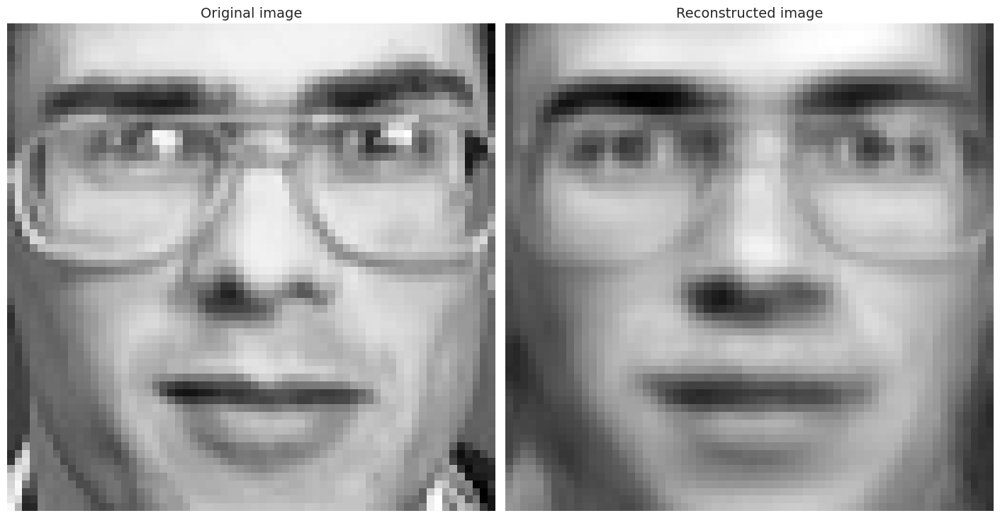

In [269]:
index = 3
weight = nmf.transform(faces[index].reshape(1,-1))
print('Weight vector:',)
display(weight)
reconstructed_image = weight@nmf.components_

fig, ax = plt.subplots(1, 2, constrained_layout=True, facecolor='white')

ax[0].imshow(faces[index].reshape(64,64), cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title('Original image', size=14)
ax[0].axis('off')

ax[1].imshow(reconstructed_image.reshape(64,64), cmap=plt.cm.gray, interpolation='nearest')
ax[1].set_title('Reconstructed image', size=14)
ax[1].axis('off');

Text(0.5, 1.0, 'Generated Figure')

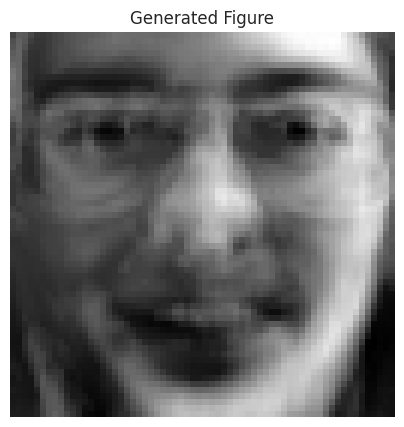

In [270]:
# Create new face 
weight_vector = np.random.uniform(0,1, 25)

reconstructed_image = weight_vector@nmf.components_

plt.figure(figsize=(5,5))
plt.imshow(reconstructed_image.reshape(64,64), cmap=plt.cm.gray)
plt.axis('off')
plt.title('Generated Figure')

## Further Reading:

<ul>
<li>Lee, D., Seung, H. Learning the parts of objects by non-negative matrix factorization. Nature 401, 788–791 (1999). <a href='https://doi.org/10.1038/44565'>https://doi.org/10.1038/44565<a/a></li>

<li> <a href='https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.NMF.html#sklearn.decomposition.NMF'>NMF-Scikit-Learn</a></li>

# t-SNE - t-Distributed Stochastic Neighbor Embedding

t-SNE is a statistical technique for visulaizing high-dimensional data in a lower dimension. It is a non-linear dimensionality reduction technique. The goal is to represent similar points closer to one another and dissimilar points far from each other. It achieves this by the following steps:

<ol>
    <li> Construct a probability distribution over pairs of samples based on their similarity </li>
    <li> Define a similar probability distribution in low dimension (usually 2 or 3) and minimize the Kullback-Leibler Divergence between the two distributions </li>
    </ol>
The commonly used similarity metric is the Euclidean distance. One important parameter that can be adjusted in tSNE is perplexity. Perplexity, to put simply, is a guess about the number of 'similar' neighbors there are to a given point.

In [271]:
digits = load_digits()
print(digits.DESCR)

.. _digits_dataset:

Optical recognition of handwritten digits dataset
--------------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 1797
    :Number of Attributes: 64
    :Attribute Information: 8x8 image of integer pixels in the range 0..16.
    :Missing Attribute Values: None
    :Creator: E. Alpaydin (alpaydin '@' boun.edu.tr)
    :Date: July; 1998

This is a copy of the test set of the UCI ML hand-written digits datasets
https://archive.ics.uci.edu/ml/datasets/Optical+Recognition+of+Handwritten+Digits

The data set contains images of hand-written digits: 10 classes where
each class refers to a digit.

Preprocessing programs made available by NIST were used to extract
normalized bitmaps of handwritten digits from a preprinted form. From a
total of 43 people, 30 contributed to the training set and different 13
to the test set. 32x32 bitmaps are divided into nonoverlapping blocks of
4x4 and the number of on pixels are counted in each blo

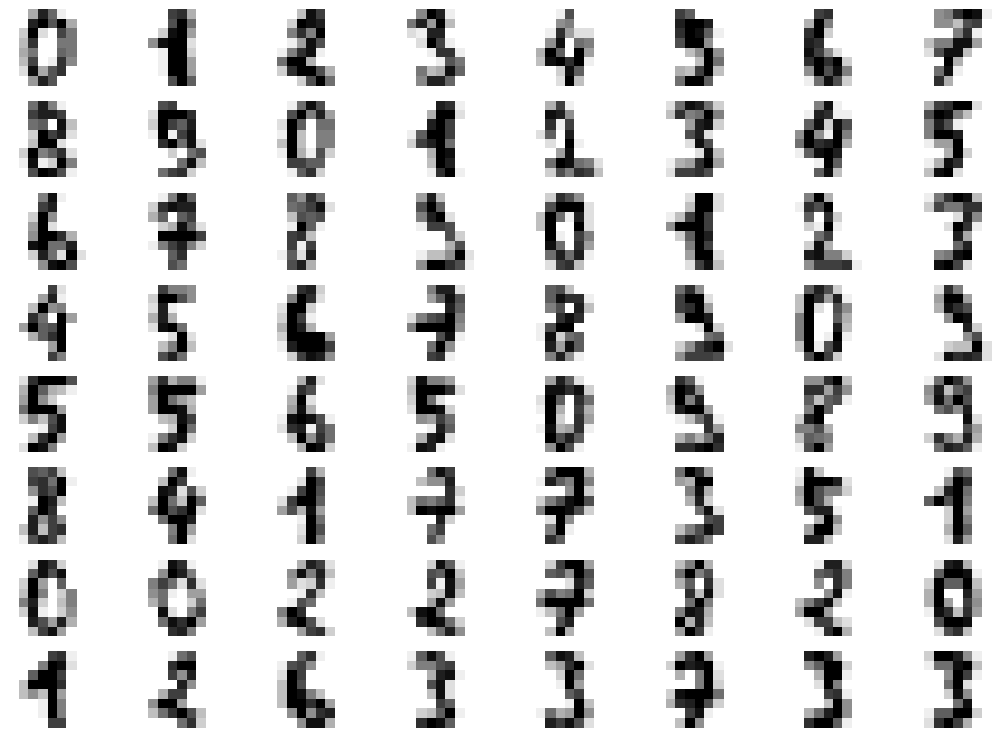

In [272]:
fig, axes = plt.subplots(8,8)

for i, ax in enumerate(axes.flatten()):
    ax.imshow(digits.images[i], cmap='gray_r')

plt.setp(axes.flatten(), xticks=[], yticks=[], frame_on=False);

In [273]:
#Image matrix
digits.images[0]

array([[ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.],
       [ 0.,  0., 13., 15., 10., 15.,  5.,  0.],
       [ 0.,  3., 15.,  2.,  0., 11.,  8.,  0.],
       [ 0.,  4., 12.,  0.,  0.,  8.,  8.,  0.],
       [ 0.,  5.,  8.,  0.,  0.,  9.,  8.,  0.],
       [ 0.,  4., 11.,  0.,  1., 12.,  7.,  0.],
       [ 0.,  2., 14.,  5., 10., 12.,  0.,  0.],
       [ 0.,  0.,  6., 13., 10.,  0.,  0.,  0.]])

In [274]:
# Flattened image
digits.data[0]

array([ 0.,  0.,  5., 13.,  9.,  1.,  0.,  0.,  0.,  0., 13., 15., 10.,
       15.,  5.,  0.,  0.,  3., 15.,  2.,  0., 11.,  8.,  0.,  0.,  4.,
       12.,  0.,  0.,  8.,  8.,  0.,  0.,  5.,  8.,  0.,  0.,  9.,  8.,
        0.,  0.,  4., 11.,  0.,  1., 12.,  7.,  0.,  0.,  2., 14.,  5.,
       10., 12.,  0.,  0.,  0.,  0.,  6., 13., 10.,  0.,  0.,  0.])

Text(0, 0.5, 'Cumulative Explained Variance')

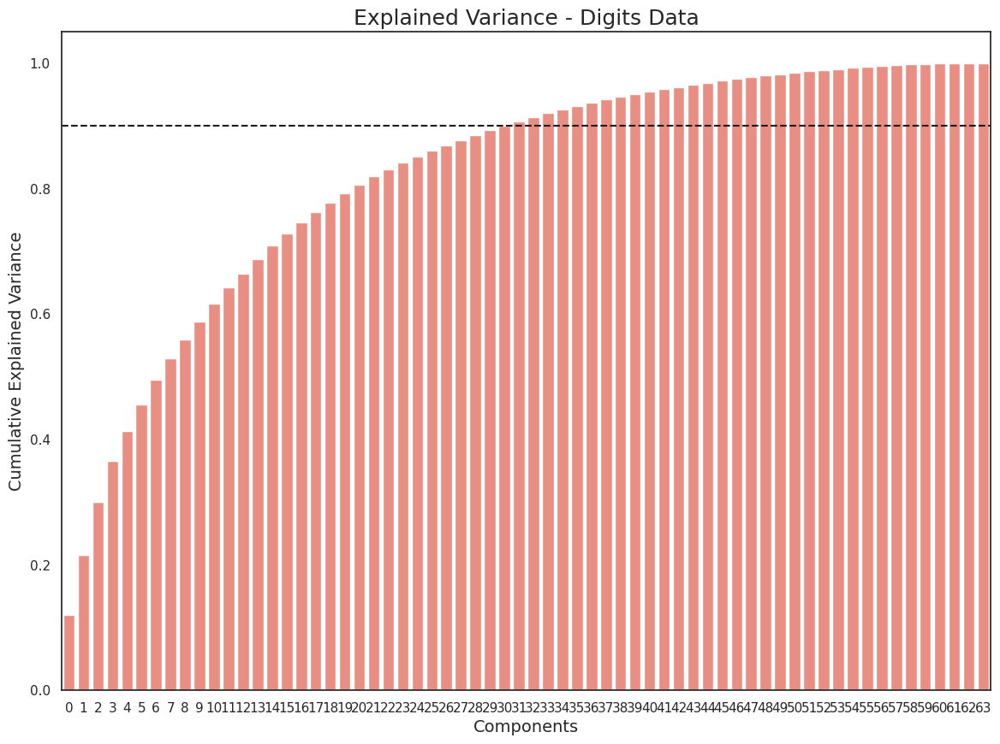

In [275]:
scaled_digit_data = StandardScaler().fit_transform(digits.data)
pca = PCA().fit(scaled_digit_data)

sns.barplot(y=np.cumsum(pca.explained_variance_ratio_),
            x = [i for i in range(64)],
           color = 'salmon')
plt.title('Explained Variance - Digits Data', size=18)
plt.axhline(y=0.9, c='k', ls='--')
plt.xlabel('Components', size=14)
plt.ylabel('Cumulative Explained Variance', size=14)

In [276]:
from sklearn.manifold import TSNE

In [277]:
perplexity = 50
tsne = TSNE(
        n_components=2,
        perplexity = perplexity,
        n_iter=500,
        n_iter_without_progress=150,
        n_jobs=2,
        random_state=0,
    )


tsne_transform = tsne.fit_transform(scaled_digit_data)

In [278]:
digits_tsne = pd.DataFrame(data = tsne_transform, columns=[f'Component_{i}' for i in range(2)])
digits_tsne['number'] = digits.target

Text(0.5, 1.0, 'tSNE on the handwritten digits dataset')

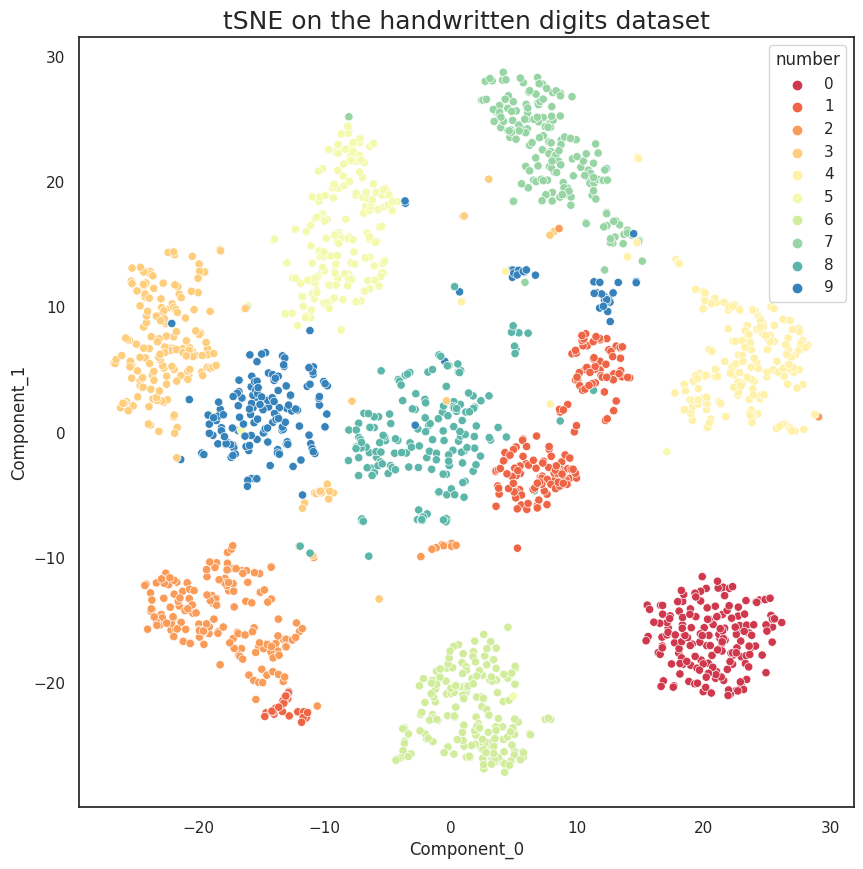

In [279]:
cmap = sns.color_palette('Spectral', n_colors=10)
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(
    data=digits_tsne,
    x='Component_0',
    y='Component_1',
    hue='number',
    palette=cmap
)
plt.title('tSNE on the handwritten digits dataset', size=18)

## Further Reading

<ul>
  <li>Van der Maaten, L., & Hinton, G. (2008). Visualizing data using t-SNE. Journal of machine learning research, 9(11).</li>
    <li> <a href='https://lvdmaaten.github.io/tsne/'>tSNE - Inventor Website</a></li>
    <li><a href='https://distill.pub/2016/misread-tsne/'>Common Pitfalls and Precautions</a></li>
</ul>

# UMAP - Uniform Manifold Approximation and Projection

UMAP is a powerful visualization technique for representing high-dimensional data. Although the mathematics behind UMAP is advanced and behind the scope of this class, it can be understood this way: The points are modelled in the high-dimension as a weighted graph where similar objects have an higher edge weight. Then, a low dimensional analogue is created and optimized to be as similar to the high-dimensional graph as possible.<br>

UMAP has two advantages over tSNE: 
<ul>
    <li> It is faster</li>
    <li> It better preserves global structure </li>
</ul>

UMAP has two important parameters:
<ul>
    <li> <code>n_neighbors</code> - which controls the balance between global and local structure</li>
    <li> <code>min_dist</code> - The minimum distance between two points in the lower representation </li>
</ul>

The required packages can be installed as follows:<br>
<center><code>pip install umap-learn</code></center>
<center><code>pip install umap-learn[plot]</code></center>

In [280]:
n_neighbors = 1260 # if this parameter value is low then it indicate more on local structure of clustering on the other hand global structure
min_dist = 0.01
reducer = UMAP(
    n_neighbors=n_neighbors,
    min_dist=min_dist,
    random_state=42
)
reducer.fit(scaled_digit_data)

UMAP(min_dist=0.01, n_neighbors=1260, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

In [281]:
digits_umap = reducer.transform(scaled_digit_data)

umap_df = pd.DataFrame(data = digits_umap, columns=[f'Component_{i}' for i in range(2)])
umap_df['number'] = digits.target

<Axes: xlabel='Component_0', ylabel='Component_1'>

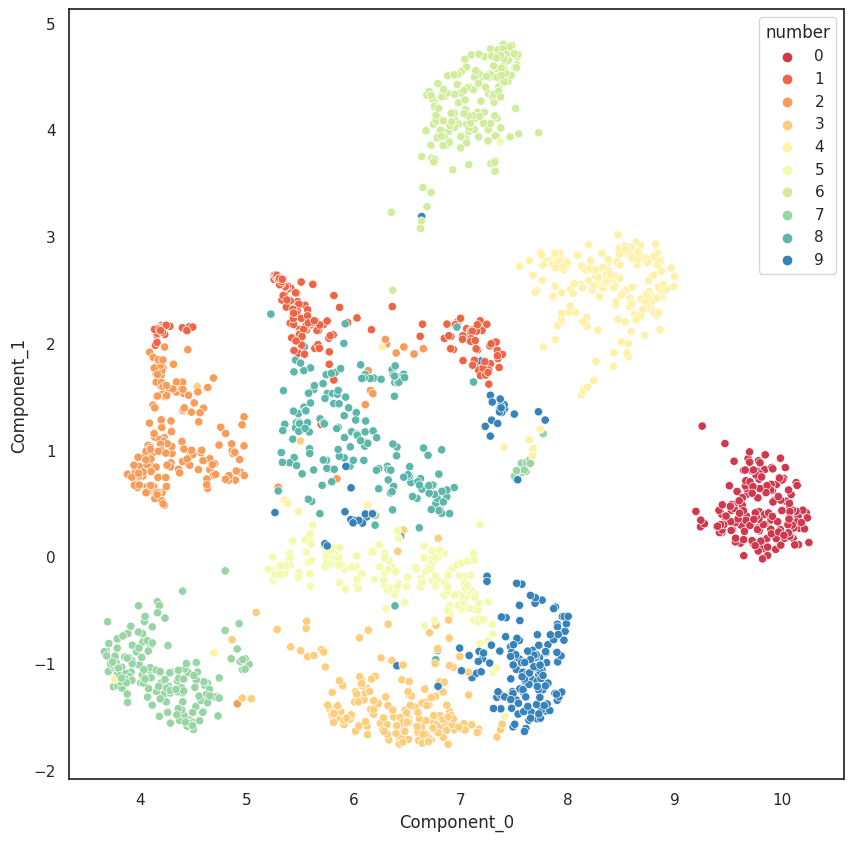

In [282]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(
    data=umap_df,
    x='Component_0',
    y='Component_1',
    hue='number',
    palette=cmap
)

<Axes: >

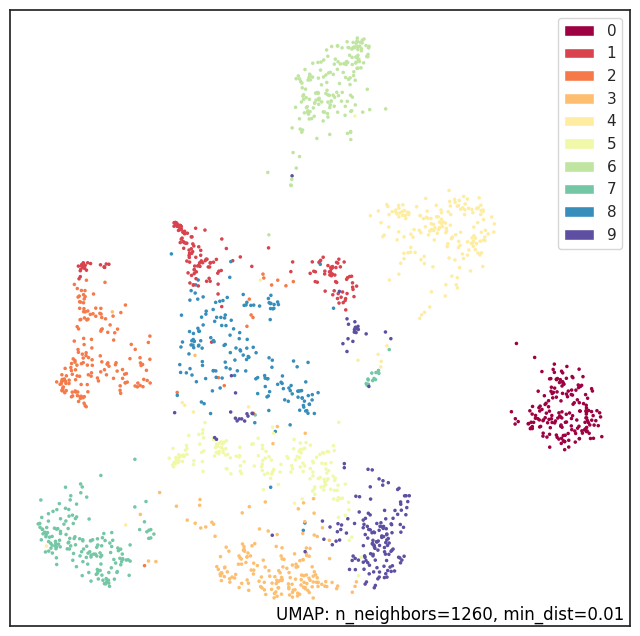

In [283]:
umap.plot.points(reducer, labels=digits.target)

## Further Reading:
<ul>
    <li> The original documentation with the introduction to the working of UMAP: <a href='https://umap-learn.readthedocs.io/en/latest/how_umap_works.html'>link</a></li>
    <li> A visual explanation of UMAP: <a href='https://pair-code.github.io/understanding-umap/'> link</a></li>
</ul>

# Classification Methods

In [284]:
df = pd.read_csv('Iris.csv')
df

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...,...
145,146,6.7,3.0,5.2,2.3,Iris-virginica
146,147,6.3,2.5,5.0,1.9,Iris-virginica
147,148,6.5,3.0,5.2,2.0,Iris-virginica
148,149,6.2,3.4,5.4,2.3,Iris-virginica


In [285]:
df.describe()

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm
count,150.000000,150.000000,150.000000,150.000000,150.000000
mean,75.500000,5.843333,3.054000,3.758667,1.198667
std,43.445368,0.828066,0.433594,1.764420,0.763161
min,1.000000,4.300000,2.000000,1.000000,0.100000
25%,38.250000,5.100000,2.800000,1.600000,0.300000
50%,75.500000,5.800000,3.000000,4.350000,1.300000
75%,112.750000,6.400000,3.300000,5.100000,1.800000
max,150.000000,7.900000,4.400000,6.900000,2.500000


In [286]:
print("Total number of missing values")
print(30 * "-")
print(df.isna().sum())
print(30 * "-")
print("Total missing values are:", df.isna().sum().sum())
print(30 * "-")

Total number of missing values
------------------------------
Id               0
SepalLengthCm    0
SepalWidthCm     0
PetalLengthCm    0
PetalWidthCm     0
Species          0
dtype: int64
------------------------------
Total missing values are: 0
------------------------------


In [287]:
df.drop(columns = ['Id'], axis = 1, inplace = True)
df

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


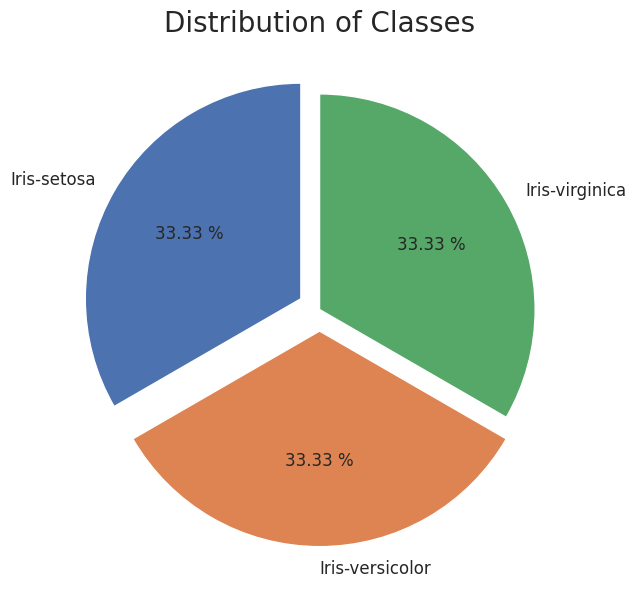

In [288]:
count_list = [(df.Species == 'Iris-setosa').sum(), (df.Species == 'Iris-versicolor').sum(), (df.Species == 'Iris-virginica').sum()]
label_list = list(df['Species'].unique())
plt.figure(figsize = (10, 7))
plt.pie(count_list, labels = label_list, autopct = "%.2f %%", startangle = 90, explode = (0.1, 0.1, 0.0), textprops = {'fontsize': 12})
plt.title('Distribution of Classes', fontsize = 20)
plt.show()

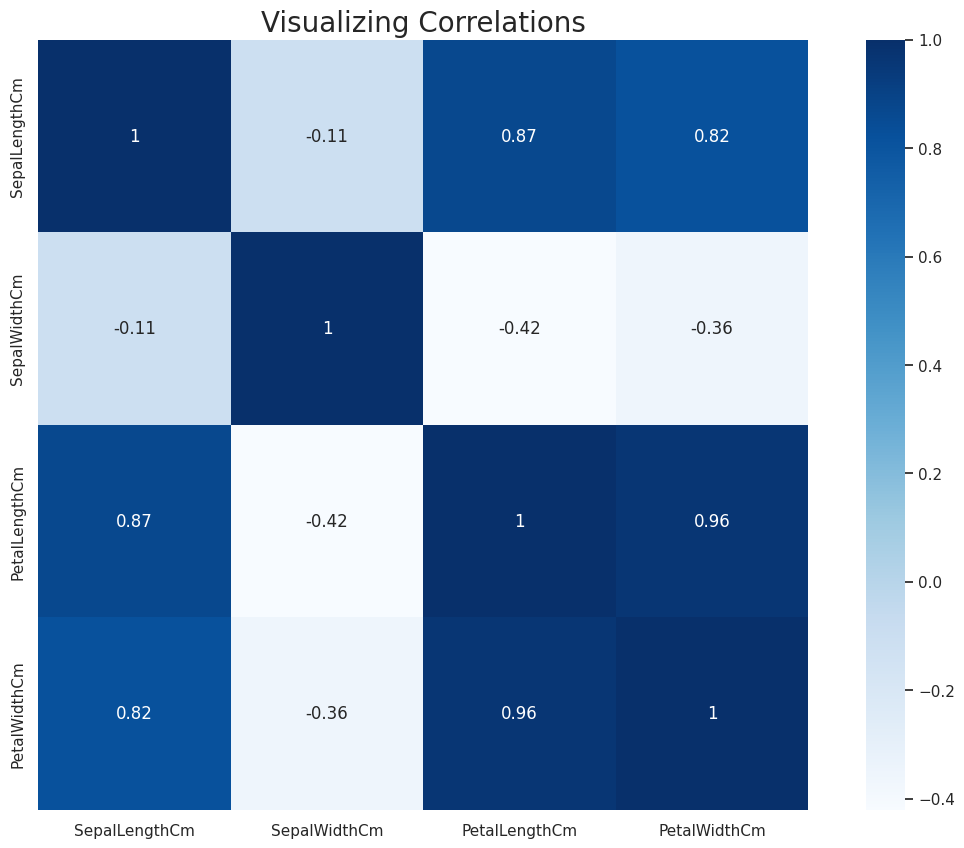

In [289]:
plt.figure(figsize = (15, 10))
sns.heatmap(df.corr(), cmap = 'Blues', square = True, annot = True)
plt.title("Visualizing Correlations", size = 20)
plt.show()

In [290]:
X = df.drop(['Species'], axis = 1)
y = df['Species']
print(X, "\n", y)

     SepalLengthCm  SepalWidthCm  PetalLengthCm  PetalWidthCm
0              5.1           3.5            1.4           0.2
1              4.9           3.0            1.4           0.2
2              4.7           3.2            1.3           0.2
3              4.6           3.1            1.5           0.2
4              5.0           3.6            1.4           0.2
..             ...           ...            ...           ...
145            6.7           3.0            5.2           2.3
146            6.3           2.5            5.0           1.9
147            6.5           3.0            5.2           2.0
148            6.2           3.4            5.4           2.3
149            5.9           3.0            5.1           1.8

[150 rows x 4 columns] 
 0         Iris-setosa
1         Iris-setosa
2         Iris-setosa
3         Iris-setosa
4         Iris-setosa
            ...      
145    Iris-virginica
146    Iris-virginica
147    Iris-virginica
148    Iris-virginica
149    Iri

In [291]:
scaler = StandardScaler()  # Standardization
X = scaler.fit_transform(X)

In [292]:
label_encoder = LabelEncoder() #Encoding class names in numerical values
y = label_encoder.fit_transform(y)

In [293]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = 0)

**Displaying results**

In [294]:
def generate_result(model, predictions, name):
    cl_rep = classification_report(y_test, predictions)
    print("\nThe classification report for " + name + " is:", cl_rep, sep = "\n")
    cm = confusion_matrix(y_test, predictions)
    plt.figure(figsize = (8, 6))
    sns.heatmap(cm, annot = True, cmap = 'Spectral', annot_kws = {'size': 15}, square = True)
    plt.title('Confusion Matrix for ' + name, size = 15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.show() 

**Confusion Matrix for Multi-class classification**

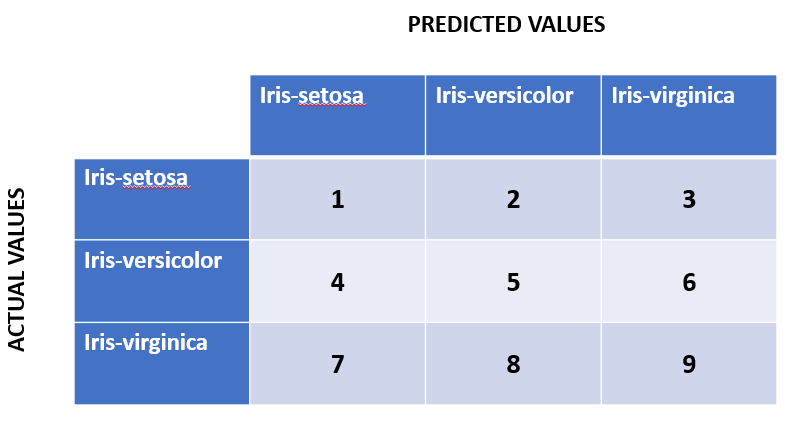

#**Logistic Regression**

The logistic model:

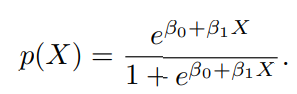

To fit the model, maximum likelihood is used

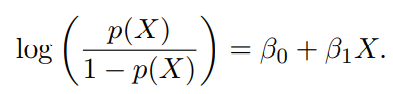

The accuracy for Logistic Regression is: 96.66666666666667 %

The classification report for Logistic Regression is:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       0.91      1.00      0.95        10
           2       1.00      0.90      0.95        10

    accuracy                           0.97        30
   macro avg       0.97      0.97      0.97        30
weighted avg       0.97      0.97      0.97        30



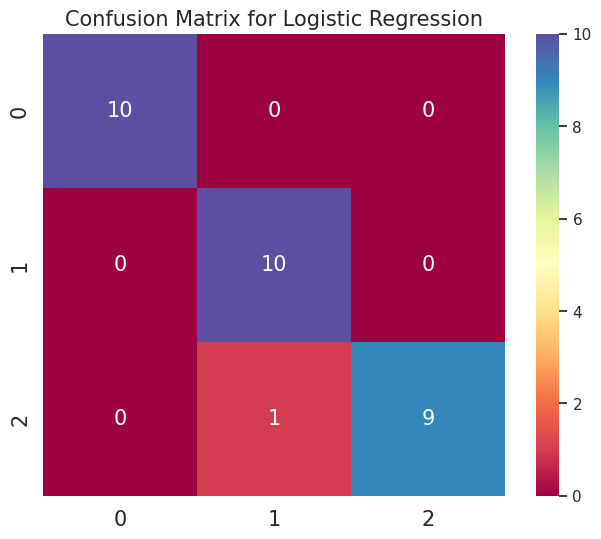

In [295]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
acc_lr = lr.score(X_test, y_test)
print("The accuracy for Logistic Regression is:", acc_lr * 100, "%")
generate_result(lr, y_pred, 'Logistic Regression')


# **Naive Bayes**

Assumption made: Within the kth class, the p predictors are independent.
This can be mathematically represented as: 

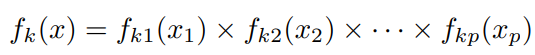

The accuracy for Gaussian Naive Bayes is: 96.66666666666667 %

The classification report for Gaussian Naive Bayes is:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       0.91      1.00      0.95        10
           2       1.00      0.90      0.95        10

    accuracy                           0.97        30
   macro avg       0.97      0.97      0.97        30
weighted avg       0.97      0.97      0.97        30



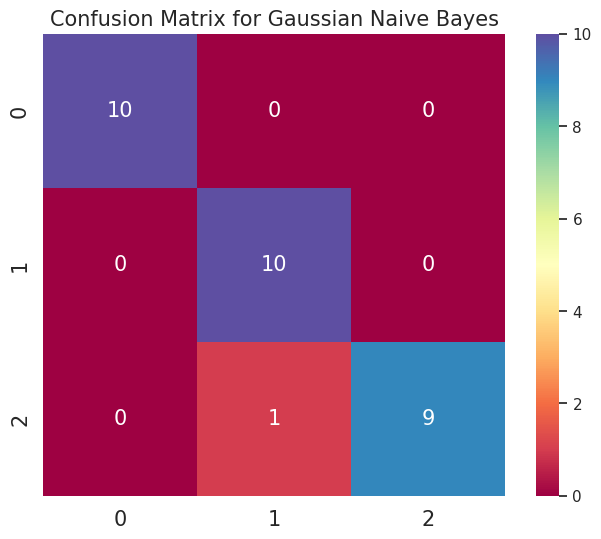

In [296]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_test)
acc_gnb = gnb.score(X_test, y_test)
print('The accuracy for Gaussian Naive Bayes is:', acc_gnb * 100, '%')
generate_result(gnb, y_pred, 'Gaussian Naive Bayes')

#**LDA**

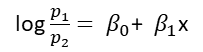

The accuracy for Linear Discriminant Analysis is: 100.0 %

The classification report for LDA is:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



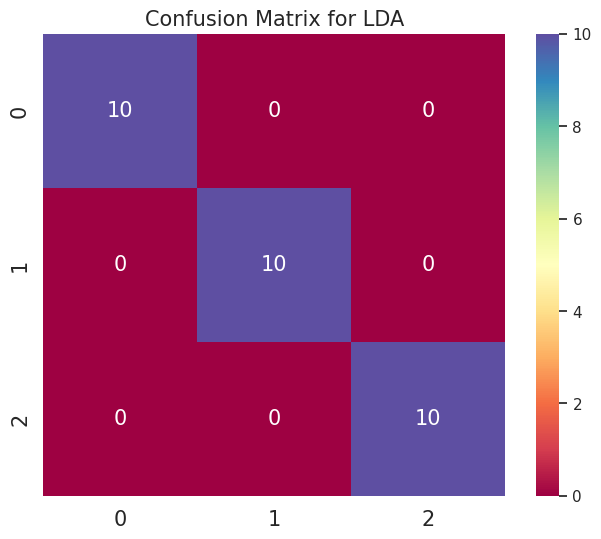

In [297]:
#Mean and convariance of all classes are same in LDA
lda=LinearDiscriminantAnalysis() 
lda.fit(X_train, y_train)
y_pred = lda.predict(X_test)
acc_lda = lda.score(X_test, y_test)
print('The accuracy for Linear Discriminant Analysis is:', acc_lda * 100, '%')
generate_result(lda, y_pred, 'LDA')

#**QDA**

The accuracy for Quadratic Discriminant Analysis is: 100.0 %

The classification report for QDA is:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        10

    accuracy                           1.00        30
   macro avg       1.00      1.00      1.00        30
weighted avg       1.00      1.00      1.00        30



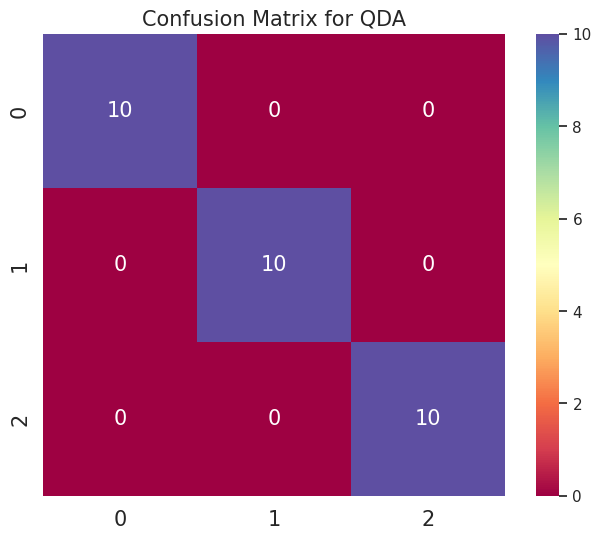

In [298]:
#Mean and convariance of all classes are not same in QDA
qda = QuadraticDiscriminantAnalysis()
qda.fit(X_train, y_train)
y_pred = qda.predict(X_test)
acc_qda = qda.score(X_test, y_test)
print('The accuracy for Quadratic Discriminant Analysis is:', acc_qda * 100, '%')
generate_result(qda, y_pred, 'QDA')

#**KNN**

In [301]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
acc_knn = knn.score(X_test, y_test)
print("The accuracy for KNN is:", acc_knn * 100, "%")

The accuracy for KNN is: 96.66666666666667 %


#**Performance of KNN**

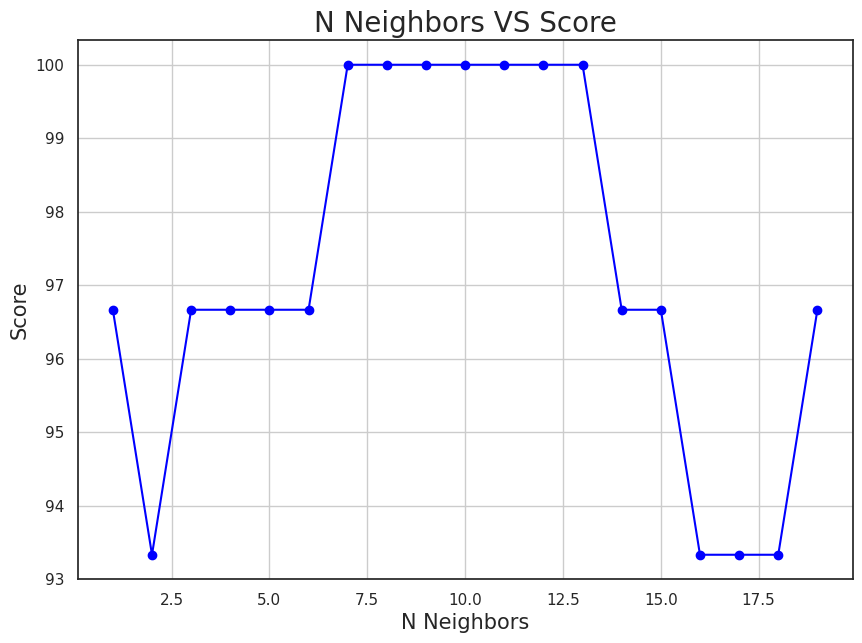

In [302]:
store_acc = []
neighbors = [i for i in range(1, 20)]
for i in range(len(neighbors)):
    knn_improved = KNeighborsClassifier(n_neighbors = neighbors[i])
    knn_improved.fit(X_train, y_train)
    y_pred = knn_improved.predict(X_test)
    acc_knn_for_diff_values = ((knn_improved.score(X_test, y_test)) * 100)
    store_acc.append(acc_knn_for_diff_values)
plt.figure(figsize = (10, 7))
plt.plot(neighbors, store_acc, color = 'blue', marker = 'o')
plt.title('N Neighbors VS Score', fontsize = 20)
plt.xlabel('N Neighbors', fontsize = 15)
plt.ylabel('Score', fontsize = 15)
plt.grid(True)
plt.show()

The code below would work for a binary classification. However in a mutliclass classification, we will need to divide our problem into subsets of binary classification problems inorder to obtain the ROCs.

In [303]:
probas_ = lr.fit(X_train, y_train).predict_proba(X_test)
# Compute ROC curve and area the curve
fpr, tpr, thresholds = roc_curve(y_test, probas_[:, 1])
roc_auc = auc(fpr, tpr)
print ("Area under the ROC curve : %f" % roc_auc)

ValueError: ignored

# **ROC for Multiclass Classification**

In [304]:
X=df.drop(['Species'], axis = 1)
features=X.to_numpy()
target=y

In [305]:
features[:5, :]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2]])

In [306]:
target[:5]

array([0, 0, 0, 0, 0])

In [307]:
target = label_binarize(target,
                        classes=[0, 1, 2])
target[:5]

array([[1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0],
       [1, 0, 0]])

In [308]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.25,stratify=y,random_state = 0)
model_1 = lr.fit(X_train, y_train[:, 0])
model_2 = lr.fit(X_train, y_train[:, 1])
model_3 = lr.fit(X_train, y_train[:, 2])
 
print(f"Model Accuracy :")
print(f"model 1 - {model_1.score(X_test, y_test[:, 0])}")
print(f"model 2 - {model_2.score(X_test, y_test[:, 1])}")
print(f"model 3 - {model_3.score(X_test, y_test[:, 2])}")

Model Accuracy :
model 1 - 0.34210526315789475
model 2 - 0.34210526315789475
model 3 - 1.0


In [309]:
model = OneVsRestClassifier(LogisticRegression(random_state=0)).fit(X_train, y_train)
prob_test_vec = model.predict_proba(X_test)
 
n_classes = 3
fpr = [0] * 3
tpr = [0] * 3
thresholds = [0] * 3
auc_score = [0] * 3
 
for i in range(n_classes):
    fpr[i], tpr[i], thresholds[i] = roc_curve(y_test[:, i],
                                              prob_test_vec[:, i])
    auc_score[i] = auc(fpr[i], tpr[i])
 
auc_score

[1.0, 0.7353846153846153, 1.0]

In [310]:
sum(auc_score)/n_classes

0.9117948717948717

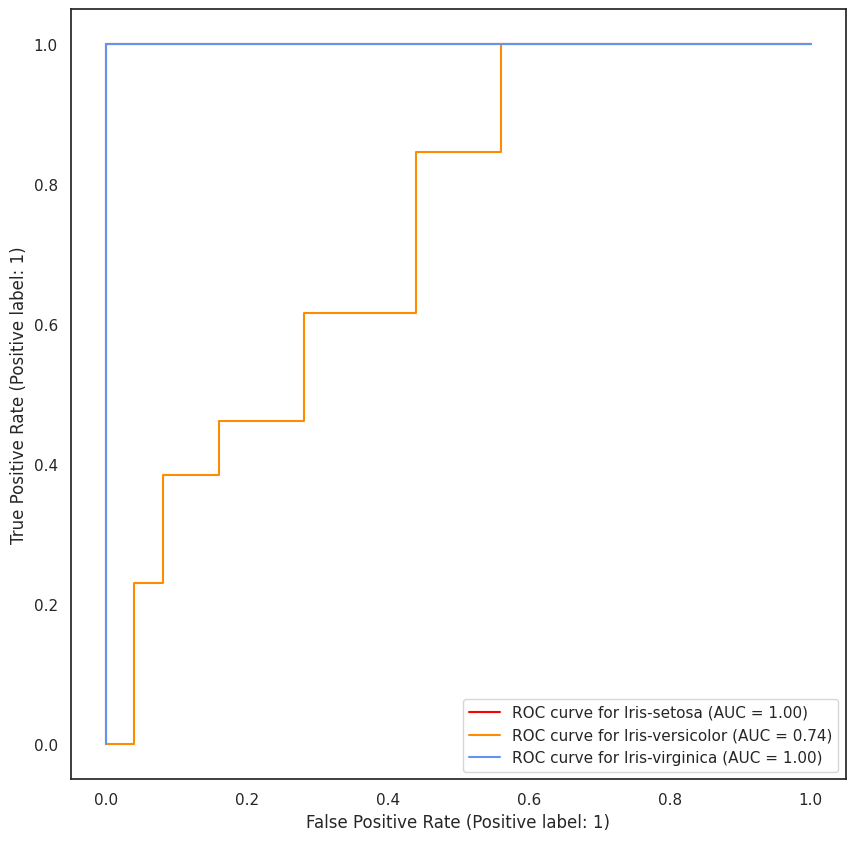

In [311]:
fig, ax = plt.subplots(figsize=(10, 10))
target_names =list(df['Species'].unique())
colors = cycle(["red", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(n_classes), colors):
    RocCurveDisplay.from_predictions(
        y_test[:, class_id],
        prob_test_vec[:, class_id],
        name=f"ROC curve for {target_names[class_id]}",
        color=color,
        ax=ax,
    )

# Support Vector Machine

Maximum margin separating hyperplane



![image.png](attachment:image.png)

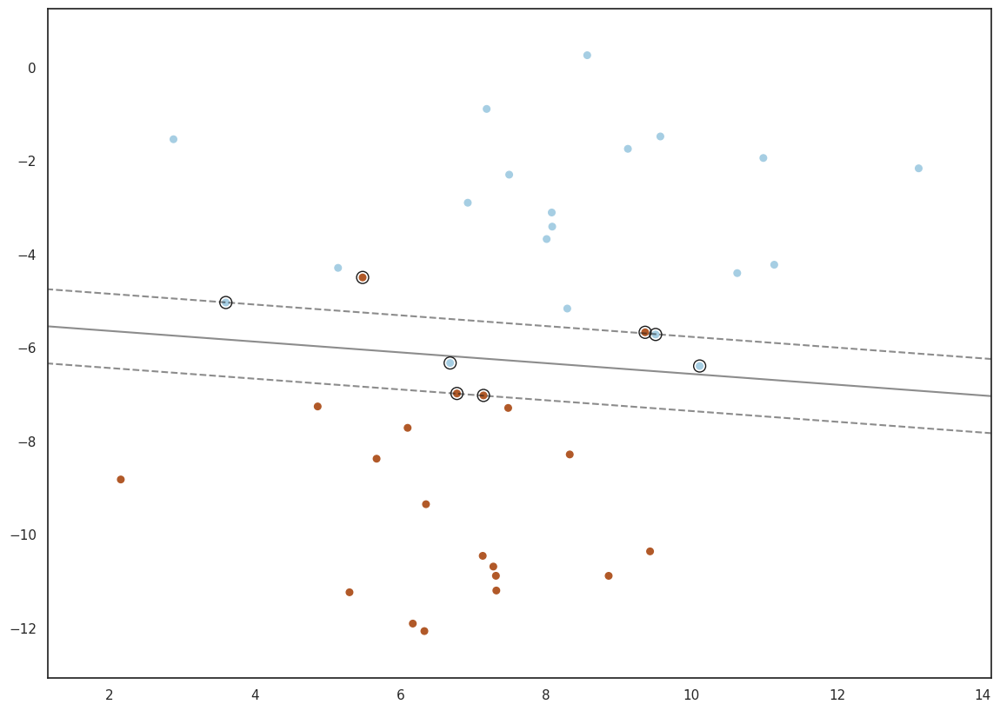

In [312]:
# we create 40 separable points
X, y = make_blobs(n_samples=40, centers=2, random_state=6,cluster_std=2)

clf = svm.SVC(kernel="linear", C=1000)
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=plt.cm.Paired)

# plot the decision function
ax = plt.gca()
DecisionBoundaryDisplay.from_estimator(
    clf,
    X,
    plot_method="contour",
    colors="k",
    levels=[-1, 0, 1],
    alpha=0.5,
    linestyles=["--", "-", "--"],
    ax=ax,
)
# plot support vectors
ax.scatter(
    clf.support_vectors_[:, 0],
    clf.support_vectors_[:, 1],
    s=100,
    linewidth=1,
    facecolors="none",
    edgecolors="k",
)
plt.show()

Kernel functions in SVM

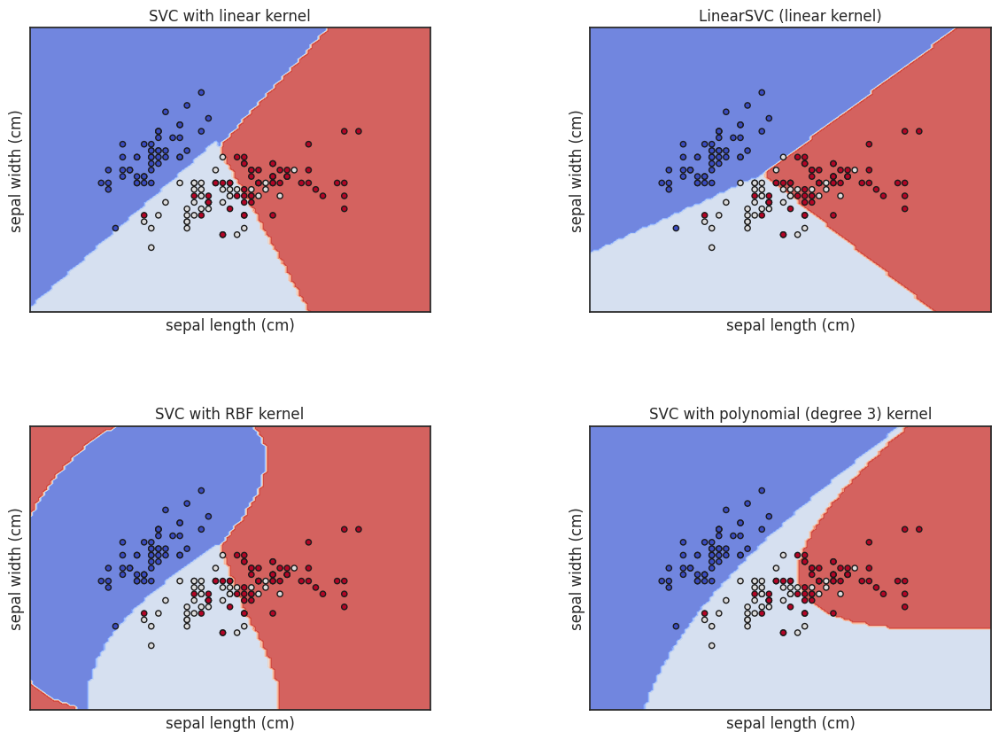

In [313]:
iris = datasets.load_iris()
# Taking the first two features. 
X = iris.data[:, :2]
y = iris.target


C = 1.0  # SVM regularization parameter
models = (
    svm.SVC(kernel="linear", C=C),
    svm.LinearSVC(C=C, max_iter=10000),
    svm.SVC(kernel="rbf", gamma=0.7, C=C),
    svm.SVC(kernel="poly", degree=3, gamma="auto", C=C),
)
models = (clf.fit(X, y) for clf in models)

# title for plots
titles = (
    "SVC with linear kernel",
    "LinearSVC (linear kernel)",
    "SVC with RBF kernel",
    "SVC with polynomial (degree 3) kernel",
)


fig, sub = plt.subplots(2, 2)
plt.subplots_adjust(wspace=0.4, hspace=0.4)

X0, X1 = X[:, 0], X[:, 1]

for clf, title, ax in zip(models, titles, sub.flatten()):
    disp = DecisionBoundaryDisplay.from_estimator(
        clf,
        X,
        response_method="predict",
        cmap=plt.cm.coolwarm,
        alpha=0.8,
        ax=ax,
        xlabel=iris.feature_names[0],
        ylabel=iris.feature_names[1],
    )
    ax.scatter(X0, X1, c=y, cmap=plt.cm.coolwarm, s=20, edgecolors="k")
    ax.set_xticks(())
    ax.set_yticks(())
    ax.set_title(title)

plt.show()

Implementing SVM for the penguin dataset

In [314]:
df = load_dataset('penguins')
df.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [315]:
df = df.dropna()
len(df)

333

*Splitting the dataset*

In [316]:
X = df[['bill_length_mm', 'bill_depth_mm']]
y = df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100)

**SVC class in sklearn SVM**

![image.png](attachment:image.png)

In [317]:
clf = SVC(kernel='linear')
clf.fit(X_train, y_train)

SVC(kernel='linear')

In [318]:
predictions = clf.predict(X_test)
print(predictions[:5])


['Chinstrap' 'Chinstrap' 'Gentoo' 'Adelie' 'Gentoo']


Visualising the SVM classification for this dataset (using binary clssification)

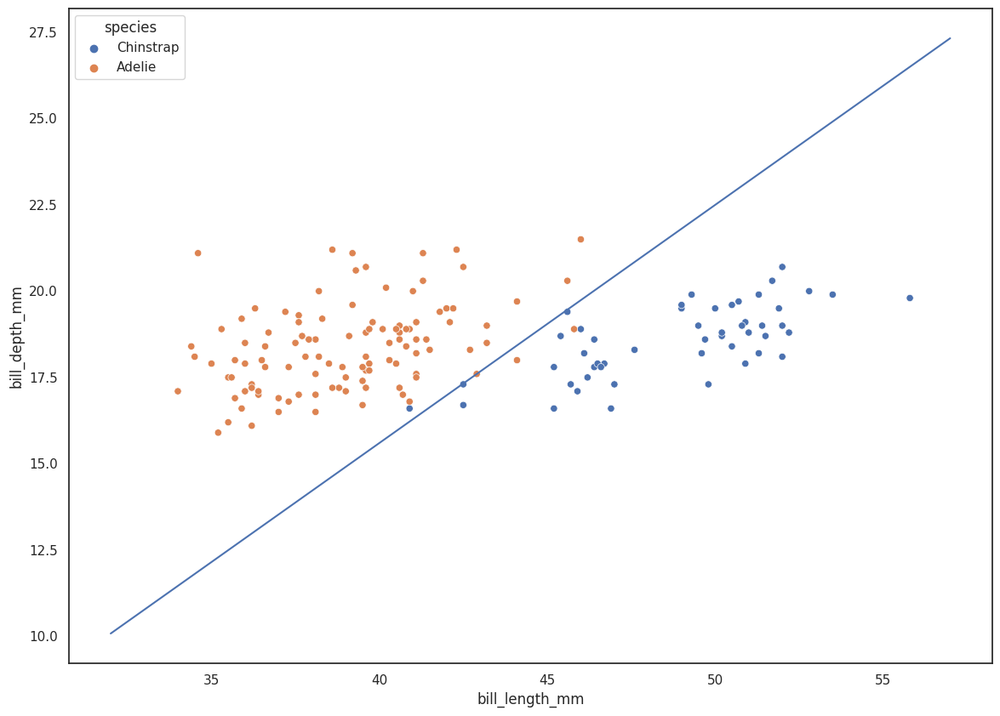

In [319]:
df = load_dataset('penguins')
df = df.dropna()
df = df[df['species'] != 'Gentoo']    # This limits us to two classes

# X = df.select_dtypes('number')
X = df[['bill_length_mm', 'bill_depth_mm']]
y = df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100)

clf = SVC(kernel='linear')
clf.fit(X_train, y_train)

# Visualizing the linear function for our SVM classifier
w = clf.coef_[0]
b = clf.intercept_[0]
x_visual = np.linspace(32,57)
y_visual = -(w[0] / w[1]) * x_visual - b / w[1]

scatterplot(data = X_train, x='bill_length_mm', y='bill_depth_mm', hue=y_train)
plt.plot(x_visual, y_visual)
plt.show()

Fitting the model and testing the accuracy

In [320]:
df = load_dataset('penguins')
df = df.dropna()

X = df[['bill_length_mm', 'bill_depth_mm']]
y = df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100)

clf = SVC(kernel='linear')
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)
print(accuracy_score(y_test, predictions))

0.9761904761904762


One Hot Encoding  

In [321]:
df = load_dataset('penguins')
df = df.dropna()

X = df.drop(columns = ['species'])
y = df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 100)

column_transformer = make_column_transformer((OneHotEncoder(), ['sex', 'island']),remainder='passthrough')

X_train = column_transformer.fit_transform(X_train)
X_train = pd.DataFrame(data=X_train, columns=column_transformer.get_feature_names_out())

In [322]:
print(X_train.iloc[:5, :4])

   onehotencoder__sex_Female  onehotencoder__sex_Male  \
0                        1.0                      0.0   
1                        1.0                      0.0   
2                        0.0                      1.0   
3                        1.0                      0.0   
4                        0.0                      1.0   

   onehotencoder__island_Biscoe  onehotencoder__island_Dream  
0                           1.0                          0.0  
1                           0.0                          0.0  
2                           0.0                          0.0  
3                           1.0                          0.0  
4                           0.0                          1.0  


Scaling the data

In [323]:
df = load_dataset('penguins')
df = df.dropna()

X = df.drop(columns = ['species'])
y = df['species']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 100)

column_transformer = make_column_transformer(
    (OneHotEncoder(), ['sex', 'island']),
    (StandardScaler(), ['bill_depth_mm', 'bill_length_mm', 'flipper_length_mm', 'body_mass_g']),
    remainder='passthrough')

X_train = column_transformer.fit_transform(X_train)
X_train = pd.DataFrame(data=X_train, columns=column_transformer.get_feature_names_out())



**Hyperparameters**

1. C- Regularization error
   Helps define how soft our margin can be. The smaller the C, wider the margin

2. A kernel looks at the similarly relationship between each pair of points and aims to find the best function transformation for that relationship
    Linear, polynomial, sigmoid, rbf

3. Gamma - helps define the influence of the training example. Smaller gamma indicates model is more generalized

Hyperparameter tuning and cross-validation

In [324]:
params = {
    'C': [0.1, 1, 10, 100, 1000],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
    'kernel': ['rbf']
}

clf = GridSearchCV(
    estimator=SVC(),
    param_grid=params,
    cv=5,
    n_jobs=5,
    verbose=1
)

clf.fit(X_train, y_train)
print(clf.best_params_)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
{'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}


In [325]:
X_test = column_transformer.transform(X_test)
X_test = pd.DataFrame(data=X_test, columns=column_transformer.get_feature_names_out())

# Make predictions and check the accuracy
predictions = clf.predict(X_test)
print(accuracy_score(y_test, predictions))

0.9880952380952381


*Metrics*

In [326]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

      Adelie       1.00      0.97      0.99        34
   Chinstrap       0.94      1.00      0.97        17
      Gentoo       1.00      1.00      1.00        33

    accuracy                           0.99        84
   macro avg       0.98      0.99      0.99        84
weighted avg       0.99      0.99      0.99        84



## <center> ID5002W:Industrial AI Laboratory
### <center> Week-8
### <center> Tree-based approaches for classification

**Contents:**  
1. Making different datasets
2. Decision tree classifier: Intrepretable model
3. Logistic regression vs Decision tree classifier
4. Decision tree classifier: High variance model
5. Bagging
6. Random forest classifier
7. Gradient boosting
8. Comparison of performance of tree based algorithms for mobile price prediction



# Making different datasets

In [327]:
# loading datasets from sklearn
moonX,moonY = make_moons(n_samples=200, noise=0.3, random_state=0)
blobX,blobY = make_blobs(n_samples=200, n_features=2, centers=2, cluster_std=1, random_state=0)
circleX,circleY = make_circles(n_samples=200, noise=0.3, random_state=0,factor=0.1)

# splliting the dataset to training and testing dataset
moonX_train, moonX_test, moonY_train, moonY_test = train_test_split(moonX, moonY, test_size=0.2, random_state=0)
blobX_train, blobX_test, blobY_train, blobY_test = train_test_split(blobX, blobY, test_size=0.2, random_state=0)
circleX_train, circleX_test, circleY_train, circleY_test = train_test_split(circleX, circleY, test_size=0.2, random_state=0)

In [328]:
# utility function for plotting 2d actual data
def scatter_2d_data(x1,x2,y,ax,title):
  '''
  x1: feature 1
  x2: feature 2
  y: classes
  ax: matplotlib axis for plotting the data
  '''
  ax.scatter(x1,x2,c=y, cmap=ListedColormap(["#FF0000", "#0000FF"]))
  ax.set_title(title)

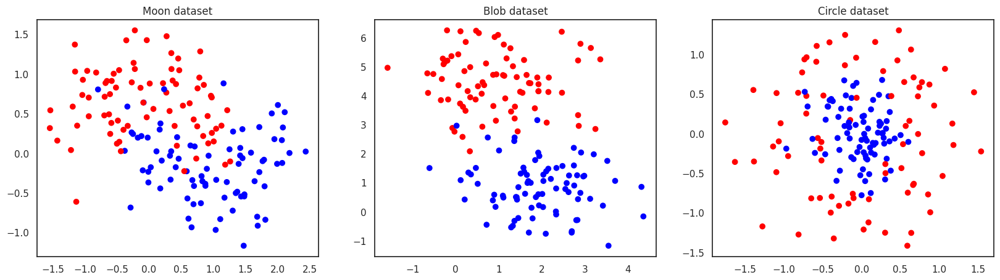

In [329]:
fig,ax =plt.subplots(1,3,figsize=(20,5))
ax=ax.flatten()
scatter_2d_data(moonX_train[:,0],moonX_train[:,1],moonY_train,ax[0],'Moon dataset')
scatter_2d_data(blobX_train[:,0],blobX_train[:,1],blobY_train,ax[1],'Blob dataset')
scatter_2d_data(circleX_train[:,0],circleX_train[:,1],circleY_train,ax[2],'Circle dataset')

# Decision tree: Intrepretable model

In [330]:
# utility function to plot the progress of decision tree training
def plot_DT_progress(x,y,n_steps):
  '''
  x: features
  y: class
  n_steps: number of steps for which progress has to be plotted
  '''
  fig,ax = plt.subplots(n_steps,2,figsize=(5*n_steps,5*n_steps))
  ax=ax.flatten()
  for i in range(n_steps):
    model = DecisionTreeClassifier(max_depth=i+1).fit(x,y)
    tree.plot_tree(model,ax=ax[i*2])
    ax[(i*2)+1].scatter(x[:,0],x[:,1],c=y, cmap=ListedColormap(["#FF0000", "#0000FF"]))
    db = DecisionBoundaryDisplay.from_estimator(model,x,xlabel='x1',ylabel='x2',alpha=0.5,ax=ax[(i*2)+1],response_method="predict")

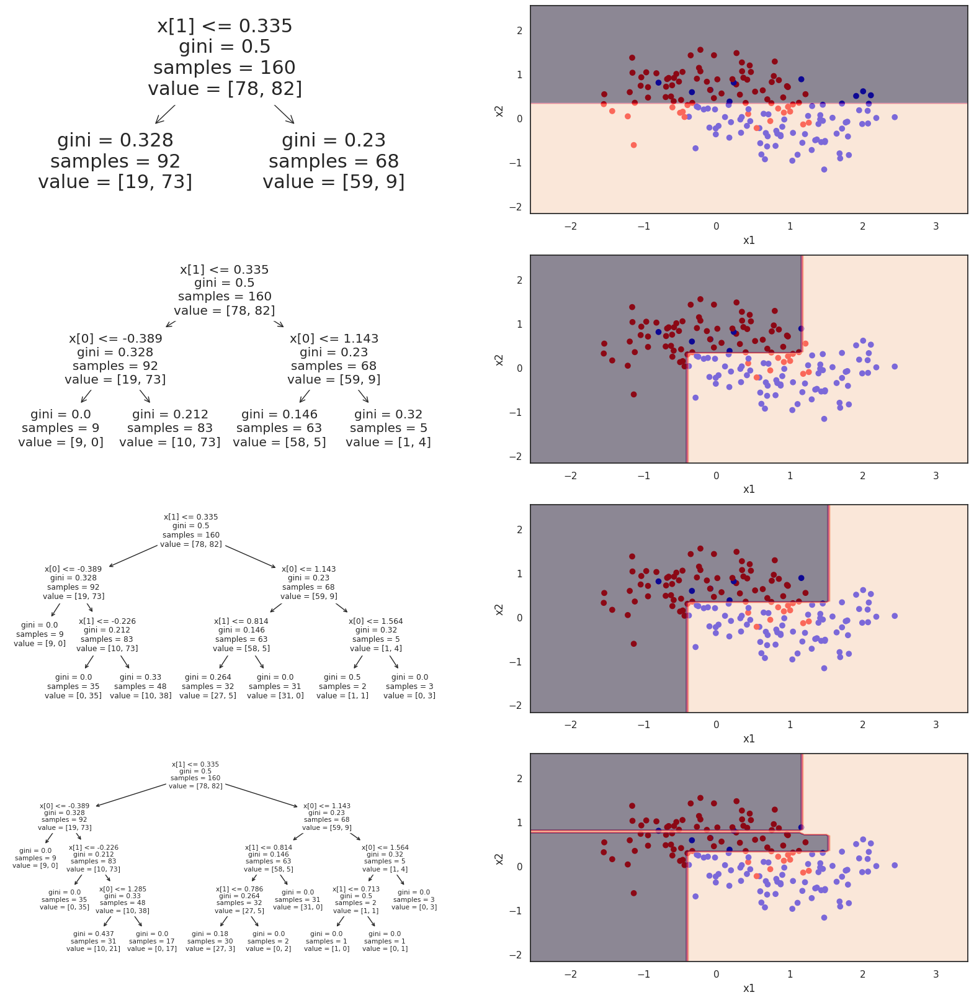

In [331]:
plot_DT_progress(moonX_train,moonY_train,4)

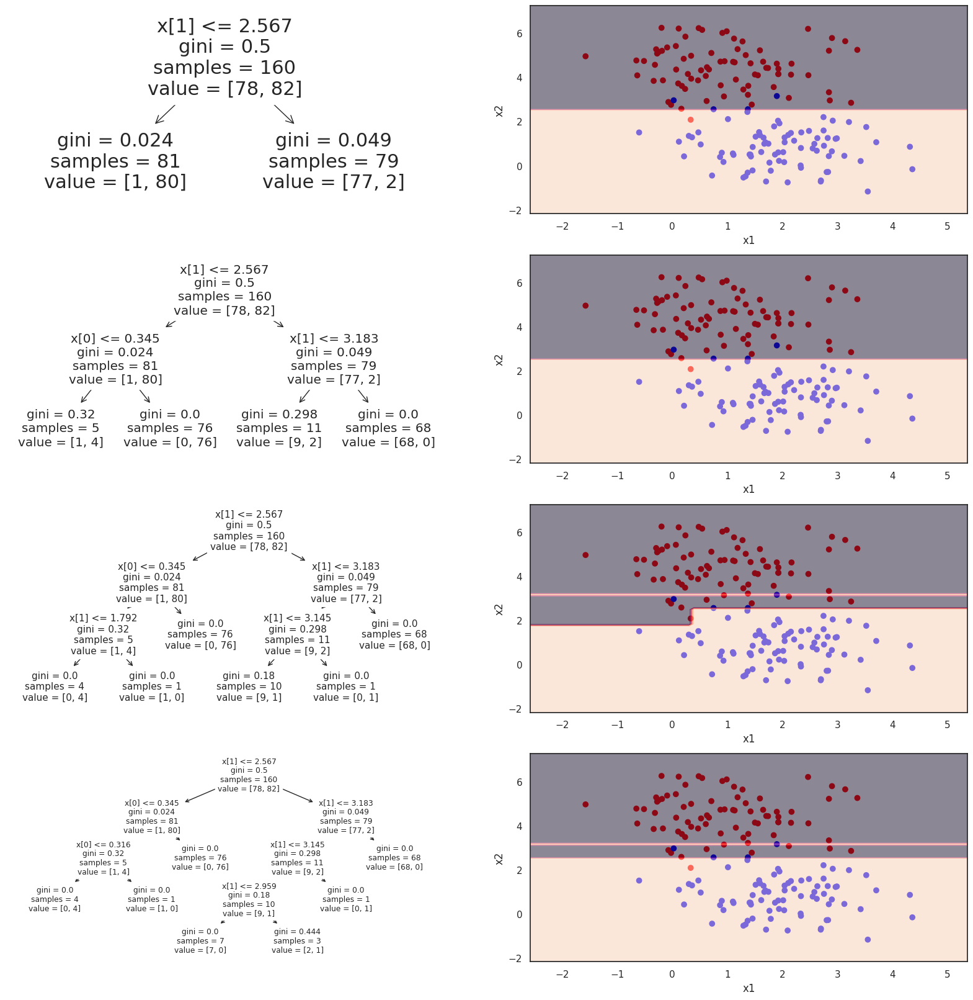

In [332]:
plot_DT_progress(blobX_train,blobY_train,4)

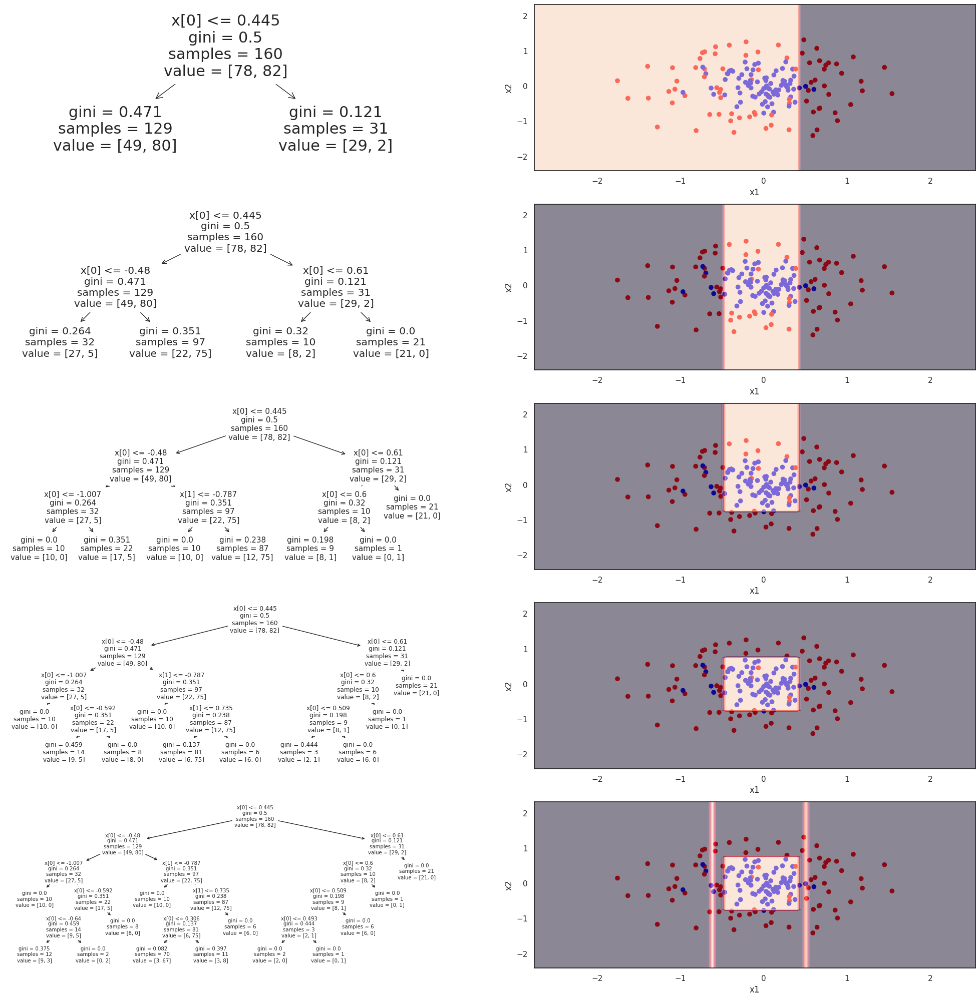

In [333]:
plot_DT_progress(circleX_train,circleY_train,5)

# Logistic regression vs Decision tree classifier

In [334]:
# plot the decision boundary of the model in 2d data
def plot_decision_boundary(x,y,model,ax):
  '''
  x: features
  y: class
  model: the trained model for which the decision boundary has to be plotted
  ax: matplotlib axis
  title: title of the plot
  '''
  ax.scatter(x[:,0],x[:,1],c=y, cmap=ListedColormap(["#FF0000", "#0000FF"]))
  db = DecisionBoundaryDisplay.from_estimator(model,x,xlabel='x1',ylabel='x2',alpha=0.5,ax=ax,response_method="predict")

In [335]:
# Training the logistic regression model and decision tree model on different datasets
LGmodel1 = LogisticRegression().fit(blobX_train,blobY_train)
LGmodel2 = LogisticRegression().fit(circleX_train,circleY_train)
LGmodel3 = LogisticRegression().fit(moonX_train,moonY_train)

DTmodel1 = DecisionTreeClassifier().fit(blobX_train,blobY_train)
DTmodel2 = DecisionTreeClassifier().fit(circleX_train,circleY_train)
DTmodel3 = DecisionTreeClassifier().fit(moonX_train,moonY_train)

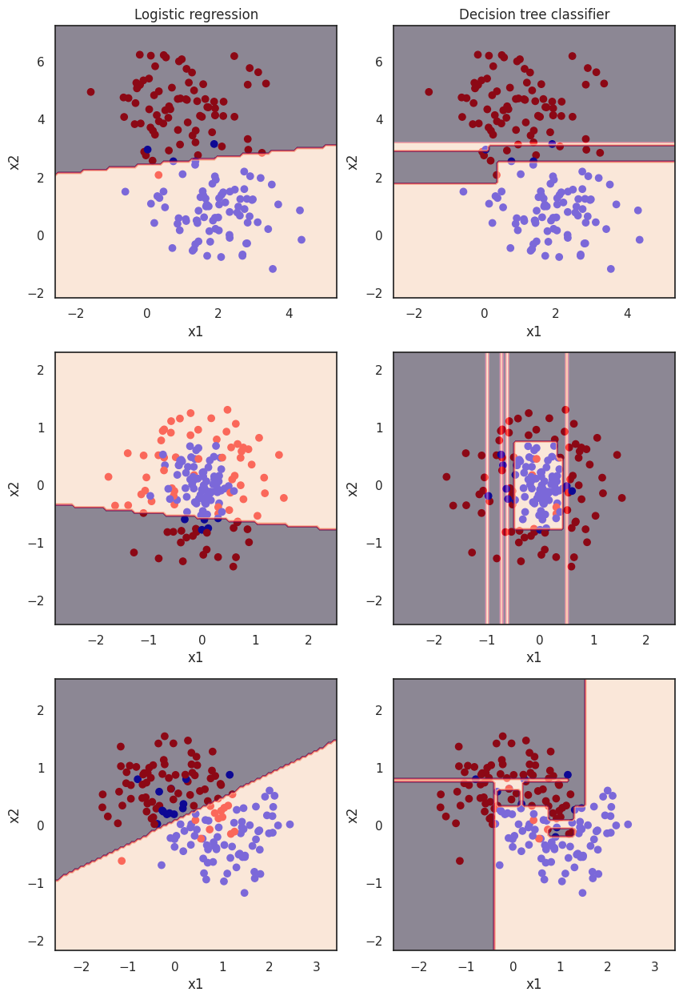

In [336]:
fig,ax = plt.subplots(3,2,figsize=(10,15))
ax=ax.flatten()
plot_decision_boundary(blobX_train,blobY_train,LGmodel1,ax[0])
plot_decision_boundary(blobX_train,blobY_train,DTmodel1,ax[1])
plot_decision_boundary(circleX_train,circleY_train,LGmodel2,ax[2])
plot_decision_boundary(circleX_train,circleY_train,DTmodel2,ax[3])
plot_decision_boundary(moonX_train,moonY_train,LGmodel3,ax[4])
plot_decision_boundary(moonX_train,moonY_train,DTmodel3,ax[5])
ax[0].set_title('Logistic regression')
ax[1].set_title('Decision tree classifier');

![DT_arch.jpeg](https://drive.google.com/uc?export=view&id=1UVJScDlYZhzX0suxof6sLMv4PM6KUOuY)

![stop_cri.jpeg](https://drive.google.com/uc?export=view&id=1kSPzo2XchoONeqAMXlypozrzvLT4JS88)


# Decision Trees: A high variance model


In [337]:
# cross validation to get the optimal hyperparameters
Dtree = DecisionTreeClassifier()
param_choice = {
    "max_leaf_nodes": np.linspace(10,50,30).astype(int),
    "max_depth": list(range(3,9))
}
gr_search_cv = GridSearchCV(Dtree, param_choice,n_jobs=-1, cv=5)

In [338]:
# blob dataset
gr_search_cv.fit(blobX_train, blobY_train)
print(gr_search_cv.best_estimator_)
hypertuned_tree_blob = gr_search_cv.best_estimator_

# normal tree
N_tree_blob = DecisionTreeClassifier().fit(blobX_train,blobY_train)
# hypertuned tree vs normal tree
print('In train dataset:')
print('Hypertuned tree score:',accuracy_score(hypertuned_tree_blob.predict(blobX_train),blobY_train))
print('Normal tree score:',accuracy_score(N_tree_blob.predict(blobX_train),blobY_train))

print('In test dataset:')
print('Hypertuned tree score:',accuracy_score(hypertuned_tree_blob.predict(blobX_test),blobY_test))
print('Normal tree score:',accuracy_score(N_tree_blob.predict(blobX_test),blobY_test))

DecisionTreeClassifier(max_depth=4, max_leaf_nodes=10)
In train dataset:
Hypertuned tree score: 0.99375
Normal tree score: 1.0
In test dataset:
Hypertuned tree score: 1.0
Normal tree score: 0.975


In [339]:
# circle dataset
gr_search_cv.fit(circleX_train, circleY_train)
print(gr_search_cv.best_estimator_)
hypertuned_tree_circle = gr_search_cv.best_estimator_

# normal tree
N_tree_circle = DecisionTreeClassifier().fit(circleX_train,circleY_train)
# hypertuned tree vs normal tree
print('In train dataset:')
print('Hypertuned tree score:',accuracy_score(hypertuned_tree_circle.predict(circleX_train),circleY_train))
print('Normal tree score:',accuracy_score(N_tree_circle.predict(circleX_train),circleY_train))

print('In test dataset:')
print('Hypertuned tree score:',accuracy_score(hypertuned_tree_circle.predict(circleX_test),circleY_test))
print('Normal tree score:',accuracy_score(N_tree_circle.predict(circleX_test),circleY_test))

DecisionTreeClassifier(max_depth=5, max_leaf_nodes=10)
In train dataset:
Hypertuned tree score: 0.93125
Normal tree score: 1.0
In test dataset:
Hypertuned tree score: 0.85
Normal tree score: 0.875


In [340]:
# moon dataset
gr_search_cv.fit(moonX_train, moonY_train)
print(gr_search_cv.best_estimator_)
hypertuned_tree_moon = gr_search_cv.best_estimator_

# normal tree
N_tree_moon = DecisionTreeClassifier().fit(moonX_train,moonY_train)
# hypertuned tree vs normal tree
print('In train dataset:')
print('Hypertuned tree score:',accuracy_score(hypertuned_tree_moon.predict(moonX_train),moonY_train))
print('Normal tree score:',accuracy_score(N_tree_moon.predict(moonX_train),moonY_train))

print('In test dataset:')
print('Hypertuned tree score:',accuracy_score(hypertuned_tree_moon.predict(moonX_test),moonY_test))
print('Normal tree score:',accuracy_score(N_tree_moon.predict(moonX_test),moonY_test))

DecisionTreeClassifier(max_depth=7, max_leaf_nodes=12)
In train dataset:
Hypertuned tree score: 0.9625
Normal tree score: 1.0
In test dataset:
Hypertuned tree score: 0.875
Normal tree score: 0.85


# Bagging classifier

![bag.jpeg](https://drive.google.com/uc?export=view&id=1jeCcMvWNAKkoxQ2VQh1dVk9rOnS3XQC9)


In [341]:
# plot the decision boundary of the model in 2d data
def plot_decision_boundary_ensemble(x,y,model,ax):
  '''
  x: features
  y: class
  model: the trained model for which the decision boundary has to be plotted
  ax: matplotlib axis
  title: title of the plot
  '''
  for i in model.estimators_:
    db = DecisionBoundaryDisplay.from_estimator(i,x,alpha=0.05,ax=ax,response_method="predict")
  ax.scatter(x[:,0],x[:,1],c=y, cmap=ListedColormap(["#FF0000", "#0000FF"]),alpha=0.7)

In [342]:
# Blob dataset and use 100 estimators
n_estimators = 100
basemodel=DecisionTreeClassifier()
m=BaggingClassifier(estimator=basemodel, n_estimators=n_estimators)
param_choice = {"estimator__max_depth": list(range(3,9))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(blobX_train,blobY_train)
bagging_blob = gr_search_cv.best_estimator_

In [343]:
# Circle dataset and use 100 estimators
n_estimators = 100
basemodel=DecisionTreeClassifier()
m=BaggingClassifier(estimator=basemodel, n_estimators=n_estimators)
param_choice = {"estimator__max_depth": list(range(3,9))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(circleX_train,circleY_train)
bagging_circle = gr_search_cv.best_estimator_

In [344]:
# Moon dataset and use 100 estimators
n_estimators = 100
basemodel=DecisionTreeClassifier()
m=BaggingClassifier(estimator=basemodel, n_estimators=n_estimators)
param_choice = {"estimator__max_depth": list(range(3,9))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(moonX_train,moonY_train)
bagging_moon = gr_search_cv.best_estimator_

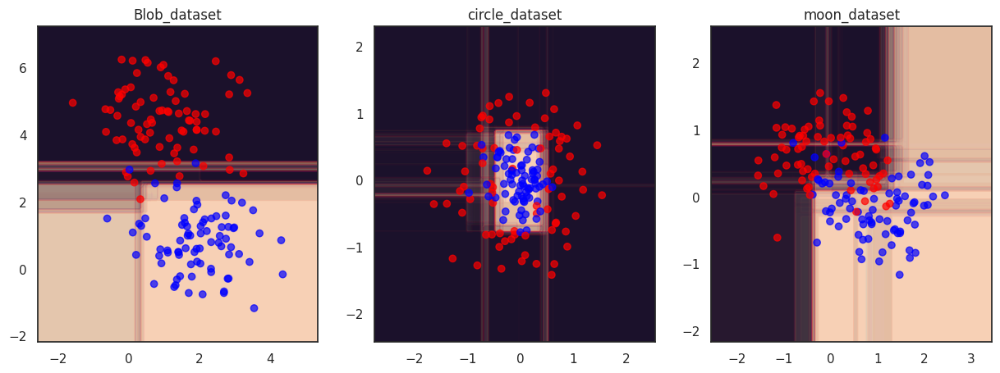

In [345]:
fig,ax = plt.subplots(1,3,figsize=(15,5))
plot_decision_boundary_ensemble(blobX_train, blobY_train,bagging_blob,ax[0])
ax[0].set_title('Blob_dataset')

plot_decision_boundary_ensemble(circleX_train, circleY_train,bagging_circle,ax[1])
ax[1].set_title('circle_dataset')

plot_decision_boundary_ensemble(moonX_train, moonY_train,bagging_moon,ax[2])
ax[2].set_title('moon_dataset');

# Random forest classifier


![rf.jpeg](https://drive.google.com/uc?export=view&id=1bshha2H4X8a3hIusPbrtebTg8LUH7Ypw)


In [346]:
# Blob dataset and use 100 estimators
n_estimators = 100
m=RandomForestClassifier(n_estimators=n_estimators)
param_choice = {"max_depth": list(range(3,9))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(blobX_train,blobY_train)
rf_blob = gr_search_cv.best_estimator_

In [347]:
# Circle dataset and use 100 estimators
n_estimators = 100
m=RandomForestClassifier(n_estimators=n_estimators)
param_choice = {"max_depth": list(range(3,9))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(circleX_train,circleY_train)
rf_circle = gr_search_cv.best_estimator_

In [348]:
# Moon dataset and use 100 estimators
n_estimators = 100
m=RandomForestClassifier(n_estimators=n_estimators)
param_choice = {"max_depth": list(range(3,9))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(moonX_train,moonY_train)
rf_moon = gr_search_cv.best_estimator_

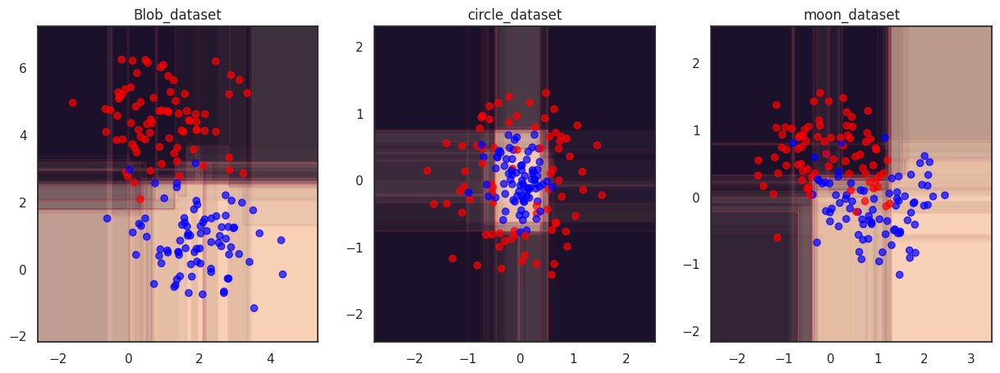

In [349]:
fig,ax = plt.subplots(1,3,figsize=(15,5))
plot_decision_boundary_ensemble(blobX_train, blobY_train,rf_blob,ax[0])
ax[0].set_title('Blob_dataset')

plot_decision_boundary_ensemble(circleX_train, circleY_train,rf_circle,ax[1])
ax[1].set_title('circle_dataset')

plot_decision_boundary_ensemble(moonX_train, moonY_train,rf_moon,ax[2])
ax[2].set_title('moon_dataset');

# Gradient boosting classifier

In [350]:
# Blob dataset and use 100 estimators
n_estimators = 100
m=GradientBoostingClassifier(n_estimators=n_estimators,max_depth=1)
param_choice = {"learning_rate": np.linspace(0.01,0.5,10)}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(blobX_train,blobY_train)
gb_blob = gr_search_cv.best_estimator_

In [351]:
# Circle dataset and use 100 estimators
n_estimators = 100
m=GradientBoostingClassifier(n_estimators=n_estimators,max_depth=1)
param_choice = {"learning_rate": np.linspace(0.01,0.5,10)}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(circleX_train,circleY_train)
gb_circle = gr_search_cv.best_estimator_

In [352]:
# Moon dataset and use 100 estimators
n_estimators = 100
m=GradientBoostingClassifier(n_estimators=n_estimators,max_depth=1)
param_choice = {"learning_rate": np.linspace(0.01,0.5,10)}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(moonX_train,moonY_train)
gb_moon = gr_search_cv.best_estimator_

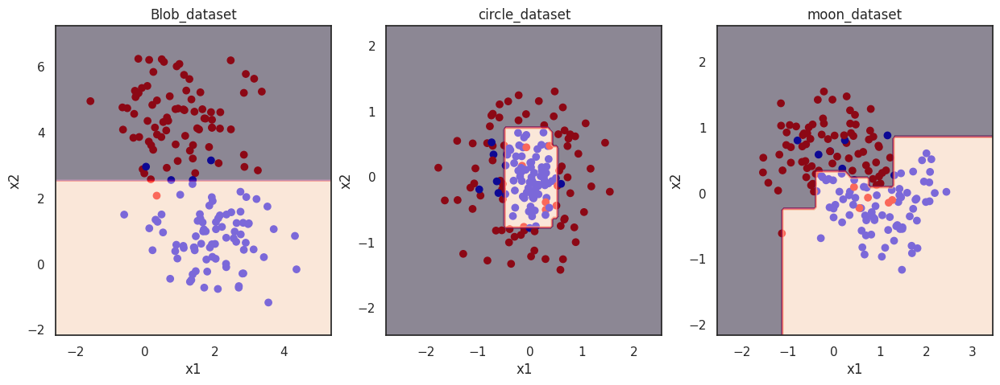

In [353]:
fig,ax = plt.subplots(1,3,figsize=(15,5))
plot_decision_boundary(blobX_train, blobY_train,gb_blob,ax[0])
ax[0].set_title('Blob_dataset')

plot_decision_boundary(circleX_train, circleY_train,gb_circle,ax[1])
ax[1].set_title('circle_dataset')

plot_decision_boundary(moonX_train, moonY_train,gb_moon,ax[2])
ax[2].set_title('moon_dataset');

# Comparing model's performance

In [354]:
# utility function to plot the accuracies of the models
def plot_acc(acc_train,acc_test,models):
  '''
  acc_train: Training accuracies in the order of models
  acc_test:  Testing accuracies in the order of models
  models: Names of the models used
  '''
  n_bars = len(acc_train)
  x_1 = np.arange(1,(n_bars)*2,2)
  x_2 = np.arange(1,(n_bars)*2,2)+0.6
  plt.bar(x_1,acc_train,color='b',label='Train',width=0.6)
  plt.bar(x_2,acc_test,color='r',label='Test',width=0.6)
  plt.xticks(ticks=x_1+0.3,labels=models)
  plt.xlabel('Models')
  plt.ylabel('Accuracies')
  plt.legend();

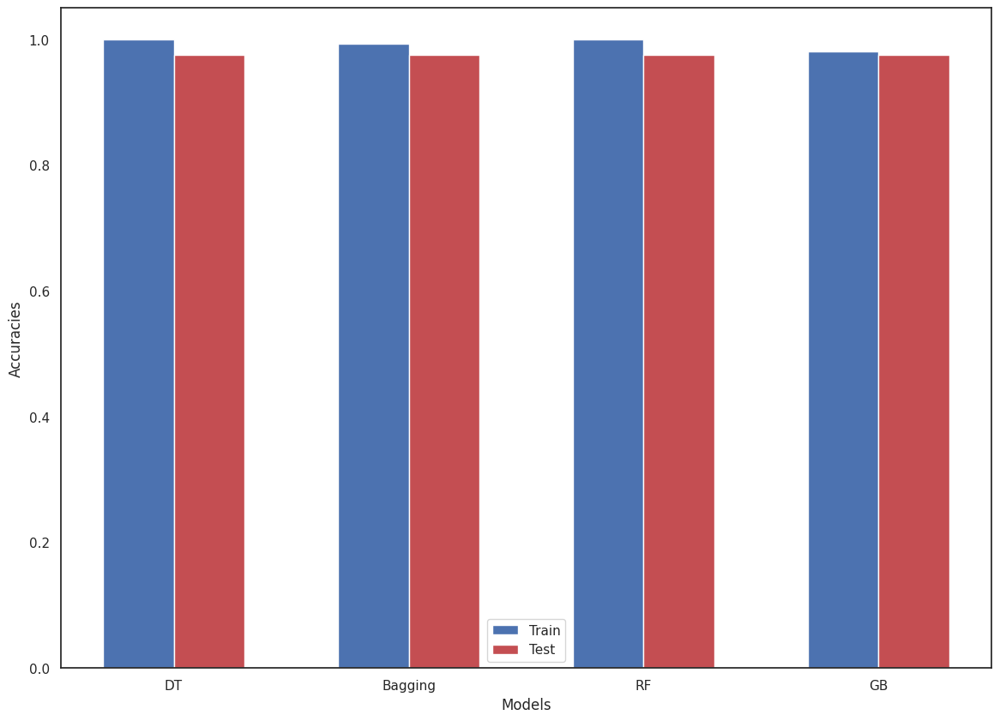

In [355]:
# blob dataset
data = [blobX_test,blobY_test,blobX_train,blobY_train]
models = [N_tree_blob,bagging_blob,rf_blob,gb_blob]
model_names=['DT','Bagging','RF','GB']
train_acc,test_acc=[],[]
for m in models:
  acc = accuracy_score(data[1],m.predict(data[0]))
  test_acc.append(acc)
  acc = accuracy_score(data[3],m.predict(data[2]))
  train_acc.append(acc)
plot_acc(train_acc,test_acc,model_names);

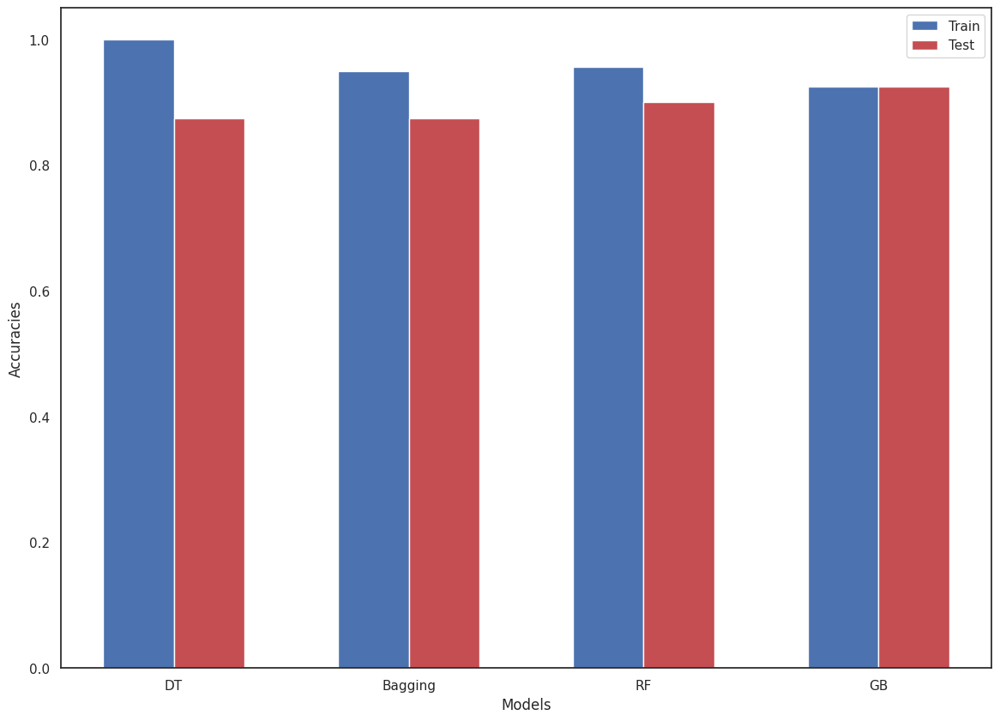

In [356]:
# circle dataset
data = [circleX_test,circleY_test,circleX_train,circleY_train]
models = [N_tree_circle,bagging_circle,rf_circle,gb_circle]
model_names=['DT','Bagging','RF','GB']
train_acc,test_acc=[],[]
for m in models:
  acc = accuracy_score(data[1],m.predict(data[0]))
  test_acc.append(acc)
  acc = accuracy_score(data[3],m.predict(data[2]))
  train_acc.append(acc)
plot_acc(train_acc,test_acc,model_names);

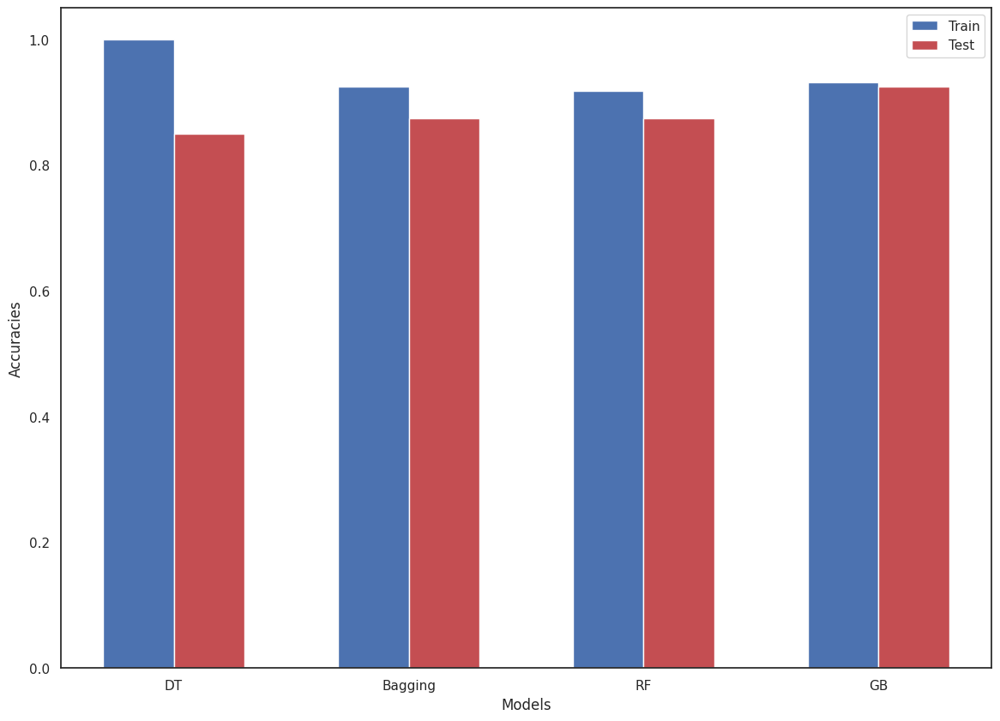

In [357]:
# moon dataset
data = [moonX_test,moonY_test,moonX_train,moonY_train]
models = [N_tree_moon,bagging_moon,rf_moon,gb_moon]
model_names=['DT','Bagging','RF','GB']
train_acc,test_acc=[],[]
for m in models:
  acc = accuracy_score(data[1],m.predict(data[0]))
  test_acc.append(acc)
  acc = accuracy_score(data[3],m.predict(data[2]))
  train_acc.append(acc)
plot_acc(train_acc,test_acc,model_names);

# Comparison of performance of tree based algorithms for mobile price prediction

data source: https://www.kaggle.com/code/vikramb/mobile-price-prediction

In [358]:
mobile_df = pd.read_csv('Mobile_price_prediction.csv')
mobile_df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [359]:
# checking for nan values
print(mobile_df.isna().sum())

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


In [360]:
X = mobile_df.drop(['price_range'],axis=1)
Y = mobile_df['price_range']
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=0)

In [361]:
# Decision tree classifier
m=DecisionTreeClassifier()
param_choice = {"max_depth": list(range(6,12))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(X_train,Y_train)
DT_mobile = gr_search_cv.best_estimator_

In [362]:
# Bagging classifier
n_estimators = 100
basemodel=DecisionTreeClassifier()
m=BaggingClassifier(estimator=basemodel, n_estimators=n_estimators)
param_choice = {"estimator__max_depth": list(range(6,12))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(X_train,Y_train)
bagging_mobile = gr_search_cv.best_estimator_

In [363]:
# Random forest classifier
n_estimators = 100
m=RandomForestClassifier(n_estimators=n_estimators)
param_choice = {"max_depth": list(range(6,12))}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(X_train,Y_train)
rf_mobile = gr_search_cv.best_estimator_

In [364]:
# Gradient descent classifier
n_estimators = 100
m=GradientBoostingClassifier(n_estimators=n_estimators,max_depth=1)
param_choice = {"learning_rate": np.linspace(0.01,0.8,15)}
gr_search_cv = GridSearchCV(m, param_choice,n_jobs=-1, cv=5) # hyper-parameter tuning
gr_search_cv.fit(X_train,Y_train)
gb_mobile = gr_search_cv.best_estimator_

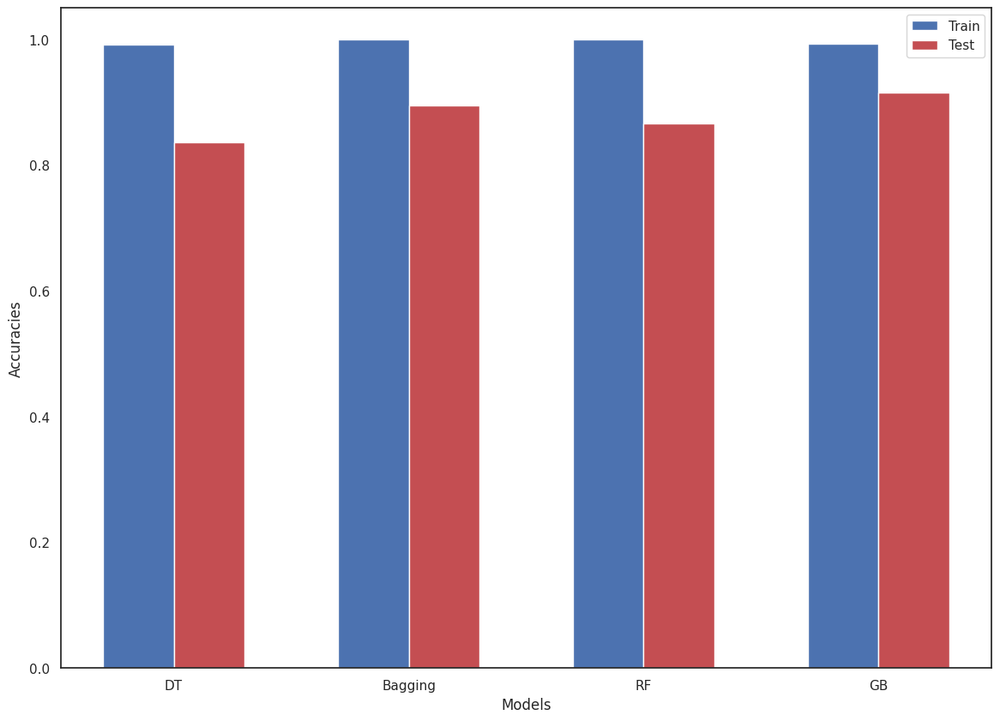

In [365]:
# Model performance comparison
data = [X_test,Y_test,X_train,Y_train]
models = [DT_mobile,bagging_mobile,rf_mobile,gb_mobile]
model_names=['DT','Bagging','RF','GB']
train_acc,test_acc=[],[]
for m in models:
  acc = accuracy_score(data[1],m.predict(data[0]))
  test_acc.append(acc)
  acc = accuracy_score(data[3],m.predict(data[2]))
  train_acc.append(acc)
plot_acc(train_acc,test_acc,model_names);

In [366]:
def plot_feature_importances(df,model):
    '''
    df: dataframe of the features/independent variables
    model: Trained tree model
    '''
    n_features = df.shape[1]
    plt.barh(np.arange(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), df.columns)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)

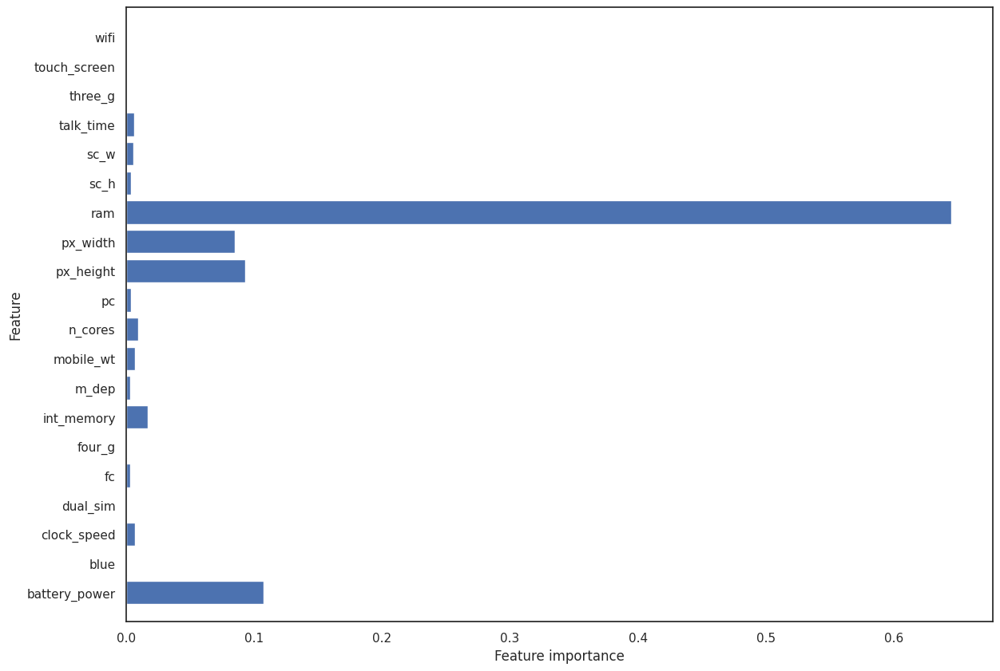

In [367]:
# Decision tree classifier
plot_feature_importances(X_train,DT_mobile)

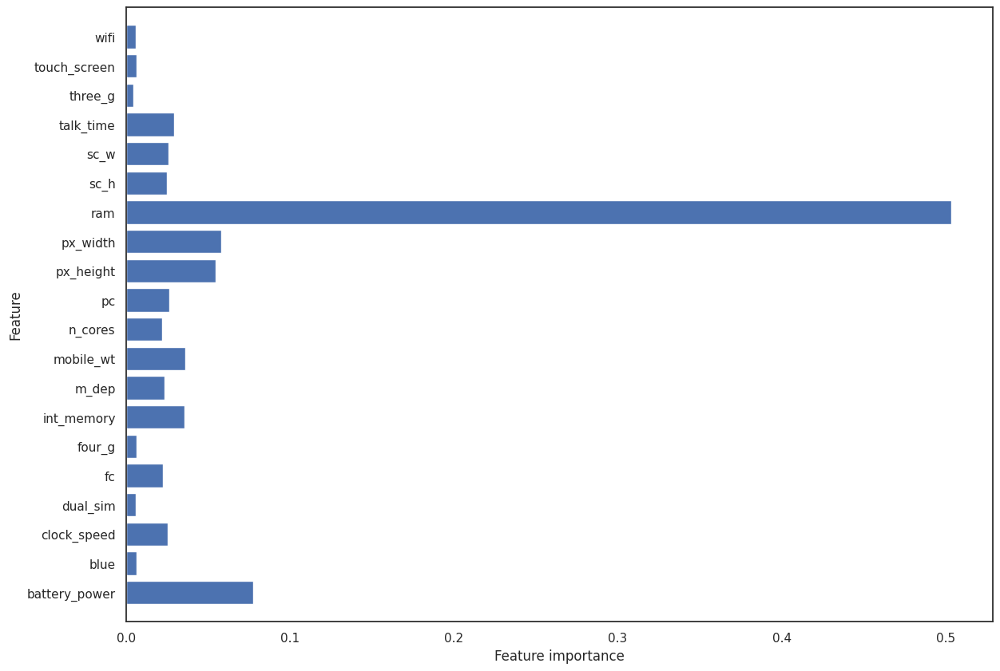

In [368]:
# Random forest classifier
plot_feature_importances(X_train,rf_mobile)

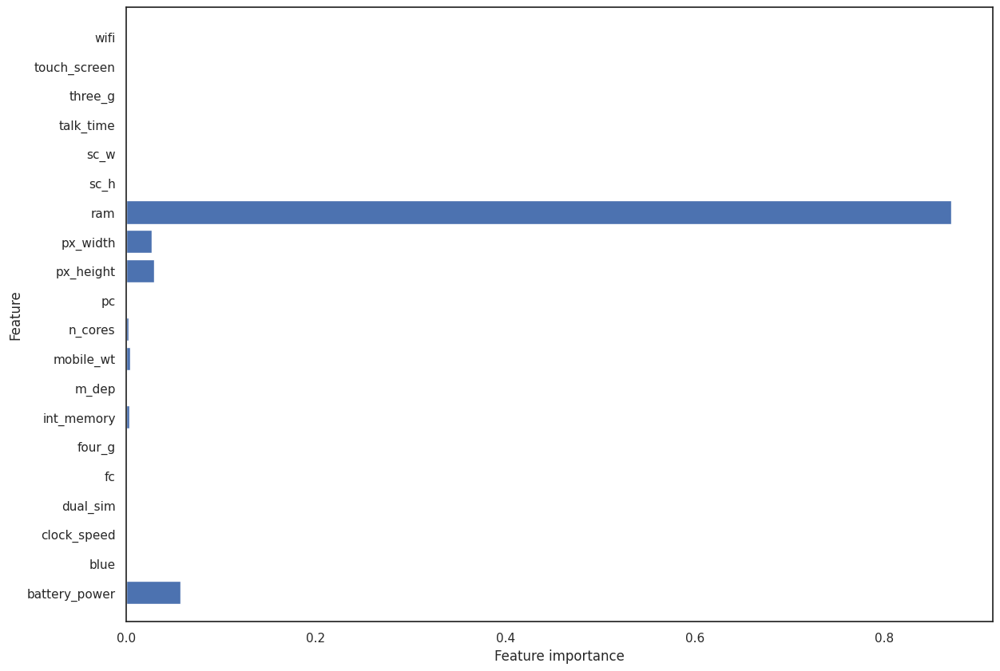

In [369]:
# Gradient boositng classifier
plot_feature_importances(X_train,gb_mobile)

# Welcome!

In this session, we will learn how to implement some commonly used clustering techniques. <br>
The following topics will be covered:
<ul>
    <li> k-means clustering </li>
    <li> Hierarchical Clustering </li>
    <li> Spectral Clustering </li>
    <li> Metrics to measure performance </li>

</ul>
   

In [370]:
# Importing packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

sns.set(style='white', context='notebook', rc={'figure.figsize':(8,8)})

# K-means clustering

The goal of the k-means algorithm is to separate the given $N$ samples $X$ into $K$ clusters, $C$. It achieves this by measuring the dissimilarity between clusters, also known as intertia:

<center>$\Large\sum_{i=0}^{n}\min_{\mu_j \in C}(||x_i - \mu_j||^2)$</center>

<Axes: title={'center': 'Moons'}>

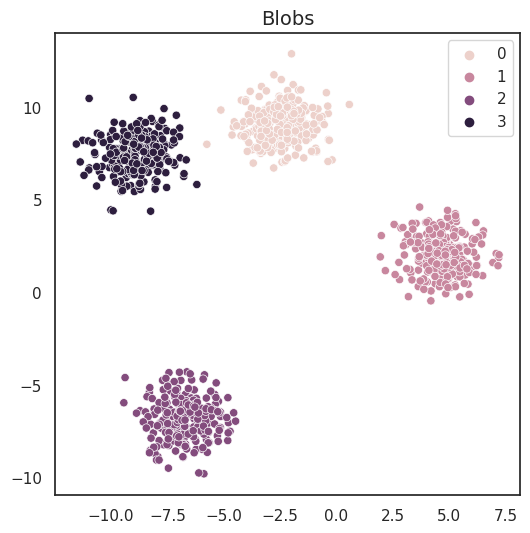

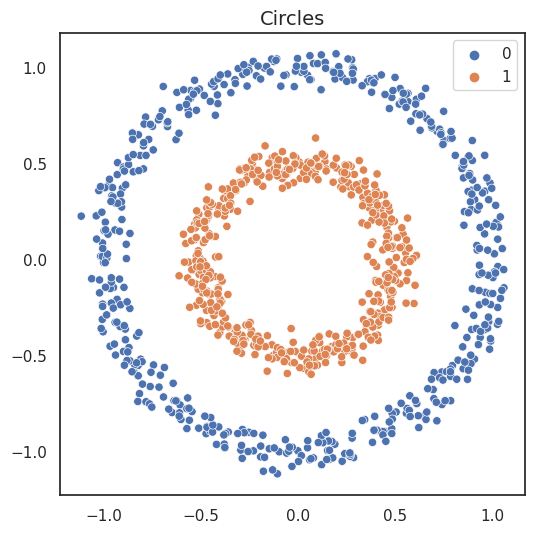

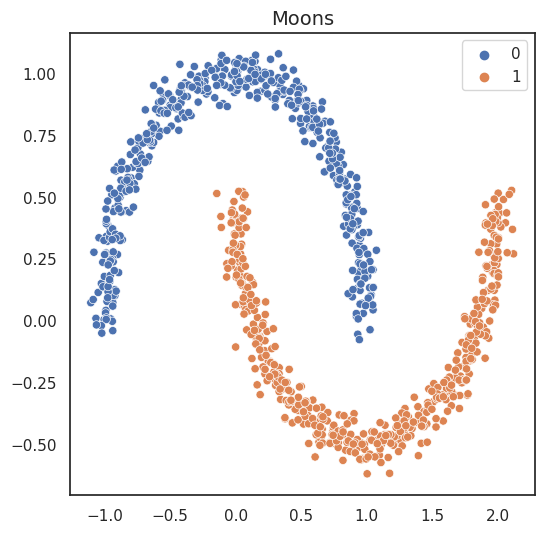

In [371]:
# Making data
from sklearn.datasets import make_blobs, make_circles, make_moons

seed = 42

blob_x, blob_y = make_blobs(n_samples=1000, centers=4, random_state=seed)
circle_x, circle_y = make_circles(n_samples=1000, noise=0.05, factor=0.5, random_state=seed)
moon_x, moon_y = make_moons(n_samples=1000, noise=0.05, random_state=seed)

plt.figure(figsize=(6,6))
plt.title("Blobs", size=14)
sns.scatterplot(x=blob_x[:,0], y=blob_x[:,1], hue=blob_y)

plt.figure(figsize=(6,6))
plt.title("Circles", size=14)
sns.scatterplot(x=circle_x[:,0], y=circle_x[:,1],  hue=circle_y)

plt.figure(figsize=(6,6))
plt.title("Moons", size=14)
sns.scatterplot(x=moon_x[:,0], y=moon_x[:,1], hue=moon_y)

In [372]:
from sklearn.cluster import KMeans

kmeans = KMeans(
    n_clusters=4,
    random_state = seed
)

blob_pred = kmeans.fit_predict(blob_x, blob_y)
circle_pred = kmeans.fit_predict(circle_x, circle_y)
moon_pred = kmeans.fit_predict(moon_x, moon_y)

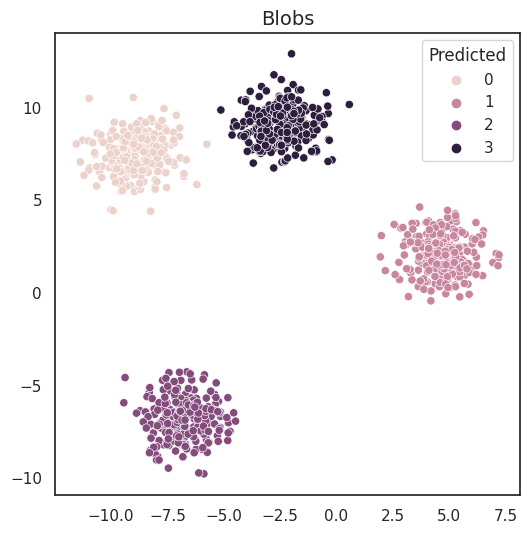

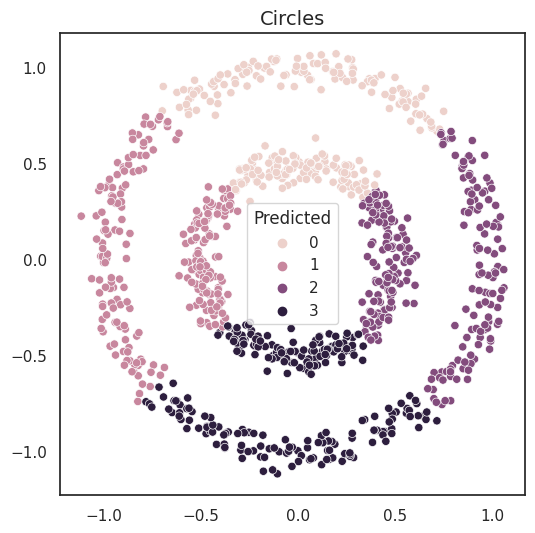

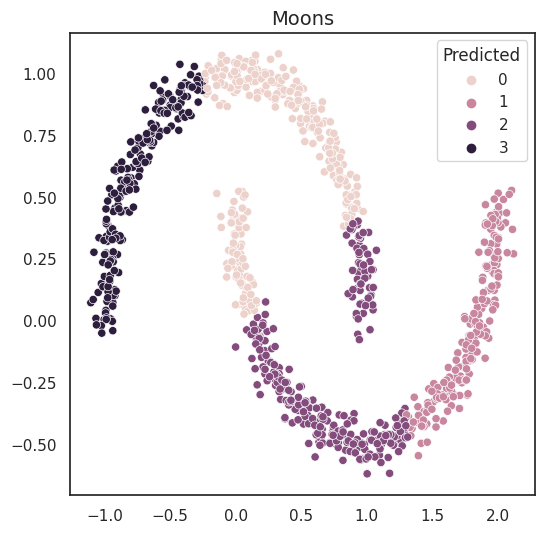

In [373]:
plt.figure(figsize=(6,6))
plt.title("Blobs", size=14)
sns.scatterplot(x=blob_x[:,0], y=blob_x[:,1], hue=blob_pred)
plt.legend(title='Predicted')

plt.figure(figsize=(6,6))
plt.title("Circles", size=14)
sns.scatterplot(x=circle_x[:,0], y=circle_x[:,1],  hue=circle_pred)
plt.legend(title='Predicted')

plt.figure(figsize=(6,6))
plt.title("Moons", size=14)
sns.scatterplot(x=moon_x[:,0], y=moon_x[:,1], hue=moon_pred)
plt.legend(title='Predicted')

# Scoring a clustering

There are two major ways we can score a clustering:

<ol>
    <li> If we have true values, we check for the concurrence between the predicted clusters and the true clusters. </li>
    <li> In the absence of of true values, we must check for the <i>consistency</i> of the clusters </li>
</ol>
<br>
<u><b> Rand score: </b></u> <br>
Rand index, essentially, computes the similarity between the predicted clusters and the true clusters. It ranges between 0 and 1. It is computed as: <br> <br>

<center> $ \text{RI} = \Large\frac{a + b}{C_2^{n_{samples}}}$ </center>

<ul>
    <li><b>a</b>: the number of pairs of elements that are in the same set in the true cluster and in the same set in predicted cluster.</li>
    <li><b>b</b>: the number of pairs of elements that are in different sets in true cluster and in different sets in predicted cluster. </li>
</ul>

<u><b> Silhouette score:</b></u><br>
Silhouette score explains how well the clusters are separated from one another. It is defined as: <br><br>

<center> $\text{Silhouette score} = \Large \frac{b - a}{max(a, b)}$ </center>

<ul>
    <li><b>a</b>: The mean distance between a sample and all other points in the same class.</li>
    <li><b>b</b>: The mean distance between a sample and all other points in the <i>next nearest cluster</i>. </li>
</ul>
The score is bounded between -1 for incorrect clustering and +1 for highly dense clustering. Scores around zero indicate overlapping clusters.

In [374]:
# Scoring a clustering

from sklearn.metrics import rand_score, silhouette_score

print("Rand_score")
print("Blobs: {:.4f}".format(rand_score(blob_y, blob_pred)))
print("Circles: {:.4f}".format(rand_score(circle_y, circle_pred)))
print("Moons: {:.4f}".format(rand_score(moon_y, moon_pred)))
print("\n")

print("Silhouette_score")
print("Blobs: {:.4f}".format(silhouette_score(blob_x, blob_pred)))
print("Circles: {:.4f}".format(silhouette_score(circle_x, circle_pred)))
print("Moons: {:.4f}".format(silhouette_score(moon_x, moon_pred)))

Rand_score
Blobs: 0.9990
Circles: 0.4996
Moons: 0.6278


Silhouette_score
Blobs: 0.7916
Circles: 0.3814
Moons: 0.4600


# Hierarchical Clustering

The basic idea behind hierarchical clustering is to build nested clusters of samples. For example, take the following cities: <b>Chennai, Trichy, Madurai, Bengaluru, Mysuru</b>. <br>

Two different methods are possible: 
<ul>
    <li> Agglomerative Clustering </li>
    <li> Divisive Clustering </li>
</ul>

The criteria by which we decide on whether or not we merge clusters: <b>Linkage</b>. Linkage can be understood as a distance metric between two <i>clusters</i>. In the Scikit-learn implementation, 4 types of linkages are available: 

<ul>
    <li><b>Maximum</b> or complete linkage minimizes the maximum distance between observations of pairs of clusters.</li>
    <li><b>Average</b> linkage minimizes the average of the distances between all observations of pairs of clusters.</li>
    <li><b>Single</b> linkage minimizes the distance between the closest observations of pairs of clusters.</li>    
    <li><b>Ward</b> linkage minimizes the sum of squared differences within all clusters. </li>
</ul>

In [375]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram

In [376]:
clust = AgglomerativeClustering(
    n_clusters=None,               # Needs to be None if distance_threshold is used
    metric = 'euclidean',
    linkage = 'single',
    distance_threshold = 0.1
)

blob_pred = clust.fit_predict(blob_x, blob_y)
circle_pred = clust.fit_predict(circle_x, circle_y)
moon_pred = clust.fit_predict(moon_x, moon_y)

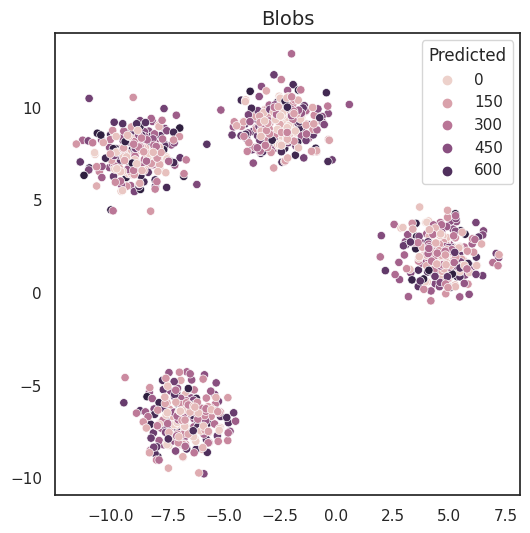

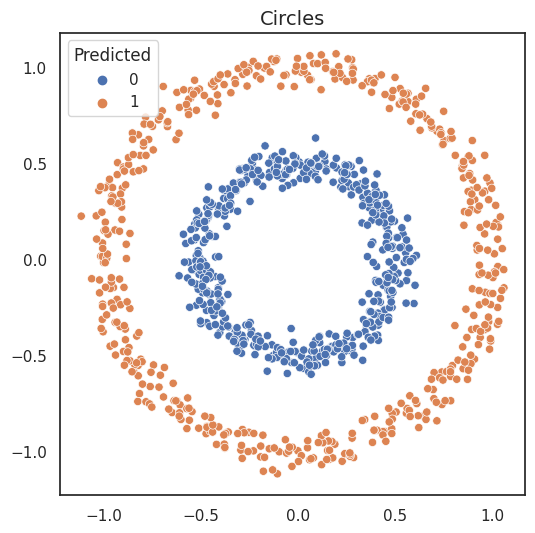

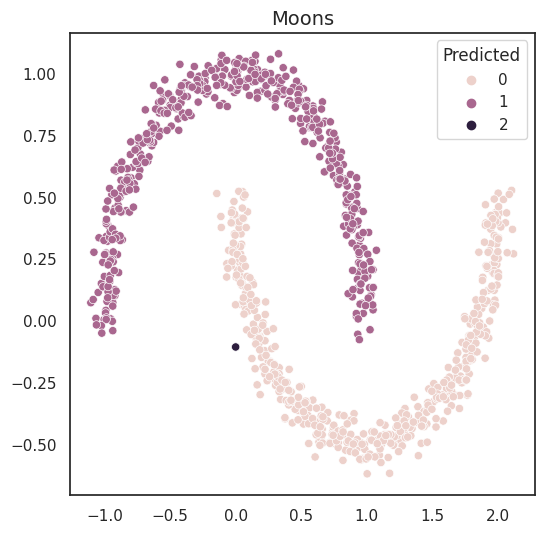

In [377]:
plt.figure(figsize=(6,6))
plt.title("Blobs", size=14)
sns.scatterplot(x=blob_x[:,0], y=blob_x[:,1], hue=blob_pred)
plt.legend(title='Predicted')

plt.figure(figsize=(6,6))
plt.title("Circles", size=14)
sns.scatterplot(x=circle_x[:,0], y=circle_x[:,1],  hue=circle_pred)
plt.legend(title='Predicted')

plt.figure(figsize=(6,6))
plt.title("Moons", size=14)
sns.scatterplot(x=moon_x[:,0], y=moon_x[:,1], hue=moon_pred)
plt.legend(title='Predicted')

In [378]:
print("Rand_score")
print("Blobs: {:.4f}".format(rand_score(blob_y, blob_pred)))
print("Circles: {:.4f}".format(rand_score(circle_y, circle_pred)))
print("Moons: {:.4f}".format(rand_score(moon_y, moon_pred)))
print("\n")

print("Silhouette_score")
print("Blobs: {:.4f}".format(silhouette_score(blob_x, blob_pred)))
print("Circles: {:.4f}".format(silhouette_score(circle_x, circle_pred)))
print("Moons: {:.4f}".format(silhouette_score(moon_x, moon_pred)))

Rand_score
Blobs: 0.7519
Circles: 1.0000
Moons: 0.9990


Silhouette_score
Blobs: 0.2258
Circles: 0.1125
Moons: 0.0550


[[1.00000000e+01 2.67000000e+02 3.52609495e-03 2.00000000e+00]
 [1.76000000e+02 6.15000000e+02 8.50979170e-03 2.00000000e+00]
 [1.23000000e+02 1.39000000e+02 1.19506477e-02 2.00000000e+00]
 ...
 [1.99200000e+03 1.99500000e+03 6.70254005e+00 5.00000000e+02]
 [1.98800000e+03 1.99600000e+03 1.23720776e+01 7.50000000e+02]
 [1.99400000e+03 1.99700000e+03 1.51343552e+01 1.00000000e+03]]
CPU times: user 1.47 s, sys: 112 ms, total: 1.58 s
Wall time: 1.49 s


Text(0.5, 1.0, 'Dendrgoram of the Clustering - Blobs')

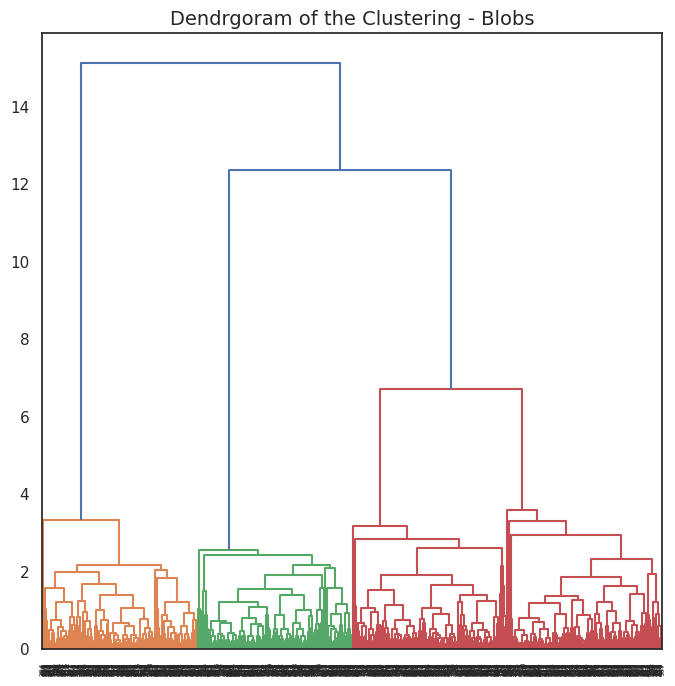

In [379]:
%%time
Z = linkage(
    y = blob_x,       # Input
    method='average', # Linkage
    metric='euclidean' 
)

print(Z)

fig, ax = plt.subplots()
R = dendrogram(Z, ax=ax);
ax.set_title("Dendrgoram of the Clustering - Blobs", size=14);

Text(0.5, 1.0, 'Dendrgoram of the Clustering - Moons')

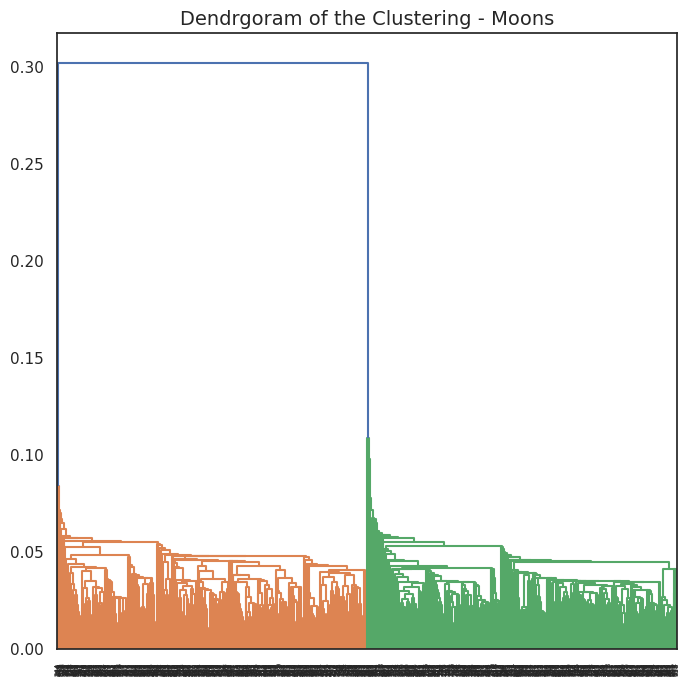

In [380]:
Z = linkage(
    y = moon_x,
    method='single',
    metric='euclidean'
)

fig, ax = plt.subplots()
R = dendrogram(Z, ax=ax);
ax.set_title("Dendrgoram of the Clustering - Moons", size=14)

# Spectral Clustering

Spectral clustering is based on the idea of representing the data as a graph and finding the connected components in the graph.

The graph laplacian: $L = D - A$ <br>
The graph laplacian has several interesting properties:
<ul>
    <li> The laplacian is positive semi-definite </li>
    <li> The number of connected components of the graph is equal to the the dimension of the null space of the laplacian </li>
    <li> In fact, each of the non zero eigenvalue corresponds to a connected component </li>
</ul>

Spectral Clustering require that we predefined number of clusters $k$. Based on this, we choose the first $k$ eigenvectors which will be used as input for a simpler clustering algorithm which will give us the final clusters.

Now, we need a way represent our data as a graph. Recollect: K-Neighbors Algorithm.

In [381]:


clust = SpectralClustering(
    n_clusters = 2,
    affinity='nearest_neighbors', # Method to create graph
    random_state = 42,
    n_neighbors=10
)

blob_pred = clust.fit_predict(blob_x, blob_y)
circle_pred = clust.fit_predict(circle_x, circle_y)
moon_pred = clust.fit_predict(moon_x, moon_y)

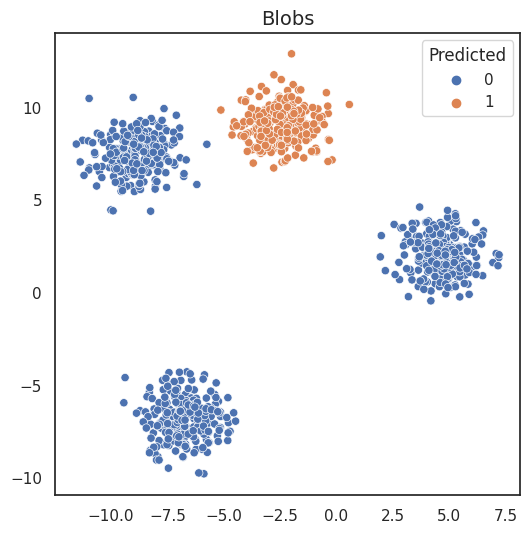

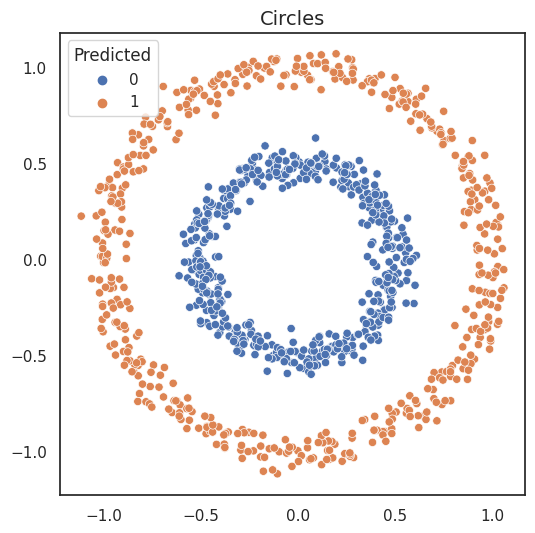

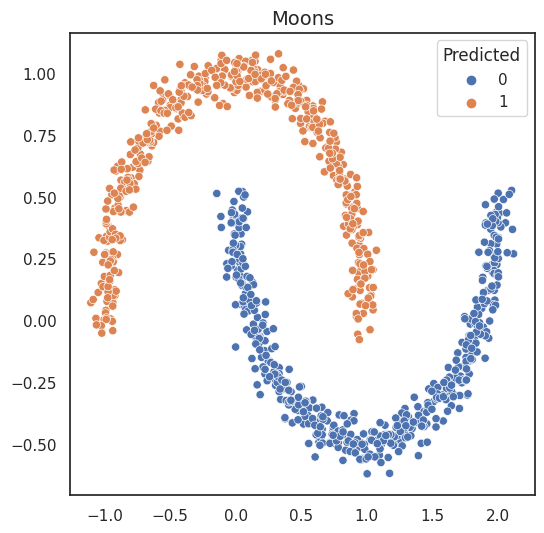

In [382]:
plt.figure(figsize=(6,6))
plt.title("Blobs", size=14)
sns.scatterplot(x=blob_x[:,0], y=blob_x[:,1], hue=blob_pred)
plt.legend(title='Predicted')

plt.figure(figsize=(6,6))
plt.title("Circles", size=14)
sns.scatterplot(x=circle_x[:,0], y=circle_x[:,1],  hue=circle_pred)
plt.legend(title='Predicted')

plt.figure(figsize=(6,6))
plt.title("Moons", size=14)
sns.scatterplot(x=moon_x[:,0], y=moon_x[:,1], hue=moon_pred)
plt.legend(title='Predicted')

In [383]:
print("Rand_score")
print("Blobs: {:.4f}".format(rand_score(blob_y, blob_pred)))
print("Circles: {:.4f}".format(rand_score(circle_y, circle_pred)))
print("Moons: {:.4f}".format(rand_score(moon_y, moon_pred)))
print("\n")

print("Silhouette_score")
print("Blobs: {:.4f}".format(silhouette_score(blob_x, blob_pred)))
print("Circles: {:.4f}".format(silhouette_score(circle_x, circle_pred)))
print("Moons: {:.4f}".format(silhouette_score(moon_x, moon_pred)))

Rand_score
Blobs: 0.6226
Circles: 1.0000
Moons: 1.0000


Silhouette_score
Blobs: 0.2118
Circles: 0.1125
Moons: 0.3344


# Support Vector Regression

![SVR%20%282%29.png](attachment:SVR%20%282%29.png)

In [384]:
def nonlinear(array):
    return (10*array[:,0]-np.exp(0.01*array[:,1]+np.log(1+array[:,2]**2)))/(array[:,3]**2+5)

In [385]:
n_samples = 200
n_features = 4

In [386]:
x = 5*np.random.rand(n_samples,n_features)

In [387]:
y = nonlinear(x)+np.random.randn(n_samples)


y=y.reshape(n_samples,1)

In [388]:
df = pd.DataFrame(data=np.hstack((x,y)),columns=['X1','X2','X3','X4','y'])

In [389]:
df.head()

,X1,X2,X3,X4,y
0,4.877274,1.886058,0.273763,3.626725,3.284721
1,0.843075,3.721387,0.889269,2.790215,-0.297265
2,4.136933,3.240730,0.371200,1.615895,5.549187
3,1.369147,2.197973,0.147168,4.415134,-1.189792
4,1.454887,2.308565,3.331664,3.982920,0.355408


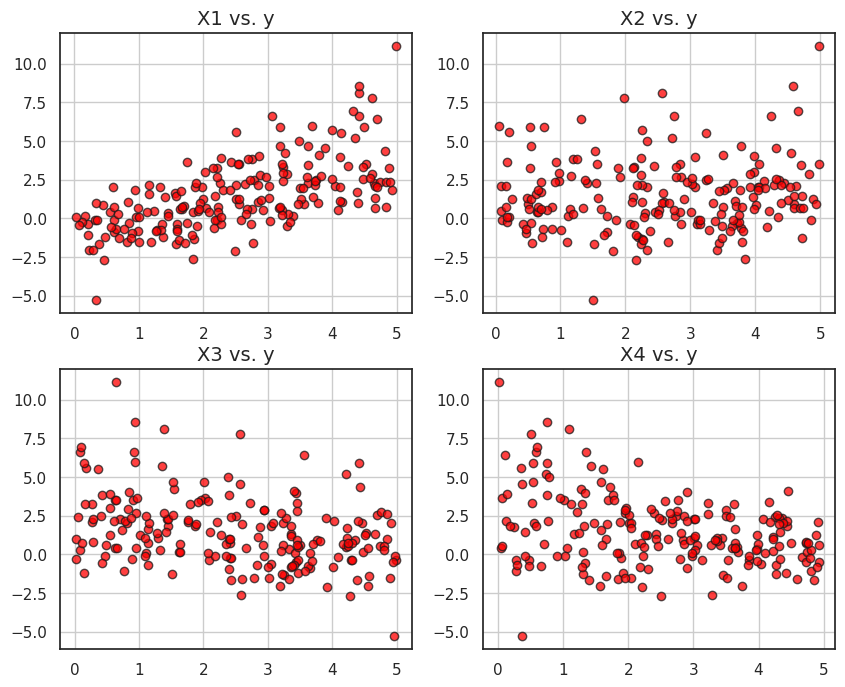

In [390]:
fig,ax = plt.subplots(2,2,figsize=(10,8))
ax = ax.ravel()
for i in range(4):
    ax[i].scatter(df[df.columns[i]],df['y'],edgecolor='k',color='red',alpha=0.75)
    ax[i].set_title(f"{df.columns[i]} vs. y",fontsize=14)
    ax[i].grid(True)
plt.show()

Test/Train Split

In [391]:
X = df[['X1','X2','X3','X4']]
y = df['y']

In [392]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

Linear Regression

In [393]:
lr = LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [394]:
lr.score(X_test,y_test)

0.694448461609523

__SVR with Linear kernel__

In [395]:
svr_linear = SVR(kernel='linear',gamma='scale', C=1.0, epsilon=0.1)
svr_linear.fit(X_train, y_train) 

SVR(kernel='linear')

In [396]:
svr_linear.score(X_test,y_test)

0.6887649690754758

__SVR with RBF kernel__

In [397]:
svr_rbf = SVR(kernel='rbf',gamma='scale', C=1.0, epsilon=0.1)
svr_rbf.fit(X_train, y_train) 

SVR()

In [398]:
svr_rbf.score(X_test,y_test)

0.6616957867305711

Hyperparameters for SVR

1. Regularization parameter (C) -  The amount of misclassification we want to avoid.
    – Hard margin SVM generally has large values of C.
    – Soft margin SVM generally has small values of C.

2. Epsilon - It specifies the epsilon-tube within which no penalty is associated. Must be non-negative.

3. Kernel type

In [399]:
params = {'C':[0.01,0.05,0.1,0.5,1,2,5],'epsilon':[0.1,0.2,0.5,1]}

grid = GridSearchCV(svr_rbf,param_grid=params,cv=5,scoring='r2',verbose=1,return_train_score=True)

grid.fit(X_train,y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=SVR(),
             param_grid={'C': [0.01, 0.05, 0.1, 0.5, 1, 2, 5],
                         'epsilon': [0.1, 0.2, 0.5, 1]},
             return_train_score=True, scoring='r2', verbose=1)

In [400]:
grid.best_estimator_


SVR(C=5, epsilon=0.2)

In [401]:
svr_best=SVR(kernel='rbf',gamma='scale', C=5.0, epsilon=0.5)
svr_best.fit(X_train, y_train)

SVR(C=5.0, epsilon=0.5)

In [402]:
svr_best.score(X_test,y_test)

0.8061807040828888

# Basics on Neural Networks

__Loading the dataset__

In [403]:
train_dataset = dsets.MNIST(root='./data', 
                            train=True, 
                            transform=transforms.ToTensor(),
                            download=True)

test_dataset = dsets.MNIST(root='./data', 
                           train=False, 
                           transform=transforms.ToTensor())

100%|██████████| 9912422/9912422 [00:00<00:00, 100392171.70it/s]


Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 33453657.50it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 26839173.53it/s]


Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 6684396.06it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



A glimpse of the data

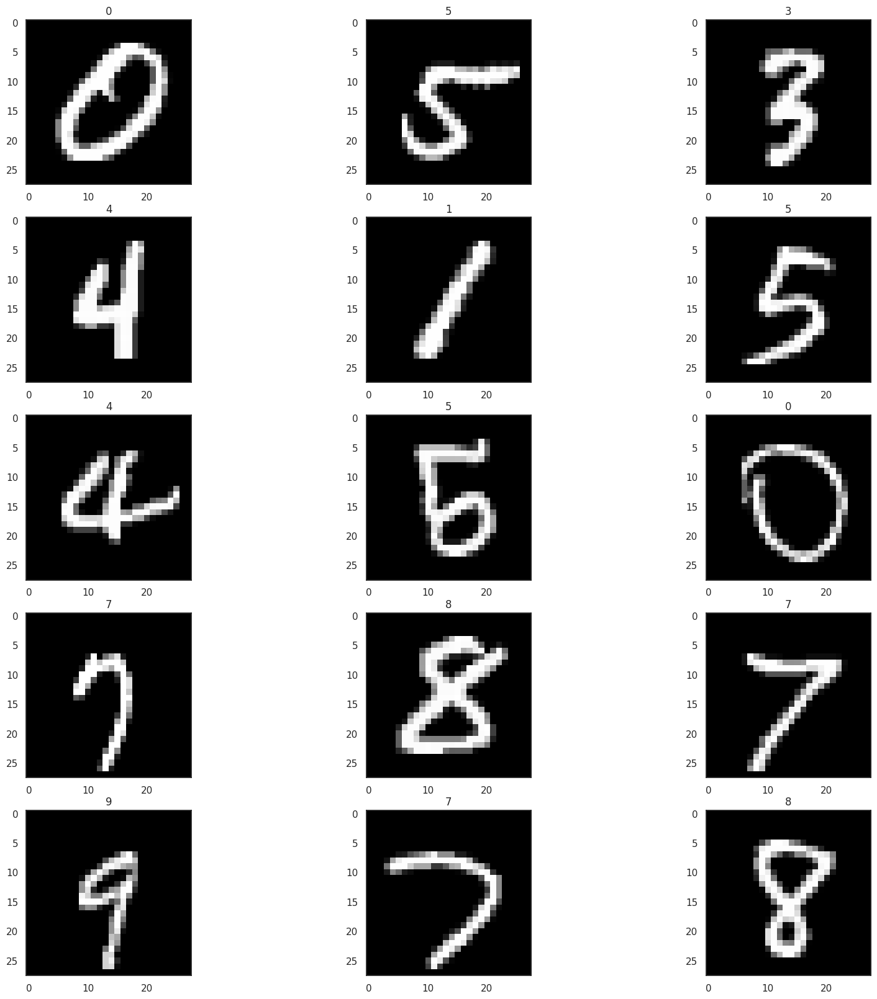

In [404]:
batch_size = 15
n_iters = 3000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)

train_loader = torch.utils.data.DataLoader(dataset=train_dataset, 
                                           batch_size=batch_size, 
                                           shuffle=True, drop_last=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset, 
                                          batch_size=batch_size, 
                                          shuffle=False)
image, label = next(train_loader.__iter__())

fig, axes = plt.subplots(5, 3, figsize=(20,20))

for img, lab, ax in zip(image, label, axes.flatten()):
    ax.imshow(img.squeeze(0),cmap='gray')
    ax.set_title(int(lab))
    

__Splitting the data into batches__

In [405]:
batch_size = 100
n_iters = 3000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)

train_loader = torch.utils.data.DataLoader(dataset=train_dataset, 
                                           batch_size=batch_size, 
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset, 
                                          batch_size=batch_size, 
                                          shuffle=False)

__Neural Network Model__

In [406]:
class FeedforwardNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(FeedforwardNNModel, self).__init__()
        # Input Layer
        self.fc1 = nn.Linear(input_dim, hidden_dim) 

        # Hidden Layer
        self.sigmoid = nn.Sigmoid()

        # Output Layer
        self.fc2 = nn.Linear(hidden_dim, output_dim)  

    def forward(self, x):
        # Input  # LINEAR
        out = self.fc1(x)

        # Hidden  # NON-LINEAR
        out = self.sigmoid(out)

        # Output/ (readout)  # LINEAR
        out = self.fc2(out)
        return out

__Instantiating our model__

NOTE: -> Input dimension: size of the image
            28 x 28 = 784
            
      -> Output dimension: 10
          (0,1,2,3,4,5,6,7,8,9) digits
          
      -> Hidden layer dimension: 100
          - Can be any number (the number of neurons)
          - larger number means a bigger model with more parameters
          - however, this requires more training samples to learn and converge to a good model
      

In [407]:
input_dim = 28*28
hidden_dim = 100
output_dim = 10

model = FeedforwardNNModel(input_dim, hidden_dim, output_dim)

The Loss function

In [408]:
criterion = nn.CrossEntropyLoss()

Optimization algorithm

List of optimizers available  

    - AdaDelta Class
    - AdaGrad Class
    - Adam Class
    - AdamW Class
    - SparseAdam Class
    - Adamax Class
    - LBFGS class
    - RMSprop class
    - Rprop class
    - SGD Class
    - ASGD class

In [409]:
learning_rate = 0.1

optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)  

Model parameters

In [410]:
model.parameters()

print(len(list(model.parameters())))

# FC Layer 1 Parameters 
print(list(model.parameters())[0].size())

# FC Layer 1 Bias Parameters
print(list(model.parameters())[1].size())

# FC Layer 2 Parameters
print(list(model.parameters())[2].size())

# FC Layer 2 Bias Parameters
print(list(model.parameters())[3].size())

4
torch.Size([100, 784])
torch.Size([100])
torch.Size([10, 100])
torch.Size([10])


In [411]:
iter = 0
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        # Load images with gradient accumulation capabilities
        images = images.view(-1, 28*28).requires_grad_()
        
        # Clear gradients w.r.t. parameters
        optimizer.zero_grad()
        
        # Forward pass to get output/logits
        outputs = model(images)
        
        # Calculate Loss: 
        loss = criterion(outputs, labels)
        
        # Getting gradients w.r.t. parameters
        loss.backward()
        
        # Updating parameters
        optimizer.step()
        
        iter += 1
        
        if iter % 500 == 0:
            # Calculate Accuracy         
            correct = 0
            total = 0
            # Iterate through test dataset
            for images, labels in test_loader:
                # Load images with gradient accumulation capabilities
                images = images.view(-1, 28*28).requires_grad_()
                
                # Forward pass only to get logits/output
                outputs = model(images)
                
                # Get predictions from the maximum value
                _, predicted = torch.max(outputs.data, 1)
                
                # Total number of labels
                total += labels.size(0)
                
                # Total correct predictions
                correct += (predicted == labels).sum()
            
            accuracy = 100 * correct / total
            
            # Print Loss
            print('Iteration: {}. Loss: {}. Accuracy: {}'.format(iter, loss.item(), accuracy))

            

Iteration: 500. Loss: 0.6425125598907471. Accuracy: 85.0999984741211
Iteration: 1000. Loss: 0.3934687077999115. Accuracy: 89.41000366210938
Iteration: 1500. Loss: 0.3670803904533386. Accuracy: 90.7300033569336
Iteration: 2000. Loss: 0.3162497282028198. Accuracy: 91.23999786376953
Iteration: 2500. Loss: 0.3696840703487396. Accuracy: 91.56999969482422
Iteration: 3000. Loss: 0.2460182011127472. Accuracy: 92.19999694824219


In [412]:


'''
STEP 1: LOADING DATASET
'''

train_dataset = dsets.MNIST(root='./data', 
                            train=True, 
                            transform=transforms.ToTensor(),
                            download=True)

test_dataset = dsets.MNIST(root='./data', 
                           train=False, 
                           transform=transforms.ToTensor())

'''
STEP 2: MAKING DATASET ITERABLE
'''

batch_size = 100
n_iters = 3000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)

train_loader = torch.utils.data.DataLoader(dataset=train_dataset, 
                                           batch_size=batch_size, 
                                           shuffle=True)

test_loader = torch.utils.data.DataLoader(dataset=test_dataset, 
                                          batch_size=batch_size, 
                                          shuffle=False)

'''
STEP 3: CREATE MODEL CLASS
'''

class FeedforwardNeuralNetModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(FeedforwardNeuralNetModel, self).__init__()
        # Linear function
        self.fc1 = nn.Linear(input_dim, hidden_dim) 
        # Non-linearity
        self.relu = nn.ReLU()
        # Linear function (readout)
        self.fc2 = nn.Linear(hidden_dim, output_dim)  
    
    def forward(self, x):
        # Linear function
        out = self.fc1(x)
        # Non-linearity
        out = self.relu(out)
        # Linear function (readout)
        out = self.fc2(out)
        return out
    
'''  
STEP 4: INSTANTIATE MODEL CLASS
'''
input_dim = 28*28
hidden_dim = 100
output_dim = 10

model = FeedforwardNeuralNetModel(input_dim, hidden_dim, output_dim)

#########################
#  USING GPU FOR MODEL #
#########################

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device)

'''
STEP 5: INSTANTIATE LOSS CLASS
'''
criterion = nn.CrossEntropyLoss()


'''
STEP 6: INSTANTIATE OPTIMIZER CLASS
'''
learning_rate = 0.1

optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

'''
STEP 7: TRAIN THE MODEL
'''
iter = 0
for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
        
        #########################
        #  USING GPU FOR DATA  #
        #########################
        images = images.view(-1, 28*28).requires_grad_().to(device)
        labels = labels.to(device)
        
        # Clear gradients w.r.t. parameters
        optimizer.zero_grad()
        
        # Forward pass to get output/logits
        outputs = model(images)
        
        # Calculate Loss: softmax --> cross entropy loss
        loss = criterion(outputs, labels)
        
        # Getting gradients w.r.t. parameters
        loss.backward()
        
        # Updating parameters
        optimizer.step()
        
        iter += 1
        
        if iter % 500 == 0:
            # Calculate Accuracy         
            correct = 0
            total = 0
            # Iterate through test dataset
            for images, labels in test_loader:

                images = images.view(-1, 28*28).requires_grad_().to(device)
                
                # Forward pass only to get logits/output
                outputs = model(images)
                
                # Get predictions from the maximum value
                _, predicted = torch.max(outputs.data, 1)
                
                # Total number of labels
                total += labels.size(0)

                # Total correct predictions
                if torch.cuda.is_available():
                    correct += (predicted.cpu() == labels.cpu()).sum()
                else:
                    correct += (predicted == labels).sum()
            
            accuracy = 100 * correct / total
            
            # Print Loss
            print('Iteration: {}. Loss: {}. Accuracy: {}'.format(iter, loss.item(), accuracy))

Iteration: 500. Loss: 0.37377601861953735. Accuracy: 91.30999755859375
Iteration: 1000. Loss: 0.2959437668323517. Accuracy: 92.51000213623047
Iteration: 1500. Loss: 0.411329448223114. Accuracy: 93.7699966430664
Iteration: 2000. Loss: 0.19908878207206726. Accuracy: 94.1500015258789
Iteration: 2500. Loss: 0.2851485013961792. Accuracy: 95.16999816894531
Iteration: 3000. Loss: 0.34058907628059387. Accuracy: 95.62000274658203


__Adding dropout layers__

Dropout - randomly drops out some fraction of a layer's input units every step of training, making it much harder for the network to learn any spurious/minute patterns in the training data. This can help correct overfitting 

Example: torch.nn.Dropout(p=0.5)



__Batch normalization__

A batch normalization layer first normalizes the batch with its own mean and standard deviation, and then also puts the data on a new scale. Batchnorm, in effect, performs a kind of coordinated rescaling of its inputs.



_While using Batchn norm and dropout layers, we do not these layers while evaluating the model._ 
model.eval() - will help with 'switching off' these layers. 

model.train() - will set the model back in the 'training mode'

## <center> ID5002W:Industrial AI Laboratory
### <center> Week-12 (part-1)
### <center> Convolutional Neural Networks

**Contents:** 
1. Convolution operation 
2. Image processing using the kernels
3. Downloading and looking in to the CIFAR10 dataset
4. Defining and training a CNN model
5. Visualizing the output from each of the convolutional layer



# Convolution operation

#Parameters of the below given network
input_channels: 1 <br>
ouput_channels: 1 <br>
stride_size: 1 <br>
kernel_size: 3*3 <br>
padding: 1 <br>

![convolution anim.gif](https://drive.google.com/uc?export=view&id=1KjhcyG1WB3Q3_UW1jSRub9PKIev1Evhz)

# Image processing using the kernels

In [413]:
# Defining a convolutional operation and plotting the input and output image
def convolve(image,kernel):
  '''
  image: A numpy array defining a greyscale image
  kernel: Kernel defining the convolutional operation (shape must be an odd number)
  '''
  image=image/255
  image_h = image.shape[0] # Image height
  image_w = image.shape[1] # Image width
  k_s = kernel.shape[0] # Kernel shape
  padded_image = np.zeros((image_h+k_s-1,image_w+k_s-1)) # zero padding
  temp=int((k_s-1)/2)
  padded_image[temp:-temp,temp:-temp] = image # Zero padded image
  new_image=[] # Empty list to store the outputs
  for r_p in range(image_h):
    for c_p in range(image_w):
      # Convolution operation
      sub_image = padded_image[r_p:r_p+k_s,c_p:c_p+k_s].flatten()
      output = np.dot(sub_image,kernel.flatten())
      # Appending the output
      new_image.append(output)
  output_image=np.array(new_image).reshape(image_h,image_w) # list to numpy array
  # plotting the image
  fig, ax = plt.subplots(1,2,figsize=(10,5))
  ax[0].imshow(np.clip(image,a_min=0,a_max=1),cmap='gray')
  ax[0].set_title('Original image')
  ax[1].imshow(np.clip(output_image,a_min=0,a_max=1),cmap='gray')
  ax[1].set_title('Convoluted image')
  return output_image

(320, 288, 3)
(320, 288)


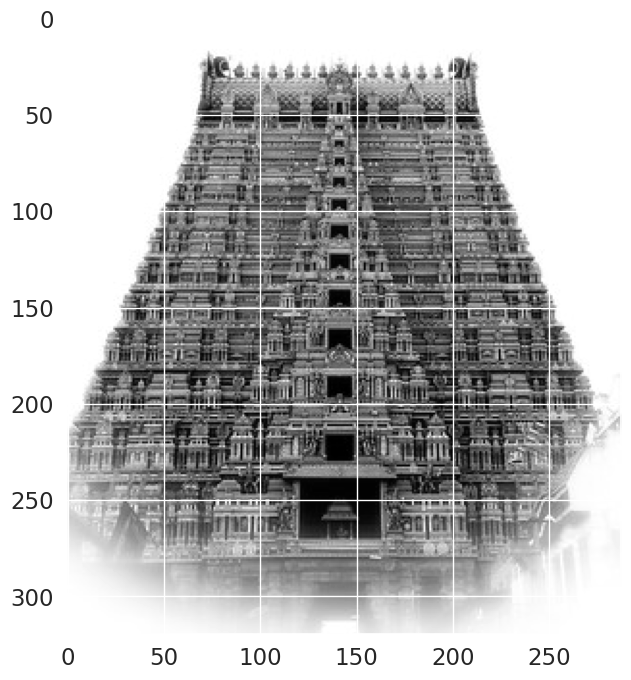

In [429]:
# loading the image
sri_img = mpimg.imread('Srirangam.jpg')
print(sri_img.shape)
sri_img = cv2.cvtColor(sri_img, cv2.COLOR_BGR2GRAY)
print(sri_img.shape)
plt.imshow(sri_img,cmap='gray')
plt.show()

# Blur kernel

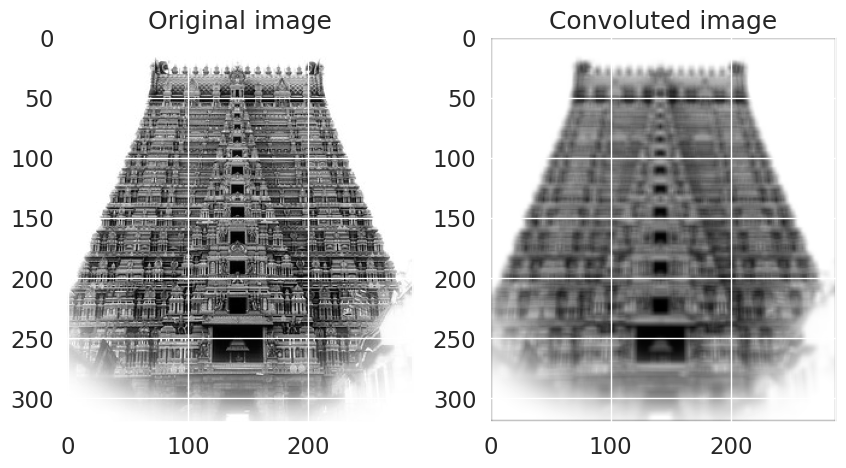

In [431]:
# kernel to blur the image
blur_kernel = np.ones((5,5))/(25)
output_image = convolve(sri_img,blur_kernel)

# Edge detection kernel

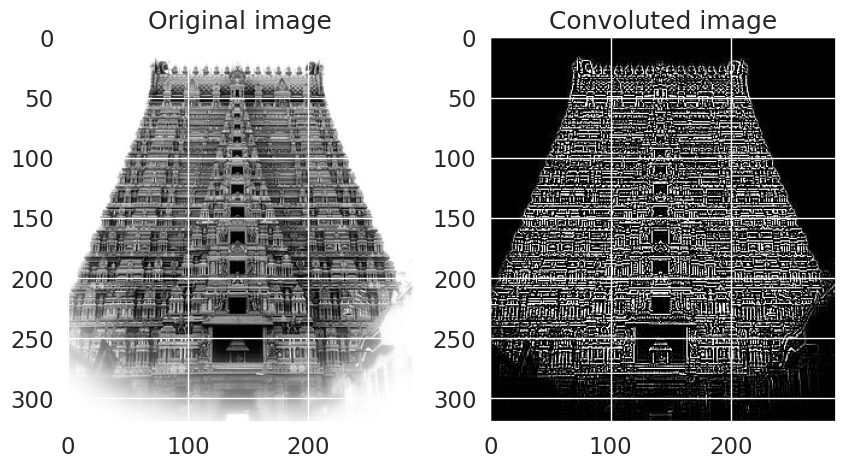

In [432]:
# kernel to detect the edges in an image
edge_kernel = np.array([[-1,-1,-1],
                         [-1,8,-1],
                         [-1,-1,-1]])
output_image = convolve(sri_img,edge_kernel)

# Kernel to sharpen the image

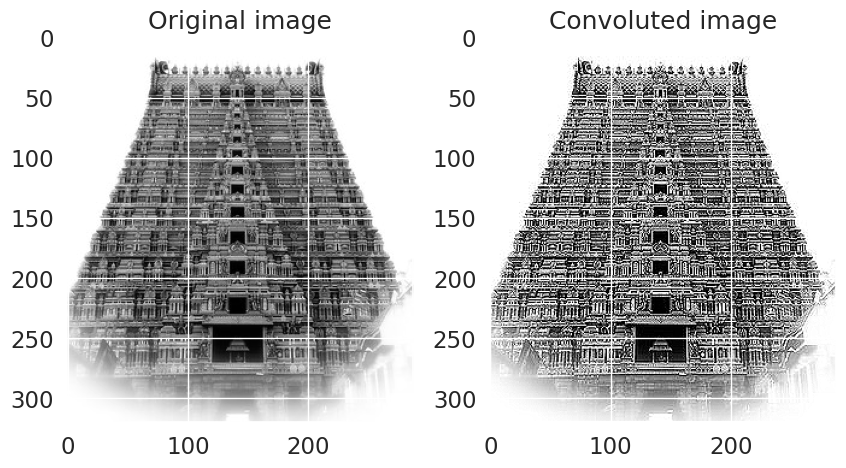

In [433]:
# kernel to sharpen an image
sharp_kernel = np.array([[0,-1,0],
                         [-1,5,-1],
                         [0,-1,0]])
output_image = convolve(sri_img,sharp_kernel)

# Downloading and looking in to the CIFAR10 dataset

In [435]:
from torchvision import datasets
# downloading the cifar10 dataset
train_data = datasets.CIFAR10(root="data",train=True,download=True,transform=ToTensor())

test_data = datasets.CIFAR10(root="data",train=False,download=True,transform=ToTensor())

# Labels of the images
label_class = ['plane', 'car', 'bird', 'cat','deer', 'dog', 'frog', 'horse', 'ship', 'truck']

100%|██████████| 170498071/170498071 [00:02<00:00, 57865525.68it/s]


Extracting data/cifar-10-python.tar.gz to data
Files already downloaded and verified


In [436]:
# Wrapping the train and test dataset to the iterative function "DataLoader"
traindataloader = DataLoader(train_data, batch_size=16, shuffle=True,num_workers = 2)
testdataloader = DataLoader(test_data, batch_size=8, shuffle=True,num_workers = 2)

In [439]:
print(type(traindataloader))

<class 'torch.utils.data.dataloader.DataLoader'>


In [458]:
# Size of the data
# Assuming 'traindataloader' is already defined
X_list = []
y_list = []

for i, (inputs, labels) in enumerate(traindataloader):
    # Store the inputs and labels in separate lists
    X_list.append(inputs)
    y_list.append(labels)

# Concatenate the tensors in the lists along the batch dimension (dim=0)
X = torch.cat(X_list, dim=0)
y = torch.cat(y_list, dim=0)

# Check the shape of the final tensors
print(X.shape)
print(y.shape)

#X, y = next(iter(traindataloader))
#print('The shape of the independent variable is',X.size())
#print('The shape of the independent variable is',y.size())

torch.Size([50000, 3, 32, 32])
torch.Size([50000])


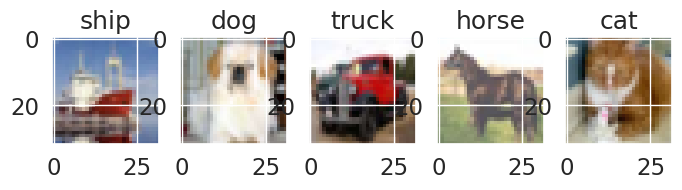

In [459]:
# Visualizing the images
fig,ax=plt.subplots(1,5,figsize=(8,2))
for i,a in enumerate(ax):
  img = X[i]
  n_label = y[i]
  a.imshow(img.permute(1, 2, 0))
  a.set_title(label_class[n_label])
plt.show()

# Defining and training a CNN model

In [460]:
class CNN_model(nn.Module):
  def __init__(self):
    super().__init__()
    self.conv_1=nn.Conv2d(in_channels=3, out_channels=7, kernel_size=5) # convolutional layer
    self.max_2=nn.MaxPool2d(2, 2) # Maxpooling layer
    self.conv_3=nn.Conv2d(in_channels=7, out_channels=15, kernel_size=3) # convolutional layer
    self.max_4=nn.MaxPool2d(2, 2) # Maxpooling layer
    self.lin_5=nn.Linear(540, 200) # fully connected layer
    self.lin_6=nn.Linear(200, 50) # fully connected layer
    self.lin_7=nn.Linear(50, 10) # fully connected layer
    
  def forward(self, x):
    x = self.max_2(F.relu(self.conv_1(x)))
    x = self.max_4(F.relu(self.conv_3(x)))
    x = torch.flatten(x, 1) # flatten all dimensions except batch
    x = F.relu(self.lin_5(x))
    x = F.relu(self.lin_6(x))
    x = F.relu(self.lin_7(x))
    return x

# To get the output values from the layers in between
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook


model = CNN_model()

In [461]:
# Check if GPU is available so that the model can be trained on a GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

CNN_model(
  (conv_1): Conv2d(3, 7, kernel_size=(5, 5), stride=(1, 1))
  (max_2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_3): Conv2d(7, 15, kernel_size=(3, 3), stride=(1, 1))
  (max_4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (lin_5): Linear(in_features=540, out_features=200, bias=True)
  (lin_6): Linear(in_features=200, out_features=50, bias=True)
  (lin_7): Linear(in_features=50, out_features=10, bias=True)
)

In [462]:
# defining the loss and the optimizer
loss_metric = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [463]:
# Training the model
for epoch in range(10): # Number of epochs
    running_loss = 0.0
    for i, data in enumerate(traindataloader, 0):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device) # to gpu
        optimizer.zero_grad() # zero the parameter gradients
        outputs = model(inputs) # Forward pass
        loss = loss_metric(outputs, labels) # Cross entropy loss
        loss.backward() # backward pass
        optimizer.step() # Optimizing the parameters
        running_loss += loss.item() # calculating the loss
    print(f'For epoch {epoch+1}: The loss is:{running_loss/3125}')
    running_loss = 0.0

For epoch 1: The loss is:2.1358347665405275
For epoch 2: The loss is:2.040834767074585
For epoch 3: The loss is:1.9909940677261353
For epoch 4: The loss is:1.9528950413513184
For epoch 5: The loss is:1.9193722731781007
For epoch 6: The loss is:1.892352240638733
For epoch 7: The loss is:1.864954291496277
For epoch 8: The loss is:1.8395441351509094
For epoch 9: The loss is:1.8128411655426024
For epoch 10: The loss is:1.791852524433136


In [464]:
# Test accuracy
correct = 0
total = 0
with torch.no_grad():
    for data in testdataloader:
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %d %%' % (
    100 * correct / total))

Accuracy of the network on the 10000 test images: 33 %


# Visualizing the outputs in each of the layers

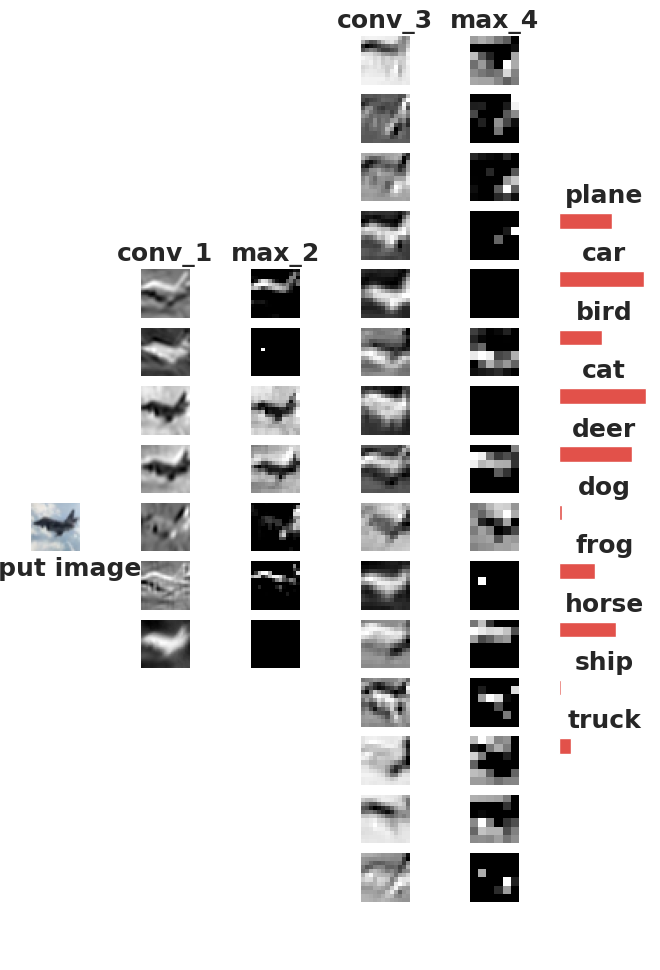

In [466]:
# Getting the outputs of each convolutional layers and the final linear layer
model.conv_1.register_forward_hook(get_activation('conv_1'))
model.max_2.register_forward_hook(get_activation('max_2'))
model.conv_3.register_forward_hook(get_activation('conv_3'))
model.max_4.register_forward_hook(get_activation('max_4'))
model.lin_7.register_forward_hook(get_activation('lin_7'))

#X, y = next(iter(traindataloader)) # loading a batch of training image data

X_list = []
y_list = []

for i, (inputs, labels) in enumerate(traindataloader):
    # Store the inputs and labels in separate lists
    X_list.append(inputs)
    y_list.append(labels)

# Concatenate the tensors in the lists along the batch dimension (dim=0)
X = torch.cat(X_list, dim=0)
y = torch.cat(y_list, dim=0)

X=X.to(device) # To GPU
img=X[0]# Picking only the first image
model_output = model(img.expand(1,3,32,32))  # getting the model output

n_plots=[7,7,15,15] # n_plots variable captures number of plots in a columns (= number of output channels)
layers=['conv_1','max_2','conv_3','max_4'] # layers corresponding to the above outputs

n_r=max(n_plots)+1 # Number of rows of subplots
n_c=len(n_plots)+2 # Number of columns of subplots

fig,ax = plt.subplots(n_r,n_c,figsize=(n_r*2,n_c*2),sharex='col',
                      subplot_kw={'frame_on':False,'xticks':[],'yticks':[]})
# Plotting the input image
ax[round(n_r/2)][0].imshow(img.cpu().permute(1, 2, 0))
ax[round(n_r/2)][0].set_xlabel('Input image',fontweight='bold')

# Plotting the outputs from each of the convoutional and max pooling layer
for i,p in enumerate(n_plots):
  output = activation[layers[i]]
  init_idx = round((n_r-p)/2)
  for j in range(p):
    ax[init_idx+j][(i+1)].imshow(output[0][j].cpu(),cmap='gray')
    if j==0:
      ax[init_idx+j][(i+1)].set_title(layers[i],fontweight='bold')

# Plotting the outputs in the final layer of the CNN
init_idx = round((n_r-10)/2)
output = F.softmax(activation['lin_7'],dim=-1)
for i in range(10):
  ax[init_idx+i][-1].barh(0,output[0][i].cpu())
  ax[init_idx+i][-1].set_ylim(-2,0.5)
  ax[init_idx+i][-1].set_title(label_class[i],fontweight='bold')
plt.subplots_adjust(left=0.2,right=0.4)

## <center> ID5002W:Industrial AI Laboratory
### <center> Week-12 (part-2)
### <center> Recurrent Neural Networks

**Contents:** 
1. Data preprocessing
2. Creating tensor dataset
3. Defining and training RNN model 
4. Test dataset performance evaluation


# Data pre-processing

# Data source: https://www.kaggle.com/datasets/namanj27/ner-dataset

In [ ]:
# Loading the dataset
df = pd.read_csv('ner_datasetreference.csv',encoding='latin1')
df.head()

In [ ]:
n_sentences = np.sum(df['Sentence #'].isna()==0) # total number of sentences
idx = np.where(df['Sentence #'].isna().values==0) # index of first word in a sentence
# Sentences is a list of lists (inner list will be the words in a sentence; outer list will be all the sentences)
# entities is a list of lists (inner list will be the tags in a sentence; outer list will be all the sentences)
sentences=[]
entities=[]
for i,j in enumerate(idx[0]):
  if j==idx[0][-1]:
    sentence = [k for k in df['Word'][j:]]
    entity = [k for k in df['Tag'][j:]]
  else:
    sentence = [k for k in df['Word'][j:idx[0][i+1]]]
    entity = [k for k in df['Tag'][j:idx[0][i+1]]]
  sentences.append(sentence)
  entities.append(entity)

In [ ]:
# Creating a dictionary that carry word to index and index to word info
uniq_words = np.sort(df['Word'].unique()) # all unique words
uniq_words = np.concatenate((uniq_words,np.array(['end_pad']))) # appending with end tag

word_2_idx = {j:i for i,j in enumerate(uniq_words)}
idx_2_word = {i:j for i,j in enumerate(uniq_words)}

In [ ]:
# Creating a dictionary that carry entity to index and index to entity info
uniq_tags = np.sort(df['Tag'].unique()) # all unique tags
uniq_tags = np.concatenate((uniq_tags,np.array(['end_pad']))) # appeding with end tag

tag_2_idx = {j:i for i,j in enumerate(uniq_tags)}
idx_2_tag = {i:j for i,j in enumerate(uniq_tags)}

In [ ]:
# replacing the words and tags with the indices
X,y = [],[]
for sent,ent in zip(sentences,entities):
  item1 = [word_2_idx[i] for i in sent]
  item2 = [tag_2_idx[i] for i in ent]
  X.append(item1)
  y.append(item2)

In [ ]:
X = [torch.tensor(i) for i in X] # Converting the list to tensor
X = nn.utils.rnn.pad_sequence(X,batch_first =True, padding_value=word_2_idx['end_pad']) # Padding all the sentences with end pad
print(X.shape)

In [ ]:
y = [torch.tensor(i) for i in y] # Converting the list to tensor
y = nn.utils.rnn.pad_sequence(y,batch_first =True, padding_value=tag_2_idx['end_pad']) # Padding all the sentences with end pad
print(y.shape)

# Summary of data preprocessing

1. Created a variable 'X' of shape --> (number of sentences, max_length)
2. Created a variable 'y' of shape --> (number of sentences, max_length, number of entities)
3. Created variables 'word_2_idx' and 'idx_2_word' that maps word to index and index to word respectively
4. Created variables 'tag_2_idx' and 'idx_2_tag' that maps entities to index and index to entities respectively

# Creating tensor dataset

In [ ]:
# train test split
Xtrain, Xtest, ytrain, ytest = train_test_split(X,y,test_size = 0.2,random_state = 42) 

In [ ]:
# Pytorch train and test sets
train = TensorDataset(Xtrain,ytrain)
test = TensorDataset(Xtest,ytest)

batch_size =16

# data loader
train_loader = DataLoader(train, batch_size = batch_size, shuffle = True)
test_loader = DataLoader(test, batch_size = batch_size, shuffle = True)

# Defining and training RNN model 

In [ ]:
# Defining the model
class RNN_model(nn.Module):
  def __init__(self,n_words,embedding_size,padding_idx,output_size,hidden_dim,n_rnn_layers):
    super().__init__()
    # RNN layers
    self.emb_1 = nn.Embedding(num_embeddings=n_words, embedding_dim=embedding_size, padding_idx=padding_idx)
    self.rnn_2 = nn.RNN(input_size=embedding_size, hidden_size=hidden_dim, num_layers=n_rnn_layers, nonlinearity='relu',batch_first=True) 
    self.lin_3 = nn.Linear(hidden_dim, output_size)
    
  def forward(self, x):
    output = self.emb_1(x)
    output, hs = self.rnn_2(output)
    output = self.lin_3(output)
    return output

In [ ]:
# number of words
n_words = len(word_2_idx.keys())
embedding_size = 50
padding_idx = word_2_idx['end_pad']
output_size = 18
hidden_dim = 50
n_rnn_layers =2

# Check if GPU is available so that the model can be trained on a GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initializing the model
model = RNN_model(n_words,embedding_size,padding_idx,output_size,hidden_dim,n_rnn_layers)

model.to(device)

In [ ]:
# defining the loss and the optimizer
loss_metric = nn.CrossEntropyLoss(ignore_index=padding_idx)
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [ ]:
# Training the model
for epoch in range(5): # Number of epochs
    running_loss = 0.0
    for i, data in enumerate(train_loader):
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device) # to gpu
        optimizer.zero_grad() # zero the parameter gradients
        outputs = model(inputs) # Forward pass
        loss = loss_metric(outputs.view(-1,output_size), labels.view(-1)) # Cross entropy loss
        loss.backward() # backward pass
        optimizer.step() # Optimizing the parameters
        running_loss += loss.item() # calculating the loss
    print(f'For epoch {epoch+1}: The loss is:{running_loss/i}')
    running_loss = 0.0

# Test dataset performance evaluation

In [ ]:
accuracy = Accuracy(task='multiclass', num_classes=18,ignore_index=tag_2_idx['end_pad']).to(device)
# Test accuracy
acc= []
with torch.no_grad():
    for data in test_loader:
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        acc_metric = accuracy(outputs.view(-1,output_size), labels.view(-1))
        acc.append(acc_metric)
print('The accuracy of the model in test dataset is',torch.mean(torch.tensor(acc)).item())